# 손실 함수 비교 : CrossEntropy Loss vs MSE Loss (with softmax)

## 데이터 셋 전처리

In [1]:
! pip install scikit-learn
! pip install tensorflow
! pip install numpy
! pip install torch

In [2]:
import sklearn.datasets as dataset
import tensorflow as tf
from tensorflow.keras import datasets
import numpy as np
import random

In [3]:
import torch.nn as nn
import torch
import tqdm

In [4]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [5]:
# Fashion Mnist 데이터 셋 구성
(train_x, train_y), (test_x, test_y) = datasets.fashion_mnist.load_data()

In [6]:
## 입력 데이터 Flatten (평탄화)
train_x_flatten = train_x.reshape(train_x.shape[0], -1).astype(np.float32)
test_x_flatten = test_x.reshape(test_x.shape[0], -1).astype(np.float32)

## 입력 데이터 Scaling (Min-Max)
train_x_flatten = train_x_flatten / 255.0
test_x_flatten = test_x_flatten / 255.0

In [7]:
class fashion_mnist_dataset(torch.utils.data.Dataset):
  def __init__(self, x_y : tuple):
    self.X, self.y = x_y
  def __getitem__(self, index):
    return self.X[index], self.y[index]
  def __len__(self):
    return len(self.X)

In [8]:
train_y = torch.from_numpy(train_y)
train_fashion_mnist_dataset = fashion_mnist_dataset((torch.from_numpy(train_x_flatten), torch.nn.functional.one_hot(train_y.type(torch.LongTensor)).type(torch.float32)))

/tmp/ipykernel_7129/3663202469.py:1: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:213.)
  train_y = torch.from_numpy(train_y)


In [9]:
train_dataloader = torch.utils.data.DataLoader(train_fashion_mnist_dataset, batch_size=32, shuffle=True)

## MSE Model 구축

In [10]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
MSE_model = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes),   # 출력층 (128 → 클래스 개수)
    nn.Softmax()
)

In [11]:
# MSE Loss 기반 모델 학습 함수
def train_model_MSE(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer,
    device
):

  # optimizer 설정
  # 현재 Adam 사용
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )

  # epoch별 loss 저장
  lossPerEpoch = []

  # epoch별 accuracy 저장
  accurcyPerEpoch = []

  # epoch별 gradient 저장
  weightGradPerEpoch = []

  # epoch별 activation 저장
  activationPerEpoch = []

  # epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적용 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # epoch loss 초기화
    lossOneEpoch = 0.0

    # epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 데이터를 GPU(device)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # train mode 활성화
      model.train(True)

      # forward propagation
      output = model(batch_data)

      # MSE Loss 계산
      # MSE 사용 시 softmax를 직접 적용해야 함
      result = loss(
          output,
          batch_label
      )

      # 이전 gradient 초기화
      optimizer.zero_grad()

      # backward propagation
      result.backward()

      # parameter update
      optimizer.step()

      # accuracy 계산
      # output의 argmax와 label의 argmax 비교
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              torch.argmax(batch_label, dim=1)
          )
          / 32
          / len(dataloader)
      )
      # batch loss 누적
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )
      model.eval()
      # 각 layer의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        # abs 사용 이유:
        # gradient의 양수/음수 상쇄 방지
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.ReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

                # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [12]:
loss = nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
MSE_model = MSE_model.to(device)
history_MSE = train_model_MSE(train_dataloader, MSE_model, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.SGD, device = device)

  0%|          | 0/1875 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1776: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)
100%|██████████| 1875/1875 [00:05<00:00, 354.35it/s]


Epoch 0 Loss : 0.08967748389641444
Epoch 0 accurcy : 0.16560067236423492


100%|██████████| 1875/1875 [00:04<00:00, 450.22it/s]


Epoch 1 Loss : 0.08876562402645748
Epoch 1 accurcy : 0.25611674785614014


100%|██████████| 1875/1875 [00:04<00:00, 455.34it/s]


Epoch 2 Loss : 0.08756388409535079
Epoch 2 accurcy : 0.461434006690979


100%|██████████| 1875/1875 [00:04<00:00, 451.53it/s]


Epoch 3 Loss : 0.08565576134522762
Epoch 3 accurcy : 0.5612010955810547


100%|██████████| 1875/1875 [00:04<00:00, 458.02it/s]


Epoch 4 Loss : 0.08231121673186627
Epoch 4 accurcy : 0.46004992723464966


100%|██████████| 1875/1875 [00:04<00:00, 453.86it/s]


Epoch 5 Loss : 0.07694881149530405
Epoch 5 accurcy : 0.41910040378570557


100%|██████████| 1875/1875 [00:04<00:00, 455.77it/s]


Epoch 6 Loss : 0.07045671614607184
Epoch 6 accurcy : 0.5152848958969116


100%|██████████| 1875/1875 [00:04<00:00, 438.11it/s]


Epoch 7 Loss : 0.06349008461634303
Epoch 7 accurcy : 0.5818349719047546


100%|██████████| 1875/1875 [00:04<00:00, 445.71it/s]


Epoch 8 Loss : 0.057046985433498947
Epoch 8 accurcy : 0.6272685527801514


100%|██████████| 1875/1875 [00:04<00:00, 376.06it/s]


Epoch 9 Loss : 0.052019837212562564
Epoch 9 accurcy : 0.6507523059844971


100%|██████████| 1875/1875 [00:04<00:00, 452.60it/s]


Epoch 10 Loss : 0.04826693543295071
Epoch 10 accurcy : 0.6593689322471619


100%|██████████| 1875/1875 [00:04<00:00, 456.06it/s]


Epoch 11 Loss : 0.0455018337657054
Epoch 11 accurcy : 0.6681858897209167


100%|██████████| 1875/1875 [00:04<00:00, 452.09it/s]


Epoch 12 Loss : 0.04340530881484344
Epoch 12 accurcy : 0.6817865967750549


100%|██████████| 1875/1875 [00:04<00:00, 462.40it/s]


Epoch 13 Loss : 0.0417306279728811
Epoch 13 accurcy : 0.6985872387886047


100%|██████████| 1875/1875 [00:04<00:00, 456.11it/s]


Epoch 14 Loss : 0.04030650715430586
Epoch 14 accurcy : 0.7155038714408875


100%|██████████| 1875/1875 [00:04<00:00, 457.55it/s]


Epoch 15 Loss : 0.039022619194785675
Epoch 15 accurcy : 0.7297870516777039


100%|██████████| 1875/1875 [00:04<00:00, 456.00it/s]


Epoch 16 Loss : 0.03784498513489961
Epoch 16 accurcy : 0.7417199015617371


100%|██████████| 1875/1875 [00:04<00:00, 451.34it/s]


Epoch 17 Loss : 0.03672271299064155
Epoch 17 accurcy : 0.7510533928871155


100%|██████████| 1875/1875 [00:04<00:00, 459.43it/s]


Epoch 18 Loss : 0.03569752964725099
Epoch 18 accurcy : 0.7591867446899414


100%|██████████| 1875/1875 [00:04<00:00, 379.35it/s]


Epoch 19 Loss : 0.03473028638313207
Epoch 19 accurcy : 0.7663367986679077


100%|██████████| 1875/1875 [00:04<00:00, 452.39it/s]


Epoch 20 Loss : 0.033841018364826864
Epoch 20 accurcy : 0.7739695906639099


100%|██████████| 1875/1875 [00:04<00:00, 458.58it/s]


Epoch 21 Loss : 0.03303149477938816
Epoch 21 accurcy : 0.7788368463516235


100%|██████████| 1875/1875 [00:04<00:00, 455.95it/s]


Epoch 22 Loss : 0.03228641958435379
Epoch 22 accurcy : 0.7852863073348999


100%|██████████| 1875/1875 [00:04<00:00, 440.88it/s]


Epoch 23 Loss : 0.03161719948053358
Epoch 23 accurcy : 0.7901701331138611


100%|██████████| 1875/1875 [00:04<00:00, 454.24it/s]


Epoch 24 Loss : 0.031014665139218224
Epoch 24 accurcy : 0.7945030331611633


100%|██████████| 1875/1875 [00:04<00:00, 456.12it/s]


Epoch 25 Loss : 0.030452268276115302
Epoch 25 accurcy : 0.7985520362854004


100%|██████████| 1875/1875 [00:04<00:00, 457.99it/s]


Epoch 26 Loss : 0.02996086682577932
Epoch 26 accurcy : 0.8019198179244995


100%|██████████| 1875/1875 [00:04<00:00, 465.49it/s]


Epoch 27 Loss : 0.029491527057190707
Epoch 27 accurcy : 0.8052016496658325


100%|██████████| 1875/1875 [00:04<00:00, 456.53it/s]


Epoch 28 Loss : 0.029061213756601038
Epoch 28 accurcy : 0.8080680966377258


100%|██████████| 1875/1875 [00:04<00:00, 375.92it/s]

Epoch 29 Loss : 0.028662672222157324
Epoch 29 accurcy : 0.8108183741569519


In [13]:
import matplotlib.pyplot as plt

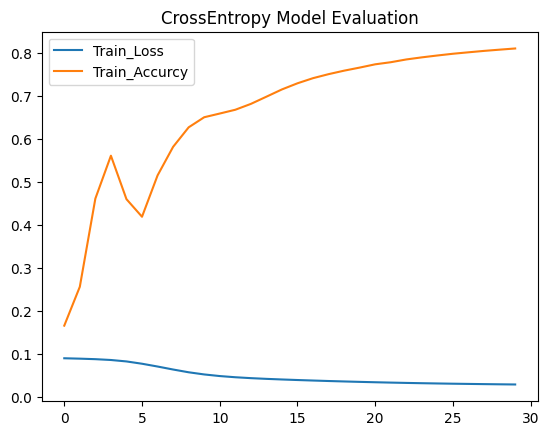

In [14]:
plt.title("CrossEntropy Model Evaluation")
plt.plot(history_MSE[0], label='Train_Loss')
for i in range(len(history_MSE[1])):
  history_MSE[1][i] = history_MSE[1][i].cpu()
plt.plot(history_MSE[1], label='Train_Accurcy')
plt.legend()
plt.show()

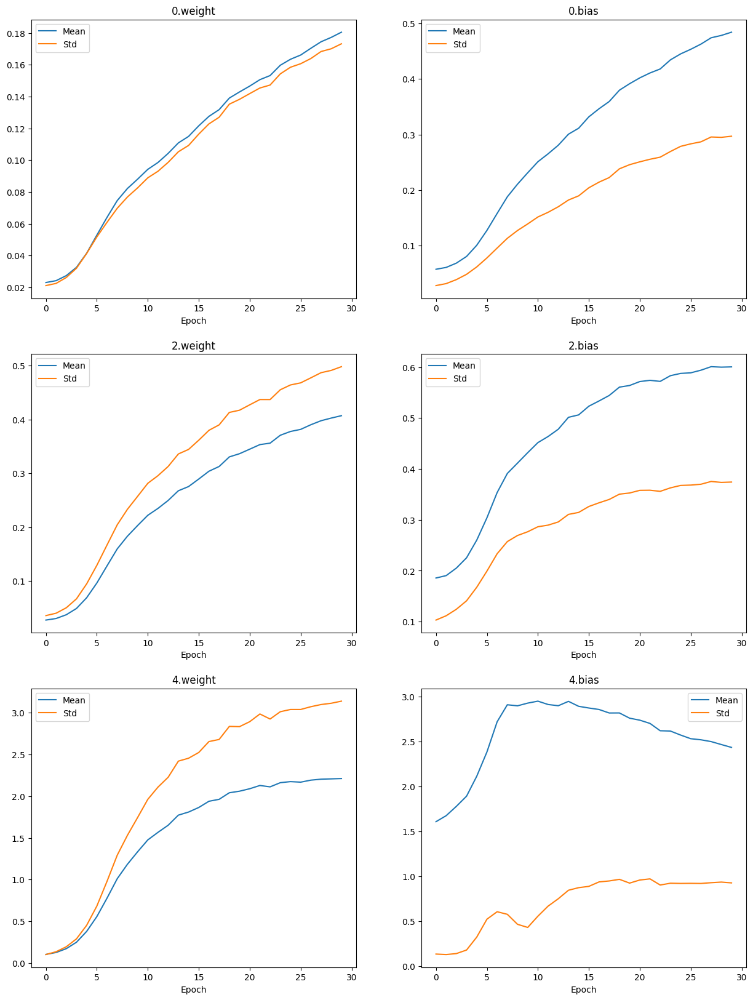

In [15]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,20))
for k, name in enumerate(history_MSE[2][0]):
  plt.subplot(3,2, 1+k)
  mean = []
  std = []
  for i in range(len(history_MSE[2])):
    flatten_tensor = history_MSE[2][i][name].detach().cpu().flatten()
    mean.append(flatten_tensor.mean())
    std.append(flatten_tensor.std())

  plt.plot(mean, label="Mean")
  plt.plot(std, label="Std")

  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

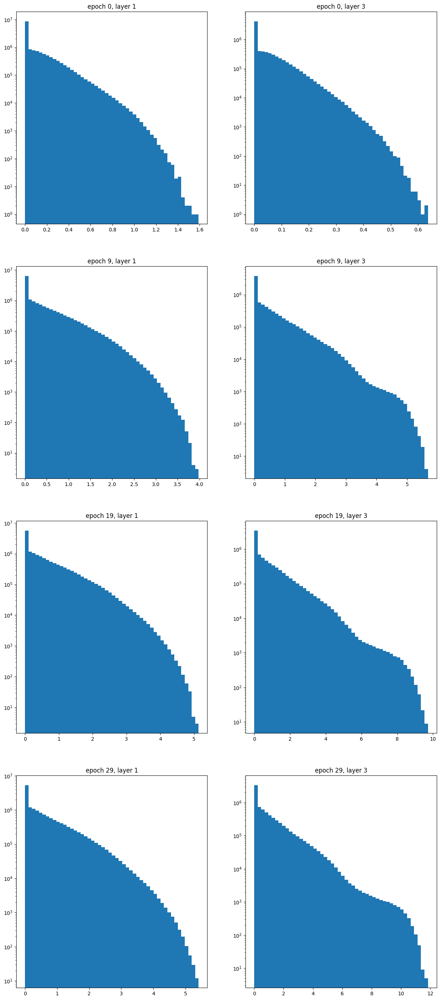

In [16]:
plt.figure(figsize=(15,35))
for j, i in enumerate(activation_list):
  for k, name in enumerate(history_MSE[3][0]):
    plt.subplot(4, 2, 1+k+2*j)
    all_act = torch.cat(
      history_MSE[3][i][name]
    )
    plt.yscale("log")
    plt.title(f"epoch {i}, layer {name}")
    plt.hist(all_act.numpy(), bins=50)
plt.show()

## CrossEntropy 모델 구축

In [17]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
CrossEntropy_model = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)

In [18]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_Cross(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )

  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              torch.argmax(batch_label, dim=1)
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.ReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [19]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CrossEntropy_model = CrossEntropy_model.to(device)
history_Cross = train_model_Cross(train_dataloader, CrossEntropy_model, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.SGD, device = device)

100%|██████████| 1875/1875 [00:04<00:00, 377.12it/s]


Epoch 0 Loss : 1.0524183914979297
Epoch 0 accurcy : 0.6518696546554565


100%|██████████| 1875/1875 [00:04<00:00, 436.11it/s]


Epoch 1 Loss : 0.5728913984537116
Epoch 1 accurcy : 0.8004022836685181


100%|██████████| 1875/1875 [00:04<00:00, 447.41it/s]


Epoch 2 Loss : 0.4960320285161338
Epoch 2 accurcy : 0.8259182572364807


100%|██████████| 1875/1875 [00:04<00:00, 453.27it/s]


Epoch 3 Loss : 0.4592951170086859
Epoch 3 accurcy : 0.8390343189239502


100%|██████████| 1875/1875 [00:04<00:00, 456.29it/s]


Epoch 4 Loss : 0.4368114943583799
Epoch 4 accurcy : 0.8469164967536926


100%|██████████| 1875/1875 [00:04<00:00, 450.75it/s]


Epoch 5 Loss : 0.41789426515897116
Epoch 5 accurcy : 0.8539829850196838


100%|██████████| 1875/1875 [00:04<00:00, 455.70it/s]


Epoch 6 Loss : 0.40496534188191147
Epoch 6 accurcy : 0.8580169677734375


100%|██████████| 1875/1875 [00:04<00:00, 455.52it/s]


Epoch 7 Loss : 0.39191376908222875
Epoch 7 accurcy : 0.8627163171768188


100%|██████████| 1875/1875 [00:04<00:00, 432.16it/s]


Epoch 8 Loss : 0.38011293833653165
Epoch 8 accurcy : 0.8654160499572754


100%|██████████| 1875/1875 [00:05<00:00, 373.91it/s]


Epoch 9 Loss : 0.3702668028235436
Epoch 9 accurcy : 0.8685330152511597


100%|██████████| 1875/1875 [00:04<00:00, 441.87it/s]


Epoch 10 Loss : 0.3596954652309416
Epoch 10 accurcy : 0.8714320063591003


100%|██████████| 1875/1875 [00:04<00:00, 451.08it/s]


Epoch 11 Loss : 0.3510636137366296
Epoch 11 accurcy : 0.8764992952346802


100%|██████████| 1875/1875 [00:04<00:00, 441.28it/s]


Epoch 12 Loss : 0.34331930288473755
Epoch 12 accurcy : 0.876616358757019


100%|██████████| 1875/1875 [00:04<00:00, 444.06it/s]


Epoch 13 Loss : 0.33497384119033796
Epoch 13 accurcy : 0.8802326321601868


100%|██████████| 1875/1875 [00:04<00:00, 448.82it/s]


Epoch 14 Loss : 0.3280287805557245
Epoch 14 accurcy : 0.8826000094413757


100%|██████████| 1875/1875 [00:04<00:00, 448.73it/s]


Epoch 15 Loss : 0.3210593480507536
Epoch 15 accurcy : 0.8852828145027161


100%|██████████| 1875/1875 [00:04<00:00, 444.26it/s]


Epoch 16 Loss : 0.314909491290649
Epoch 16 accurcy : 0.8878656029701233


100%|██████████| 1875/1875 [00:04<00:00, 448.09it/s]


Epoch 17 Loss : 0.30886685935258895
Epoch 17 accurcy : 0.888783872127533


100%|██████████| 1875/1875 [00:04<00:00, 444.56it/s]


Epoch 18 Loss : 0.3025645677884416
Epoch 18 accurcy : 0.8911325335502625


100%|██████████| 1875/1875 [00:05<00:00, 369.08it/s]


Epoch 19 Loss : 0.2973072017828619
Epoch 19 accurcy : 0.8916656374931335


100%|██████████| 1875/1875 [00:04<00:00, 433.95it/s]


Epoch 20 Loss : 0.29119295088450126
Epoch 20 accurcy : 0.8954323530197144


100%|██████████| 1875/1875 [00:04<00:00, 448.26it/s]


Epoch 21 Loss : 0.28610165715614916
Epoch 21 accurcy : 0.896499752998352


100%|██████████| 1875/1875 [00:04<00:00, 444.36it/s]


Epoch 22 Loss : 0.28109304331143636
Epoch 22 accurcy : 0.8975494503974915


100%|██████████| 1875/1875 [00:04<00:00, 451.61it/s]


Epoch 23 Loss : 0.27609943557977695
Epoch 23 accurcy : 0.8995491862297058


100%|██████████| 1875/1875 [00:04<00:00, 438.06it/s]


Epoch 24 Loss : 0.2716488495031999
Epoch 24 accurcy : 0.9015160799026489


100%|██████████| 1875/1875 [00:04<00:00, 446.02it/s]


Epoch 25 Loss : 0.2673917496959366
Epoch 25 accurcy : 0.9030160307884216


100%|██████████| 1875/1875 [00:04<00:00, 445.50it/s]


Epoch 26 Loss : 0.2629067855676014
Epoch 26 accurcy : 0.9046989679336548


100%|██████████| 1875/1875 [00:04<00:00, 441.31it/s]


Epoch 27 Loss : 0.2590006026575959
Epoch 27 accurcy : 0.9061494469642639


100%|██████████| 1875/1875 [00:04<00:00, 446.06it/s]


Epoch 28 Loss : 0.25562988184889157
Epoch 28 accurcy : 0.9077495336532593


100%|██████████| 1875/1875 [00:05<00:00, 368.08it/s]

Epoch 29 Loss : 0.2503448595335081
Epoch 29 accurcy : 0.9093994498252869


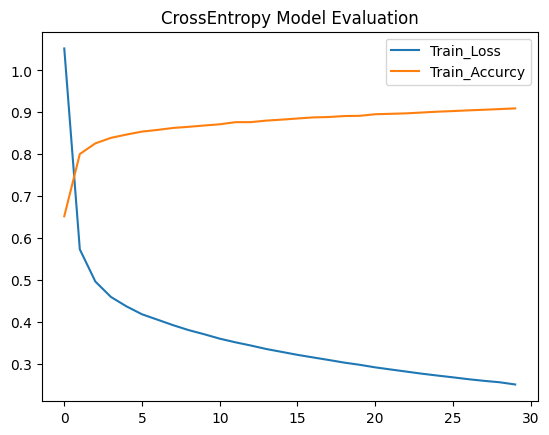

In [20]:
plt.title("CrossEntropy Model Evaluation")
plt.plot(history_Cross[0], label='Train_Loss')
for i in range(len(history_Cross[1])):
  history_Cross[1][i] = history_Cross[1][i].cpu()
plt.plot(history_Cross[1], label='Train_Accurcy')
plt.legend()
plt.show()

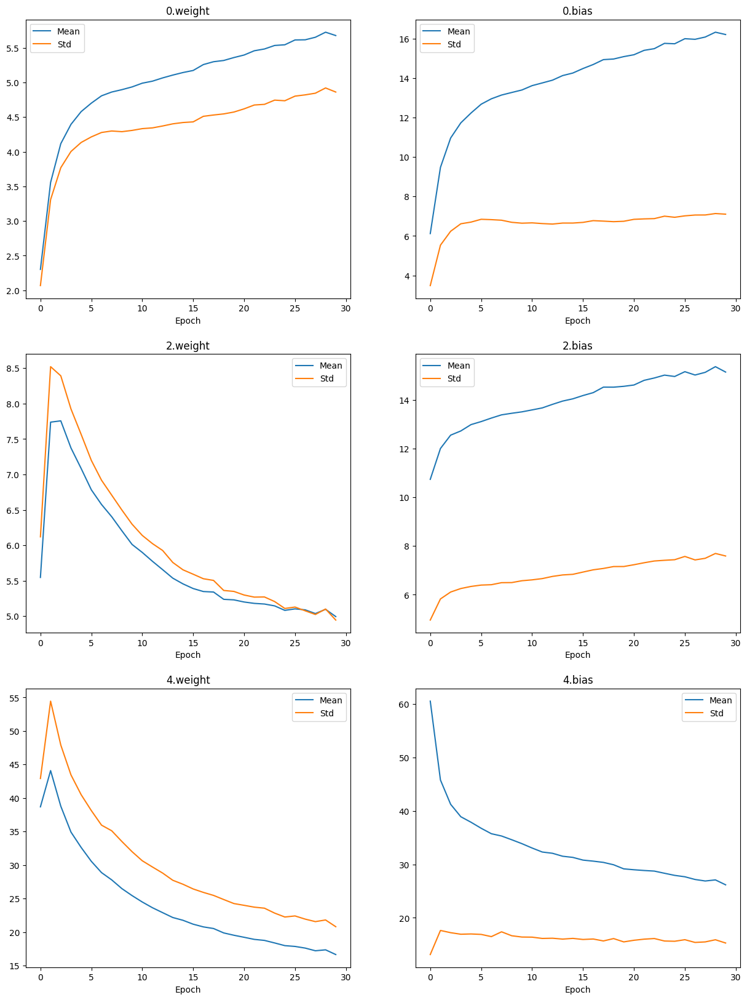

In [21]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,20))
for k, name in enumerate(history_Cross[2][0]):
  plt.subplot(3,2, 1+k)
  mean = []
  std = []
  for i in range(len(history_Cross[2])):
    flatten_tensor = history_Cross[2][i][name].detach().cpu().flatten()
    mean.append(flatten_tensor.mean())
    std.append(flatten_tensor.std())

  plt.plot(mean, label="Mean")
  plt.plot(std, label="Std")

  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

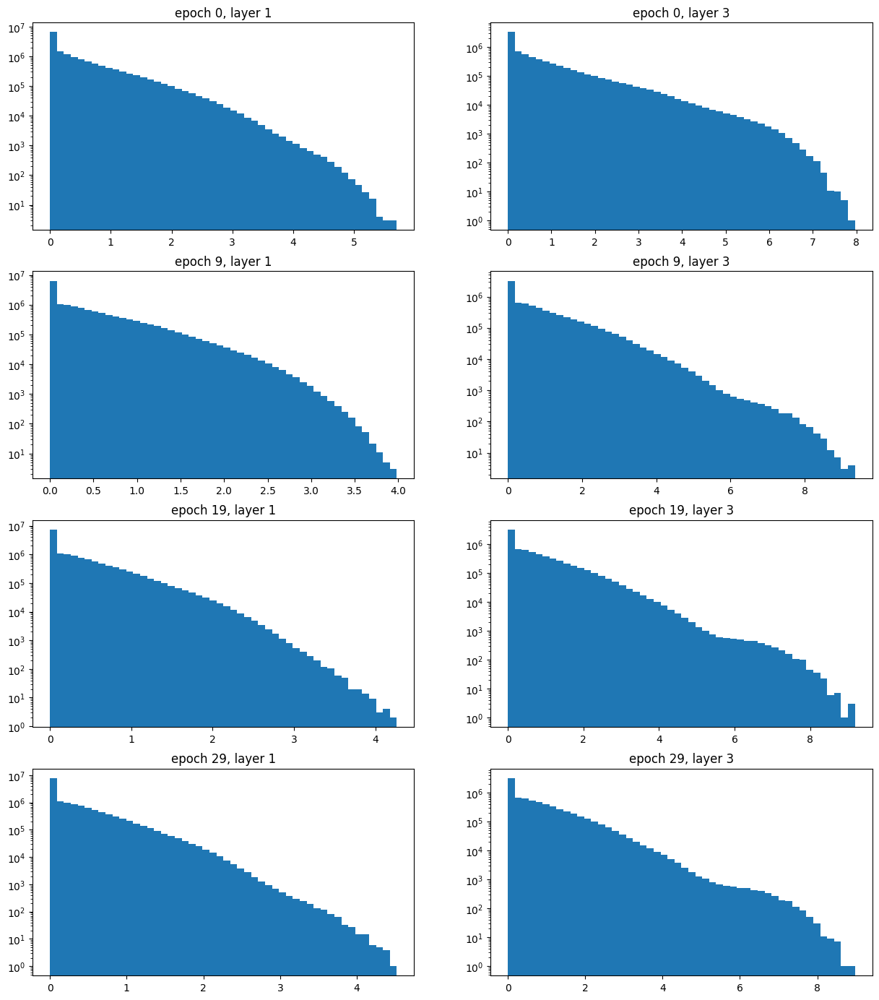

In [22]:
plt.figure(figsize=(15,35))
for j, i in enumerate([0, 9, 19, 29]):
  for k, name in enumerate(history_Cross[3][0]):
    plt.subplot(8, 2, 1+k+2*j)
    all_act = torch.cat(
      history_Cross[3][i][name]
    )
    plt.yscale("log")
    plt.title(f"epoch {i}, layer {name}")
    plt.hist(all_act.numpy(), bins=50)
plt.show()

## 두 Model간 Gradient 비교

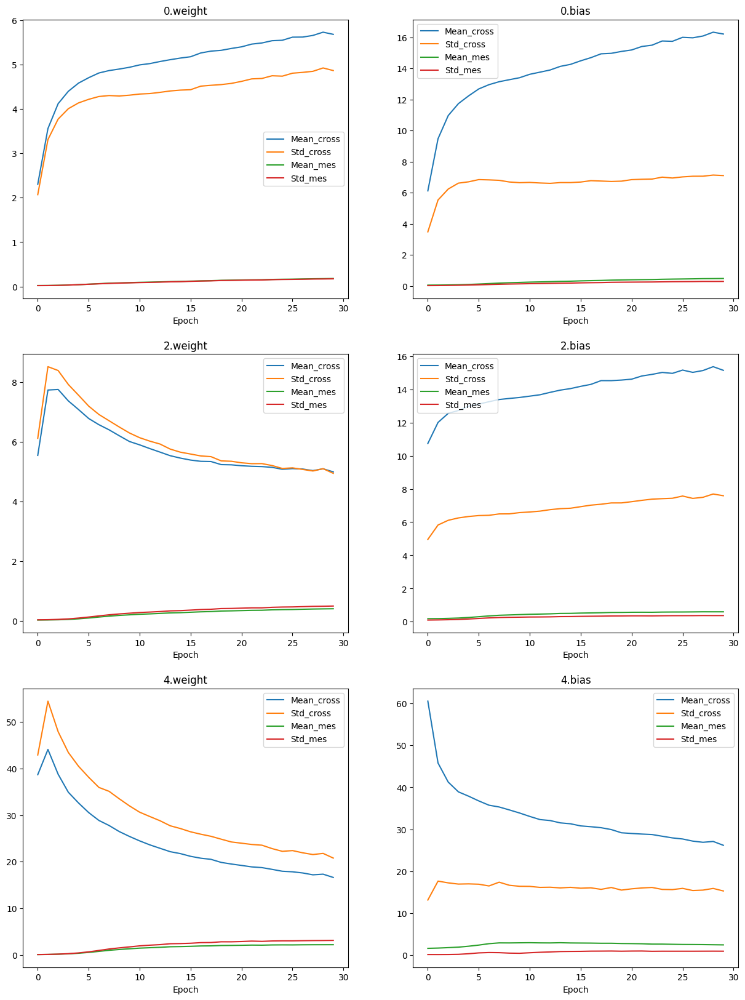

In [23]:
plt.figure(figsize=(15,20))
for k, name in enumerate(history_Cross[2][0]):
  plt.subplot(3, 2, 1+k)
  mean_cross = []
  std_cross = []
  mean_mse = []
  std_mse = []
  for i in range(len(history_Cross[2])):
    flatten_tensor = history_Cross[2][i][name].detach().cpu().flatten()
    mean_cross.append(flatten_tensor.mean())
    std_cross.append(flatten_tensor.std())
    flatten_tensor = history_MSE[2][i][name].detach().cpu().flatten()
    mean_mse.append(flatten_tensor.mean())
    std_mse.append(flatten_tensor.std())

  plt.plot(mean_cross, label="Mean_cross")
  plt.plot(std_cross, label="Std_cross")
  plt.plot(mean_mse, label="Mean_mes")
  plt.plot(std_mse, label="Std_mes")

  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

## 두 모델간 Accurcy 비교

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44368 (\N{HANGUL SYLLABLE GYO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


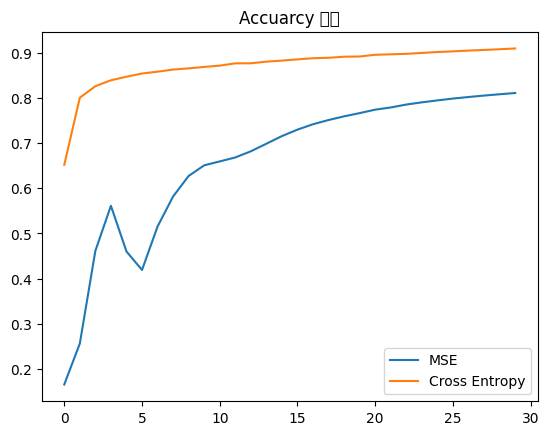

In [24]:
plt.title("Accuarcy 비교")
for i in range(len(history_MSE[1])):
  history_MSE[1][i] = history_MSE[1][i].cpu()
plt.plot(history_MSE[1], label='MSE')
for i in range(len(history_MSE[1])):
  history_Cross[1][i] = history_Cross[1][i].cpu()
plt.plot(history_Cross[1], label='Cross Entropy')
plt.legend()
plt.show()

## 메모리 해제

In [25]:
del history_Cross
del history_MSE

# 활성화 함수 비교 :  ReLU vs LeakyReLU vs Sigmoid

## 데이터 셋 전처리

In [26]:
! pip install scikit-learn
! pip install numpy
! pip install torch

In [27]:
import sklearn.datasets as dataset
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch
import tqdm
import random

In [28]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [29]:
X, y  = dataset.make_moons(1000, noise=0.05, shuffle=True, random_state=42)

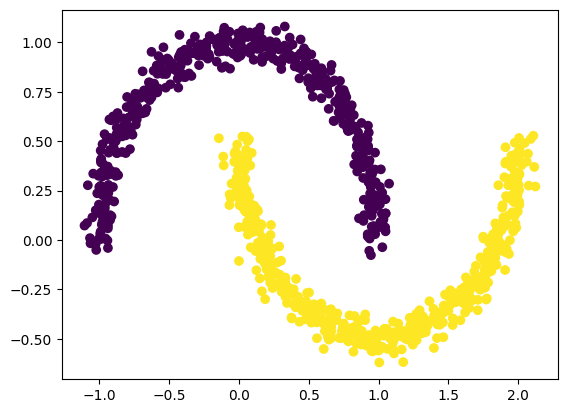

In [30]:
plt.scatter(X[:, 0], X[:, 1], c=y,)
plt.show()

In [31]:
class make_moons_dataset(torch.utils.data.Dataset):
  def __init__(self, x_y : tuple):
    self.X, self.y = x_y
  def __getitem__(self, index):
    return self.X[index], self.y[index]
  def __len__(self):
    return len(self.X)

In [32]:
X = torch.from_numpy(X).type(torch.float32)
y = torch.from_numpy(y)
train_make_moons_dataset = make_moons_dataset((X, y))
train_make_moons_dataloader = torch.utils.data.DataLoader(train_make_moons_dataset, batch_size=32, shuffle=True)

## 초기화

In [33]:
std = 0.00001
learning_rate = 0.001
optimizer = torch.optim.Adam
epoch = 200
activation_list = list(range(0, epoch))

## ReLU Model

In [34]:
input_size = 2
num_classes = 2
ReLUmodel = nn.Sequential(
    nn.Linear(input_size, 64),
    nn.ReLU(),
    nn.Linear(64, 64),
    nn.ReLU(),
    nn.Linear(64, 64),
    nn.ReLU(),
    nn.Linear(64, num_classes),
)

In [35]:
for name, parm in ReLUmodel.named_parameters():
  nn.init.normal_(parm, mean=0, std=std)

In [36]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_ReLU(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )

  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              batch_label
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.ReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [37]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ReLUmodel = ReLUmodel.to(device)
history_ReLU = train_model_ReLU(train_make_moons_dataloader, ReLUmodel, epoch, learning_rate=learning_rate, loss=loss, base_optimizer=optimizer, device = device)

100%|██████████| 32/32 [00:00<00:00, 144.37it/s]


Epoch 0 Loss : 0.693206524476409
Epoch 0 accurcy : 0.482421875


100%|██████████| 32/32 [00:00<00:00, 327.85it/s]


Epoch 1 Loss : 0.6932048574090004
Epoch 1 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 336.44it/s]


Epoch 2 Loss : 0.6931867189705372
Epoch 2 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.58it/s]


Epoch 3 Loss : 0.6932216100394726
Epoch 3 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 325.22it/s]


Epoch 4 Loss : 0.6932044550776482
Epoch 4 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 333.37it/s]


Epoch 5 Loss : 0.6932536642998457
Epoch 5 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 330.94it/s]


Epoch 6 Loss : 0.6931572146713734
Epoch 6 accurcy : 0.458984375


100%|██████████| 32/32 [00:00<00:00, 297.12it/s]


Epoch 7 Loss : 0.6931728310883045
Epoch 7 accurcy : 0.484375


100%|██████████| 32/32 [00:00<00:00, 316.77it/s]


Epoch 8 Loss : 0.6932140197604895
Epoch 8 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 320.37it/s]


Epoch 9 Loss : 0.6931621637195349
Epoch 9 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 311.55it/s]


Epoch 10 Loss : 0.6931568123400211
Epoch 10 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 314.51it/s]


Epoch 11 Loss : 0.693175146356225
Epoch 11 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 302.09it/s]


Epoch 12 Loss : 0.6932494547218084
Epoch 12 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 311.16it/s]


Epoch 13 Loss : 0.6931547950953245
Epoch 13 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 252.26it/s]


Epoch 14 Loss : 0.6931886281818151
Epoch 14 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 300.35it/s]


Epoch 15 Loss : 0.6931976117193699
Epoch 15 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 299.38it/s]


Epoch 16 Loss : 0.6931863371282816
Epoch 16 accurcy : 0.490234375


100%|██████████| 32/32 [00:00<00:00, 319.39it/s]


Epoch 17 Loss : 0.6932043079286814
Epoch 17 accurcy : 0.470703125


100%|██████████| 32/32 [00:00<00:00, 326.77it/s]


Epoch 18 Loss : 0.693222114816308
Epoch 18 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 282.86it/s]


Epoch 19 Loss : 0.6931626740843058
Epoch 19 accurcy : 0.46875


100%|██████████| 32/32 [00:00<00:00, 321.04it/s]


Epoch 20 Loss : 0.6932519543915987
Epoch 20 accurcy : 0.482421875


100%|██████████| 32/32 [00:00<00:00, 314.38it/s]


Epoch 21 Loss : 0.6932322699576616
Epoch 21 accurcy : 0.486328125


100%|██████████| 32/32 [00:00<00:00, 307.68it/s]


Epoch 22 Loss : 0.6932660937309265
Epoch 22 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 297.84it/s]


Epoch 23 Loss : 0.6932621374726295
Epoch 23 accurcy : 0.451171875


100%|██████████| 32/32 [00:00<00:00, 299.41it/s]


Epoch 24 Loss : 0.6932874415069818
Epoch 24 accurcy : 0.474609375


100%|██████████| 32/32 [00:00<00:00, 271.52it/s]


Epoch 25 Loss : 0.693127952516079
Epoch 25 accurcy : 0.494140625


100%|██████████| 32/32 [00:00<00:00, 292.02it/s]


Epoch 26 Loss : 0.6932365745306015
Epoch 26 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 288.59it/s]


Epoch 27 Loss : 0.6931915320456028
Epoch 27 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 263.21it/s]


Epoch 28 Loss : 0.693197600543499
Epoch 28 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 223.44it/s]


Epoch 29 Loss : 0.6932628136128187
Epoch 29 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 245.04it/s]


Epoch 30 Loss : 0.6931629423052073
Epoch 30 accurcy : 0.494140625


100%|██████████| 32/32 [00:00<00:00, 300.98it/s]


Epoch 31 Loss : 0.6932641547173262
Epoch 31 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 259.51it/s]


Epoch 32 Loss : 0.693173848092556
Epoch 32 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 277.24it/s]


Epoch 33 Loss : 0.6931950524449348
Epoch 33 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 276.24it/s]


Epoch 34 Loss : 0.6931567210704088
Epoch 34 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 265.40it/s]


Epoch 35 Loss : 0.6931086871773005
Epoch 35 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 289.91it/s]


Epoch 36 Loss : 0.6932369060814381
Epoch 36 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 249.86it/s]


Epoch 37 Loss : 0.6932404991239309
Epoch 37 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 258.46it/s]


Epoch 38 Loss : 0.6931831259280443
Epoch 38 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 287.27it/s]


Epoch 39 Loss : 0.693249586969614
Epoch 39 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 248.83it/s]


Epoch 40 Loss : 0.693181062117219
Epoch 40 accurcy : 0.4765625


100%|██████████| 32/32 [00:00<00:00, 241.00it/s]


Epoch 41 Loss : 0.6931637898087502
Epoch 41 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 253.72it/s]


Epoch 42 Loss : 0.6931929718703032
Epoch 42 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 265.41it/s]


Epoch 43 Loss : 0.693195391446352
Epoch 43 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.54it/s]


Epoch 44 Loss : 0.6932571511715651
Epoch 44 accurcy : 0.46484375


100%|██████████| 32/32 [00:00<00:00, 301.06it/s]


Epoch 45 Loss : 0.6931087300181389
Epoch 45 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 272.11it/s]


Epoch 46 Loss : 0.6931700520217419
Epoch 46 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 272.09it/s]


Epoch 47 Loss : 0.6932664643973112
Epoch 47 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 316.19it/s]


Epoch 48 Loss : 0.6931926812976599
Epoch 48 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 311.66it/s]


Epoch 49 Loss : 0.6932048071175814
Epoch 49 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 309.74it/s]


Epoch 50 Loss : 0.6932202558964491
Epoch 50 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 310.42it/s]


Epoch 51 Loss : 0.6932238806039095
Epoch 51 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 320.89it/s]


Epoch 52 Loss : 0.6931912247091532
Epoch 52 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 312.06it/s]


Epoch 53 Loss : 0.6932079643011093
Epoch 53 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 328.26it/s]


Epoch 54 Loss : 0.6931761335581541
Epoch 54 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 320.57it/s]


Epoch 55 Loss : 0.6931547988206148
Epoch 55 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 311.62it/s]


Epoch 56 Loss : 0.6932338941842318
Epoch 56 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 280.06it/s]


Epoch 57 Loss : 0.6931769158691168
Epoch 57 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 321.17it/s]


Epoch 58 Loss : 0.6932595614343882
Epoch 58 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 321.24it/s]


Epoch 59 Loss : 0.6932730730623007
Epoch 59 accurcy : 0.453125


100%|██████████| 32/32 [00:00<00:00, 317.13it/s]


Epoch 60 Loss : 0.6931838747113943
Epoch 60 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 316.29it/s]


Epoch 61 Loss : 0.6931573040783405
Epoch 61 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 320.18it/s]


Epoch 62 Loss : 0.6931409034878016
Epoch 62 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 325.21it/s]


Epoch 63 Loss : 0.6931733302772045
Epoch 63 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.60it/s]


Epoch 64 Loss : 0.6932812053710222
Epoch 64 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 301.54it/s]


Epoch 65 Loss : 0.6933373901993036
Epoch 65 accurcy : 0.447265625


100%|██████████| 32/32 [00:00<00:00, 316.76it/s]


Epoch 66 Loss : 0.6932412814348936
Epoch 66 accurcy : 0.46875


100%|██████████| 32/32 [00:00<00:00, 304.22it/s]


Epoch 67 Loss : 0.6932046823203564
Epoch 67 accurcy : 0.46875


100%|██████████| 32/32 [00:00<00:00, 316.28it/s]


Epoch 68 Loss : 0.6931464467197657
Epoch 68 accurcy : 0.4921875


100%|██████████| 32/32 [00:00<00:00, 322.53it/s]


Epoch 69 Loss : 0.6931542512029409
Epoch 69 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 304.60it/s]


Epoch 70 Loss : 0.6932012811303139
Epoch 70 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 325.63it/s]


Epoch 71 Loss : 0.6931970380246639
Epoch 71 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.43it/s]


Epoch 72 Loss : 0.6931981928646564
Epoch 72 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 327.14it/s]


Epoch 73 Loss : 0.6932576391845942
Epoch 73 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 323.34it/s]


Epoch 74 Loss : 0.693250197917223
Epoch 74 accurcy : 0.48046875


100%|██████████| 32/32 [00:00<00:00, 325.73it/s]


Epoch 75 Loss : 0.6932989526540041
Epoch 75 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.48it/s]


Epoch 76 Loss : 0.6931644845753908
Epoch 76 accurcy : 0.470703125


100%|██████████| 32/32 [00:00<00:00, 321.47it/s]


Epoch 77 Loss : 0.6932177431881428
Epoch 77 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.98it/s]


Epoch 78 Loss : 0.6932312157005072
Epoch 78 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 320.32it/s]


Epoch 79 Loss : 0.6932021826505661
Epoch 79 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.40it/s]


Epoch 80 Loss : 0.693180900067091
Epoch 80 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 325.65it/s]


Epoch 81 Loss : 0.6931990347802639
Epoch 81 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.11it/s]


Epoch 82 Loss : 0.6931600347161293
Epoch 82 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 321.68it/s]


Epoch 83 Loss : 0.6932347007095814
Epoch 83 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.75it/s]


Epoch 84 Loss : 0.6931897420436144
Epoch 84 accurcy : 0.4765625


100%|██████████| 32/32 [00:00<00:00, 327.96it/s]


Epoch 85 Loss : 0.6932561956346035
Epoch 85 accurcy : 0.44921875


100%|██████████| 32/32 [00:00<00:00, 329.98it/s]


Epoch 86 Loss : 0.6932287625968456
Epoch 86 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.92it/s]


Epoch 87 Loss : 0.6931753233075142
Epoch 87 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 314.94it/s]


Epoch 88 Loss : 0.693215386942029
Epoch 88 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 327.01it/s]


Epoch 89 Loss : 0.6931501999497414
Epoch 89 accurcy : 0.498046875


100%|██████████| 32/32 [00:00<00:00, 334.88it/s]


Epoch 90 Loss : 0.6932587195187807
Epoch 90 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 327.87it/s]


Epoch 91 Loss : 0.6931940522044897
Epoch 91 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 330.48it/s]


Epoch 92 Loss : 0.6931647174060345
Epoch 92 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 319.71it/s]


Epoch 93 Loss : 0.6932131759822369
Epoch 93 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.87it/s]


Epoch 94 Loss : 0.6931796185672283
Epoch 94 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.08it/s]


Epoch 95 Loss : 0.693168280646205
Epoch 95 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 330.49it/s]


Epoch 96 Loss : 0.6931748110800982
Epoch 96 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.34it/s]


Epoch 97 Loss : 0.6932450700551271
Epoch 97 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 327.19it/s]


Epoch 98 Loss : 0.6931943204253912
Epoch 98 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.42it/s]


Epoch 99 Loss : 0.693207336589694
Epoch 99 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 324.98it/s]


Epoch 100 Loss : 0.6931866332888603
Epoch 100 accurcy : 0.4765625


100%|██████████| 32/32 [00:00<00:00, 324.97it/s]


Epoch 101 Loss : 0.693201769143343
Epoch 101 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 328.54it/s]


Epoch 102 Loss : 0.6932046394795179
Epoch 102 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 332.40it/s]


Epoch 103 Loss : 0.6931714937090874
Epoch 103 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 329.72it/s]


Epoch 104 Loss : 0.693175395950675
Epoch 104 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 314.62it/s]


Epoch 105 Loss : 0.6931956615298986
Epoch 105 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 320.39it/s]


Epoch 106 Loss : 0.6931656431406736
Epoch 106 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 315.26it/s]


Epoch 107 Loss : 0.6932268217206001
Epoch 107 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 320.42it/s]


Epoch 108 Loss : 0.6931833159178495
Epoch 108 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.33it/s]


Epoch 109 Loss : 0.693256787955761
Epoch 109 accurcy : 0.443359375


100%|██████████| 32/32 [00:00<00:00, 323.57it/s]


Epoch 110 Loss : 0.6931803990155458
Epoch 110 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.03it/s]


Epoch 111 Loss : 0.6932100802659988
Epoch 111 accurcy : 0.470703125


100%|██████████| 32/32 [00:00<00:00, 327.24it/s]


Epoch 112 Loss : 0.6932033132761717
Epoch 112 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 327.06it/s]


Epoch 113 Loss : 0.693292772397399
Epoch 113 accurcy : 0.482421875


100%|██████████| 32/32 [00:00<00:00, 327.48it/s]


Epoch 114 Loss : 0.6932931113988161
Epoch 114 accurcy : 0.46875


100%|██████████| 32/32 [00:00<00:00, 315.72it/s]


Epoch 115 Loss : 0.6931811179965734
Epoch 115 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 316.18it/s]


Epoch 116 Loss : 0.6932071782648563
Epoch 116 accurcy : 0.462890625


100%|██████████| 32/32 [00:00<00:00, 327.74it/s]


Epoch 117 Loss : 0.6931822877377272
Epoch 117 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 325.34it/s]


Epoch 118 Loss : 0.693197213113308
Epoch 118 accurcy : 0.45703125


100%|██████████| 32/32 [00:00<00:00, 327.34it/s]


Epoch 119 Loss : 0.6932500619441271
Epoch 119 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 326.13it/s]


Epoch 120 Loss : 0.6931960619986057
Epoch 120 accurcy : 0.48046875


100%|██████████| 32/32 [00:00<00:00, 324.29it/s]


Epoch 121 Loss : 0.6932560000568628
Epoch 121 accurcy : 0.46484375


100%|██████████| 32/32 [00:00<00:00, 313.72it/s]


Epoch 122 Loss : 0.693159181624651
Epoch 122 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 319.32it/s]


Epoch 123 Loss : 0.6931703258305788
Epoch 123 accurcy : 0.474609375


100%|██████████| 32/32 [00:00<00:00, 326.91it/s]


Epoch 124 Loss : 0.6931821629405022
Epoch 124 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 313.95it/s]


Epoch 125 Loss : 0.6931841988116503
Epoch 125 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.26it/s]


Epoch 126 Loss : 0.6932590547949076
Epoch 126 accurcy : 0.443359375


100%|██████████| 32/32 [00:00<00:00, 316.02it/s]


Epoch 127 Loss : 0.6931035742163658
Epoch 127 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 315.70it/s]


Epoch 128 Loss : 0.6931433398276567
Epoch 128 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 313.40it/s]


Epoch 129 Loss : 0.693318534642458
Epoch 129 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 314.73it/s]


Epoch 130 Loss : 0.6932250447571278
Epoch 130 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 320.31it/s]


Epoch 131 Loss : 0.6931865699589252
Epoch 131 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.10it/s]


Epoch 132 Loss : 0.6931905895471573
Epoch 132 accurcy : 0.46484375


100%|██████████| 32/32 [00:00<00:00, 324.52it/s]


Epoch 133 Loss : 0.6932271923869848
Epoch 133 accurcy : 0.46875


100%|██████████| 32/32 [00:00<00:00, 313.97it/s]


Epoch 134 Loss : 0.6932170689105988
Epoch 134 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.61it/s]


Epoch 135 Loss : 0.6932152956724167
Epoch 135 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 325.89it/s]


Epoch 136 Loss : 0.6931879166513681
Epoch 136 accurcy : 0.4609375


100%|██████████| 32/32 [00:00<00:00, 316.66it/s]


Epoch 137 Loss : 0.6931848805397749
Epoch 137 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.51it/s]


Epoch 138 Loss : 0.6931787990033627
Epoch 138 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 308.31it/s]


Epoch 139 Loss : 0.6932824738323689
Epoch 139 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 312.20it/s]


Epoch 140 Loss : 0.6931586191058159
Epoch 140 accurcy : 0.490234375


100%|██████████| 32/32 [00:00<00:00, 325.92it/s]


Epoch 141 Loss : 0.6931658368557692
Epoch 141 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 333.39it/s]


Epoch 142 Loss : 0.6932696625590324
Epoch 142 accurcy : 0.48046875


100%|██████████| 32/32 [00:00<00:00, 325.77it/s]


Epoch 143 Loss : 0.6932643745094538
Epoch 143 accurcy : 0.474609375


100%|██████████| 32/32 [00:00<00:00, 316.67it/s]


Epoch 144 Loss : 0.693165622651577
Epoch 144 accurcy : 0.482421875


100%|██████████| 32/32 [00:00<00:00, 321.89it/s]


Epoch 145 Loss : 0.6932009495794773
Epoch 145 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 323.80it/s]


Epoch 146 Loss : 0.693179240450263
Epoch 146 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 298.80it/s]


Epoch 147 Loss : 0.6931747458875179
Epoch 147 accurcy : 0.486328125


100%|██████████| 32/32 [00:00<00:00, 331.93it/s]


Epoch 148 Loss : 0.6931499168276787
Epoch 148 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 314.01it/s]


Epoch 149 Loss : 0.6932181939482689
Epoch 149 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 321.28it/s]


Epoch 150 Loss : 0.6932014860212803
Epoch 150 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 315.09it/s]


Epoch 151 Loss : 0.6932114399969578
Epoch 151 accurcy : 0.474609375


100%|██████████| 32/32 [00:00<00:00, 310.10it/s]


Epoch 152 Loss : 0.6932552848011255
Epoch 152 accurcy : 0.46875


100%|██████████| 32/32 [00:00<00:00, 322.16it/s]


Epoch 153 Loss : 0.6932098437100649
Epoch 153 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 312.65it/s]


Epoch 154 Loss : 0.6932435762137175
Epoch 154 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 319.81it/s]


Epoch 155 Loss : 0.6931783780455589
Epoch 155 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 320.63it/s]


Epoch 156 Loss : 0.6931852586567402
Epoch 156 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 327.25it/s]


Epoch 157 Loss : 0.6931774392724037
Epoch 157 accurcy : 0.486328125


100%|██████████| 32/32 [00:00<00:00, 323.35it/s]


Epoch 158 Loss : 0.6932989116758108
Epoch 158 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 334.59it/s]


Epoch 159 Loss : 0.6932005994021893
Epoch 159 accurcy : 0.48046875


100%|██████████| 32/32 [00:00<00:00, 331.04it/s]


Epoch 160 Loss : 0.6931574996560812
Epoch 160 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.64it/s]


Epoch 161 Loss : 0.6931671444326639
Epoch 161 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.22it/s]


Epoch 162 Loss : 0.6932774726301432
Epoch 162 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.16it/s]


Epoch 163 Loss : 0.6932202093303204
Epoch 163 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 331.21it/s]


Epoch 164 Loss : 0.6931857652962208
Epoch 164 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 335.52it/s]


Epoch 165 Loss : 0.6931973304599524
Epoch 165 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 325.42it/s]


Epoch 166 Loss : 0.6932473033666611
Epoch 166 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 323.94it/s]


Epoch 167 Loss : 0.6931925546377897
Epoch 167 accurcy : 0.48046875


100%|██████████| 32/32 [00:00<00:00, 320.28it/s]


Epoch 168 Loss : 0.6931922044605017
Epoch 168 accurcy : 0.478515625


100%|██████████| 32/32 [00:00<00:00, 329.57it/s]


Epoch 169 Loss : 0.6932260319590569
Epoch 169 accurcy : 0.46484375


100%|██████████| 32/32 [00:00<00:00, 335.82it/s]


Epoch 170 Loss : 0.693140784278512
Epoch 170 accurcy : 0.458984375


100%|██████████| 32/32 [00:00<00:00, 316.86it/s]


Epoch 171 Loss : 0.6932339761406183
Epoch 171 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 329.80it/s]


Epoch 172 Loss : 0.6932304929941893
Epoch 172 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 322.89it/s]


Epoch 173 Loss : 0.6931660678237677
Epoch 173 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 327.04it/s]


Epoch 174 Loss : 0.6932503469288349
Epoch 174 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.47it/s]


Epoch 175 Loss : 0.6932222954928875
Epoch 175 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 321.59it/s]


Epoch 176 Loss : 0.6931891776621342
Epoch 176 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 336.07it/s]


Epoch 177 Loss : 0.6931737717241049
Epoch 177 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 332.70it/s]


Epoch 178 Loss : 0.693236043676734
Epoch 178 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 332.27it/s]


Epoch 179 Loss : 0.6932322885841131
Epoch 179 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 326.86it/s]


Epoch 180 Loss : 0.6932434272021055
Epoch 180 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 334.96it/s]


Epoch 181 Loss : 0.693211643025279
Epoch 181 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 328.26it/s]


Epoch 182 Loss : 0.6931566316634417
Epoch 182 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 334.47it/s]


Epoch 183 Loss : 0.6931854654103518
Epoch 183 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 335.22it/s]


Epoch 184 Loss : 0.6932982373982668
Epoch 184 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 331.27it/s]


Epoch 185 Loss : 0.6931893359869719
Epoch 185 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 332.36it/s]


Epoch 186 Loss : 0.6931609474122524
Epoch 186 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 334.44it/s]


Epoch 187 Loss : 0.6931599080562592
Epoch 187 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 321.53it/s]


Epoch 188 Loss : 0.6931922975927591
Epoch 188 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 330.00it/s]


Epoch 189 Loss : 0.6931696813553572
Epoch 189 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 328.28it/s]


Epoch 190 Loss : 0.6931601092219353
Epoch 190 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 316.37it/s]


Epoch 191 Loss : 0.6932202186435461
Epoch 191 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 328.74it/s]


Epoch 192 Loss : 0.6932357139885426
Epoch 192 accurcy : 0.466796875


100%|██████████| 32/32 [00:00<00:00, 327.27it/s]


Epoch 193 Loss : 0.6931841373443604
Epoch 193 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 329.49it/s]


Epoch 194 Loss : 0.6931989900767803
Epoch 194 accurcy : 0.484375


100%|██████████| 32/32 [00:00<00:00, 326.07it/s]


Epoch 195 Loss : 0.6931601781398058
Epoch 195 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 324.74it/s]


Epoch 196 Loss : 0.6932014469057322
Epoch 196 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 331.98it/s]


Epoch 197 Loss : 0.693206986412406
Epoch 197 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 327.83it/s]


Epoch 198 Loss : 0.6932596731930971
Epoch 198 accurcy : 0.4609375


100%|██████████| 32/32 [00:00<00:00, 329.72it/s]


Epoch 199 Loss : 0.6931807566434145
Epoch 199 accurcy : 0.484375


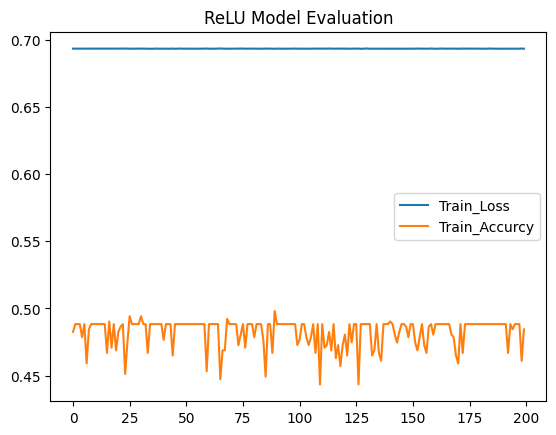

In [38]:
plt.title("ReLU Model Evaluation")
plt.plot(history_ReLU[0], label='Train_Loss')
for i in range(len(history_ReLU[1])):
  history_ReLU[1][i] = history_ReLU[1][i].cpu()
plt.plot(history_ReLU[1], label='Train_Accurcy')
plt.legend()
plt.show()

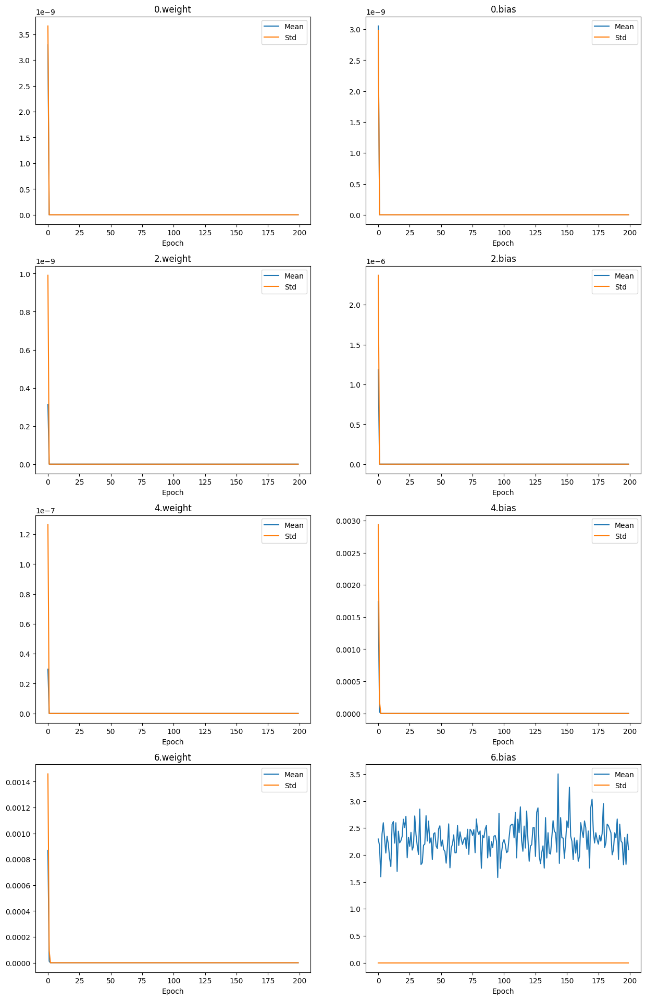

In [39]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,30))
for k, name in enumerate(history_ReLU[2][0]):
  plt.subplot(5,2, 1+k)
  mean = []
  std_plot = []
  for i in range(len(history_ReLU[2])):
    flatten_tensor = history_ReLU[2][i][name].detach().cpu().flatten()
    mean.append(flatten_tensor.mean())
    std_plot.append(flatten_tensor.std())

  plt.plot(mean, label="Mean")
  plt.plot(std_plot, label="Std")

  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

<Figure size 3000x3500 with 0 Axes>

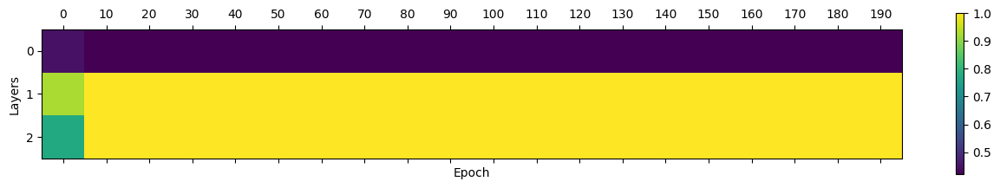

In [40]:
plt.figure(figsize=(30,35))
mean_rates = []
for k, name in enumerate(history_ReLU[3][0]):
  mean_rate = []
  for j, i in enumerate(range(0, epoch, 10)):
    all_act = torch.cat(
      history_ReLU[3][i][name]
    )
    mean_rate.append(np.mean(all_act.numpy()==0))
  mean_rates.append(mean_rate)
array =  np.array(mean_rates)
plt.matshow(array)
plt.xticks(range(0, epoch//10), range(0, epoch, 10))
plt.xlabel("Epoch")
plt.ylabel("Layers")
plt.colorbar()
plt.show()


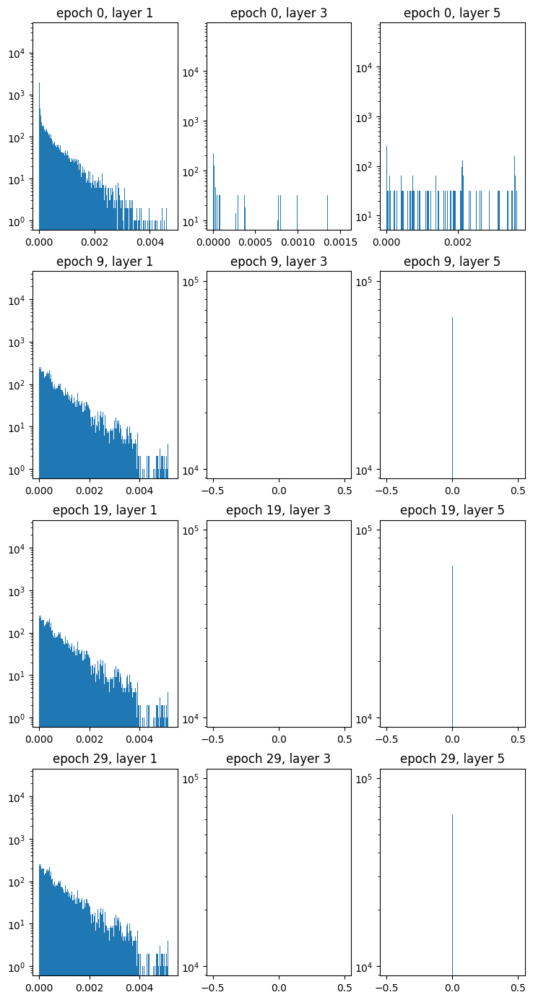

In [41]:
plt.figure(figsize=(15,35))
for j, i in enumerate([0, 9, 19, 29]):
  for k, name in enumerate(history_ReLU[3][0]):
    plt.subplot(8, 5, 1+k+5*j)
    all_act = torch.cat(
      history_ReLU[3][i][name]
    )
    plt.yscale("log")
    plt.title(f"epoch {i}, layer {name}")
    plt.hist(all_act.numpy(), bins=1000)
plt.show()

## Leaky ReLU

In [42]:
input_size = 2
num_classes = 2
LeakyReLUmodel = nn.Sequential(
    nn.Linear(input_size, 64),
    nn.LeakyReLU(),
    nn.Linear(64, 64),
    nn.LeakyReLU(),
    nn.Linear(64, 64),
    nn.LeakyReLU(),
    nn.Linear(64, num_classes),
)

In [43]:
for name, parm in LeakyReLUmodel.named_parameters():
  nn.init.normal(parm, mean=0, std=std)

/tmp/ipykernel_7129/545271879.py:2: FutureWarning: `nn.init.normal` is now deprecated in favor of `nn.init.normal_`.
  nn.init.normal(parm, mean=0, std=std)


In [44]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_LeakyReLU(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )

  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              batch_label
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.LeakyReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [45]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
LeakyReLUmodel = LeakyReLUmodel.to(device)
history_LeakyReLU = train_model_LeakyReLU(train_make_moons_dataloader, LeakyReLUmodel, epoch, learning_rate=learning_rate, loss=loss, base_optimizer=optimizer, device = device)

100%|██████████| 32/32 [00:00<00:00, 289.28it/s]


Epoch 0 Loss : 0.6931936088949442
Epoch 0 accurcy : 0.470703125


100%|██████████| 32/32 [00:00<00:00, 314.79it/s]


Epoch 1 Loss : 0.6931908410042524
Epoch 1 accurcy : 0.48828125


100%|██████████| 32/32 [00:00<00:00, 322.18it/s]


Epoch 2 Loss : 0.6932014916092157
Epoch 2 accurcy : 0.47265625


100%|██████████| 32/32 [00:00<00:00, 302.02it/s]


Epoch 3 Loss : 0.6539055816829205
Epoch 3 accurcy : 0.73046875


100%|██████████| 32/32 [00:00<00:00, 325.73it/s]


Epoch 4 Loss : 0.30296183098107576
Epoch 4 accurcy : 0.845703125


100%|██████████| 32/32 [00:00<00:00, 280.49it/s]


Epoch 5 Loss : 0.26041670539416373
Epoch 5 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 332.12it/s]


Epoch 6 Loss : 0.24199851043522358
Epoch 6 accurcy : 0.8681640625


100%|██████████| 32/32 [00:00<00:00, 328.87it/s]


Epoch 7 Loss : 0.23810632526874542
Epoch 7 accurcy : 0.8681640625


100%|██████████| 32/32 [00:00<00:00, 321.47it/s]


Epoch 8 Loss : 0.22534752381034195
Epoch 8 accurcy : 0.8671875


100%|██████████| 32/32 [00:00<00:00, 319.35it/s]


Epoch 9 Loss : 0.21032152604311705
Epoch 9 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 323.03it/s]


Epoch 10 Loss : 0.21104555390775204
Epoch 10 accurcy : 0.865234375


100%|██████████| 32/32 [00:00<00:00, 327.06it/s]


Epoch 11 Loss : 0.21569548617117107
Epoch 11 accurcy : 0.8740234375


100%|██████████| 32/32 [00:00<00:00, 328.44it/s]


Epoch 12 Loss : 0.20872240653261542
Epoch 12 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 326.85it/s]


Epoch 13 Loss : 0.20680798729881644
Epoch 13 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 313.47it/s]


Epoch 14 Loss : 0.20785704301670194
Epoch 14 accurcy : 0.8720703125


100%|██████████| 32/32 [00:00<00:00, 314.80it/s]


Epoch 15 Loss : 0.22168718045577407
Epoch 15 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 311.78it/s]


Epoch 16 Loss : 0.20556870847940445
Epoch 16 accurcy : 0.8662109375


100%|██████████| 32/32 [00:00<00:00, 322.05it/s]


Epoch 17 Loss : 0.20714240497909486
Epoch 17 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 307.91it/s]


Epoch 18 Loss : 0.20761275081895292
Epoch 18 accurcy : 0.8818359375


100%|██████████| 32/32 [00:00<00:00, 312.23it/s]


Epoch 19 Loss : 0.2063287985511124
Epoch 19 accurcy : 0.8662109375


100%|██████████| 32/32 [00:00<00:00, 312.41it/s]


Epoch 20 Loss : 0.20217018015682697
Epoch 20 accurcy : 0.8740234375


100%|██████████| 32/32 [00:00<00:00, 320.65it/s]


Epoch 21 Loss : 0.21473367256112397
Epoch 21 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 333.07it/s]


Epoch 22 Loss : 0.20735875144600868
Epoch 22 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 330.21it/s]


Epoch 23 Loss : 0.21039155859034508
Epoch 23 accurcy : 0.8720703125


100%|██████████| 32/32 [00:00<00:00, 315.75it/s]


Epoch 24 Loss : 0.20468914252705872
Epoch 24 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 320.09it/s]


Epoch 25 Loss : 0.20133914041798562
Epoch 25 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 308.90it/s]


Epoch 26 Loss : 0.20490805082954466
Epoch 26 accurcy : 0.875


100%|██████████| 32/32 [00:00<00:00, 316.91it/s]


Epoch 27 Loss : 0.20644311781506985
Epoch 27 accurcy : 0.8740234375


100%|██████████| 32/32 [00:00<00:00, 319.87it/s]


Epoch 28 Loss : 0.20952666085213423
Epoch 28 accurcy : 0.876953125


100%|██████████| 32/32 [00:00<00:00, 326.50it/s]


Epoch 29 Loss : 0.21245164168067276
Epoch 29 accurcy : 0.8662109375


100%|██████████| 32/32 [00:00<00:00, 327.11it/s]


Epoch 30 Loss : 0.21810213779099286
Epoch 30 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 326.55it/s]


Epoch 31 Loss : 0.2041433984413743
Epoch 31 accurcy : 0.875


100%|██████████| 32/32 [00:00<00:00, 319.83it/s]


Epoch 32 Loss : 0.20267940347548574
Epoch 32 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 323.97it/s]


Epoch 33 Loss : 0.20239921391475946
Epoch 33 accurcy : 0.8759765625


100%|██████████| 32/32 [00:00<00:00, 330.03it/s]


Epoch 34 Loss : 0.20576539629837498
Epoch 34 accurcy : 0.8779296875


100%|██████████| 32/32 [00:00<00:00, 326.30it/s]


Epoch 35 Loss : 0.20261818391736597
Epoch 35 accurcy : 0.8681640625


100%|██████████| 32/32 [00:00<00:00, 324.04it/s]


Epoch 36 Loss : 0.20697347586974502
Epoch 36 accurcy : 0.876953125


100%|██████████| 32/32 [00:00<00:00, 322.96it/s]


Epoch 37 Loss : 0.20387351437238976
Epoch 37 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 321.00it/s]


Epoch 38 Loss : 0.19537003757432103
Epoch 38 accurcy : 0.8759765625


100%|██████████| 32/32 [00:00<00:00, 323.41it/s]


Epoch 39 Loss : 0.19838701048865914
Epoch 39 accurcy : 0.8779296875


100%|██████████| 32/32 [00:00<00:00, 327.78it/s]


Epoch 40 Loss : 0.1984205236658454
Epoch 40 accurcy : 0.876953125


100%|██████████| 32/32 [00:00<00:00, 329.88it/s]


Epoch 41 Loss : 0.19798410451039672
Epoch 41 accurcy : 0.8818359375


100%|██████████| 32/32 [00:00<00:00, 320.50it/s]


Epoch 42 Loss : 0.2073939465917647
Epoch 42 accurcy : 0.87890625


100%|██████████| 32/32 [00:00<00:00, 320.47it/s]


Epoch 43 Loss : 0.2087083631195128
Epoch 43 accurcy : 0.88671875


100%|██████████| 32/32 [00:00<00:00, 314.77it/s]


Epoch 44 Loss : 0.20250258245505393
Epoch 44 accurcy : 0.8828125


100%|██████████| 32/32 [00:00<00:00, 323.72it/s]


Epoch 45 Loss : 0.19536457397043705
Epoch 45 accurcy : 0.8818359375


100%|██████████| 32/32 [00:00<00:00, 324.65it/s]


Epoch 46 Loss : 0.19335805551963858
Epoch 46 accurcy : 0.8798828125


100%|██████████| 32/32 [00:00<00:00, 328.77it/s]


Epoch 47 Loss : 0.1992140447255224
Epoch 47 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 322.84it/s]


Epoch 48 Loss : 0.20054997340776026
Epoch 48 accurcy : 0.87890625


100%|██████████| 32/32 [00:00<00:00, 323.43it/s]


Epoch 49 Loss : 0.19575883098877966
Epoch 49 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 324.63it/s]


Epoch 50 Loss : 0.20105857169255614
Epoch 50 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 326.50it/s]


Epoch 51 Loss : 0.20882267854176462
Epoch 51 accurcy : 0.8720703125


100%|██████████| 32/32 [00:00<00:00, 321.46it/s]


Epoch 52 Loss : 0.1977732249069959
Epoch 52 accurcy : 0.8857421875


100%|██████████| 32/32 [00:00<00:00, 314.78it/s]


Epoch 53 Loss : 0.1924651642329991
Epoch 53 accurcy : 0.8798828125


100%|██████████| 32/32 [00:00<00:00, 323.80it/s]


Epoch 54 Loss : 0.1921018122229725
Epoch 54 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 325.42it/s]


Epoch 55 Loss : 0.1992508030962199
Epoch 55 accurcy : 0.876953125


100%|██████████| 32/32 [00:00<00:00, 313.50it/s]


Epoch 56 Loss : 0.19374226604122669
Epoch 56 accurcy : 0.8759765625


100%|██████████| 32/32 [00:00<00:00, 324.05it/s]


Epoch 57 Loss : 0.1916816986631602
Epoch 57 accurcy : 0.8837890625


100%|██████████| 32/32 [00:00<00:00, 325.49it/s]


Epoch 58 Loss : 0.18463246035389602
Epoch 58 accurcy : 0.896484375


100%|██████████| 32/32 [00:00<00:00, 319.39it/s]


Epoch 59 Loss : 0.168304955936037
Epoch 59 accurcy : 0.8955078125


100%|██████████| 32/32 [00:00<00:00, 327.98it/s]


Epoch 60 Loss : 0.11970714456401765
Epoch 60 accurcy : 0.931640625


100%|██████████| 32/32 [00:00<00:00, 323.29it/s]


Epoch 61 Loss : 0.08225483173737302
Epoch 61 accurcy : 0.9482421875


100%|██████████| 32/32 [00:00<00:00, 313.14it/s]


Epoch 62 Loss : 0.0482877557806205
Epoch 62 accurcy : 0.9658203125


100%|██████████| 32/32 [00:00<00:00, 322.39it/s]


Epoch 63 Loss : 0.027019677421776578
Epoch 63 accurcy : 0.974609375


100%|██████████| 32/32 [00:00<00:00, 329.18it/s]


Epoch 64 Loss : 0.017397794494172558
Epoch 64 accurcy : 0.974609375


100%|██████████| 32/32 [00:00<00:00, 326.06it/s]


Epoch 65 Loss : 0.010825683166331146
Epoch 65 accurcy : 0.9755859375


100%|██████████| 32/32 [00:00<00:00, 326.86it/s]


Epoch 66 Loss : 0.007337307695706841
Epoch 66 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.09it/s]


Epoch 67 Loss : 0.00608861178625375
Epoch 67 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.11it/s]


Epoch 68 Loss : 0.004658216968891793
Epoch 68 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.05it/s]


Epoch 69 Loss : 0.00401935732770653
Epoch 69 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.51it/s]


Epoch 70 Loss : 0.0037484198164747795
Epoch 70 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.38it/s]


Epoch 71 Loss : 0.003100197845924413
Epoch 71 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.91it/s]


Epoch 72 Loss : 0.0026925432593998266
Epoch 72 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.01it/s]


Epoch 73 Loss : 0.0022834040505586017
Epoch 73 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 316.87it/s]


Epoch 74 Loss : 0.0020442049881239654
Epoch 74 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.53it/s]


Epoch 75 Loss : 0.0018770970827972633
Epoch 75 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.31it/s]


Epoch 76 Loss : 0.001752467843289196
Epoch 76 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.34it/s]


Epoch 77 Loss : 0.001566724569784128
Epoch 77 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.04it/s]


Epoch 78 Loss : 0.0014191495224622486
Epoch 78 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 314.40it/s]


Epoch 79 Loss : 0.0012955539555150608
Epoch 79 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.62it/s]


Epoch 80 Loss : 0.0012514223358266463
Epoch 80 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.65it/s]


Epoch 81 Loss : 0.0011690941769302299
Epoch 81 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.93it/s]


Epoch 82 Loss : 0.0011297879370886221
Epoch 82 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 316.33it/s]


Epoch 83 Loss : 0.0009880877619252715
Epoch 83 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.90it/s]


Epoch 84 Loss : 0.0009404842010098946
Epoch 84 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.56it/s]


Epoch 85 Loss : 0.0008841902490530629
Epoch 85 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 313.07it/s]


Epoch 86 Loss : 0.0008055947403136088
Epoch 86 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.71it/s]


Epoch 87 Loss : 0.0007295789864656399
Epoch 87 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.28it/s]


Epoch 88 Loss : 0.0007319714509321784
Epoch 88 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.01it/s]


Epoch 89 Loss : 0.0006662907243253358
Epoch 89 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.89it/s]


Epoch 90 Loss : 0.0006453496525864466
Epoch 90 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.72it/s]


Epoch 91 Loss : 0.0005978753289923588
Epoch 91 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.42it/s]


Epoch 92 Loss : 0.0005753929482921194
Epoch 92 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 313.37it/s]


Epoch 93 Loss : 0.0005345740692064282
Epoch 93 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.76it/s]


Epoch 94 Loss : 0.0005851018020166521
Epoch 94 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 322.37it/s]


Epoch 95 Loss : 0.0004855106948298271
Epoch 95 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.98it/s]


Epoch 96 Loss : 0.0004678738386587611
Epoch 96 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 322.33it/s]


Epoch 97 Loss : 0.000489079359454081
Epoch 97 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.28it/s]


Epoch 98 Loss : 0.0004195132109430233
Epoch 98 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.33it/s]


Epoch 99 Loss : 0.00039369203636852035
Epoch 99 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.53it/s]


Epoch 100 Loss : 0.00041089538927963076
Epoch 100 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.73it/s]


Epoch 101 Loss : 0.0003775578674094504
Epoch 101 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.31it/s]


Epoch 102 Loss : 0.0003393503826316646
Epoch 102 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.51it/s]


Epoch 103 Loss : 0.00034076100990887426
Epoch 103 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 304.72it/s]


Epoch 104 Loss : 0.00031968102211976657
Epoch 104 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.60it/s]


Epoch 105 Loss : 0.00030961959288333674
Epoch 105 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.20it/s]


Epoch 106 Loss : 0.0003163419348197749
Epoch 106 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 316.90it/s]


Epoch 107 Loss : 0.0002776233149006657
Epoch 107 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.66it/s]


Epoch 108 Loss : 0.0002816230488349447
Epoch 108 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.33it/s]


Epoch 109 Loss : 0.00028075983635744706
Epoch 109 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.26it/s]


Epoch 110 Loss : 0.00027905914595294234
Epoch 110 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.64it/s]


Epoch 111 Loss : 0.00046345867417585396
Epoch 111 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.97it/s]


Epoch 112 Loss : 0.0003191113947309532
Epoch 112 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.57it/s]


Epoch 113 Loss : 0.00021960336798088065
Epoch 113 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 313.81it/s]


Epoch 114 Loss : 0.00020730788165224112
Epoch 114 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.76it/s]


Epoch 115 Loss : 0.00020319968214721484
Epoch 115 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.57it/s]


Epoch 116 Loss : 0.00020254173728062597
Epoch 116 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.57it/s]


Epoch 117 Loss : 0.00018609935384006349
Epoch 117 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.01it/s]


Epoch 118 Loss : 0.00017871404531888402
Epoch 118 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 313.14it/s]


Epoch 119 Loss : 0.00018375102905565655
Epoch 119 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 302.59it/s]


Epoch 120 Loss : 0.00016471341021428998
Epoch 120 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.41it/s]


Epoch 121 Loss : 0.0001638525478142583
Epoch 121 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.96it/s]


Epoch 122 Loss : 0.00016894414638102262
Epoch 122 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.21it/s]


Epoch 123 Loss : 0.0001516305015911712
Epoch 123 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.76it/s]


Epoch 124 Loss : 0.00015417020442498597
Epoch 124 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 322.57it/s]


Epoch 125 Loss : 0.00015043171627837637
Epoch 125 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.40it/s]


Epoch 126 Loss : 0.00013568002016484115
Epoch 126 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.17it/s]


Epoch 127 Loss : 0.00013314048598545014
Epoch 127 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.10it/s]


Epoch 128 Loss : 0.00013513828434952302
Epoch 128 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.37it/s]


Epoch 129 Loss : 0.00012802167003655995
Epoch 129 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 312.22it/s]


Epoch 130 Loss : 0.0001250697277157542
Epoch 130 accurcy : 0.9765625


100%|██████████| 32/32 [00:01<00:00, 29.35it/s]


Epoch 131 Loss : 0.00012044650485698583
Epoch 131 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.27it/s]


Epoch 132 Loss : 0.00011608959148645681
Epoch 132 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.15it/s]


Epoch 133 Loss : 0.00011201199833976716
Epoch 133 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.28it/s]


Epoch 134 Loss : 0.0001097895407156102
Epoch 134 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.89it/s]


Epoch 135 Loss : 0.00010638653512273777
Epoch 135 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.71it/s]


Epoch 136 Loss : 0.00010013163159783289
Epoch 136 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.30it/s]

Epoch 137 Loss : 0.00010237230810616893


Epoch 137 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.12it/s]


Epoch 138 Loss : 0.00010245704066846884
Epoch 138 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.22it/s]


Epoch 139 Loss : 9.402309763117955e-05
Epoch 139 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.29it/s]


Epoch 140 Loss : 9.297899281079935e-05
Epoch 140 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.66it/s]


Epoch 141 Loss : 8.918262530954735e-05
Epoch 141 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.27it/s]


Epoch 142 Loss : 9.007421000006843e-05
Epoch 142 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.70it/s]


Epoch 143 Loss : 8.953267115430208e-05
Epoch 143 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 314.74it/s]


Epoch 144 Loss : 8.237324279036784e-05
Epoch 144 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.62it/s]


Epoch 145 Loss : 8.014378653342646e-05
Epoch 145 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.40it/s]


Epoch 146 Loss : 7.806874381799389e-05
Epoch 146 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.30it/s]


Epoch 147 Loss : 7.426687368194962e-05
Epoch 147 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.14it/s]


Epoch 148 Loss : 7.27714736967755e-05
Epoch 148 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 305.83it/s]


Epoch 149 Loss : 8.131918709608499e-05
Epoch 149 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.92it/s]


Epoch 150 Loss : 6.75041038391555e-05
Epoch 150 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 311.04it/s]


Epoch 151 Loss : 6.641694191955594e-05
Epoch 151 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.56it/s]


Epoch 152 Loss : 7.075645925169738e-05
Epoch 152 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 315.64it/s]


Epoch 153 Loss : 6.421891553998194e-05
Epoch 153 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.50it/s]


Epoch 154 Loss : 6.138529398924675e-05
Epoch 154 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.57it/s]


Epoch 155 Loss : 5.9872689540441115e-05
Epoch 155 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.30it/s]


Epoch 156 Loss : 5.9765688497748215e-05
Epoch 156 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.87it/s]


Epoch 157 Loss : 0.00011934336843921756
Epoch 157 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.61it/s]


Epoch 158 Loss : 7.687963088542915e-05
Epoch 158 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 315.86it/s]


Epoch 159 Loss : 5.348726953968708e-05
Epoch 159 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 322.33it/s]


Epoch 160 Loss : 5.111700870941149e-05
Epoch 160 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.24it/s]


Epoch 161 Loss : 5.01794390146415e-05
Epoch 161 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.14it/s]


Epoch 162 Loss : 4.840996984967205e-05
Epoch 162 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.69it/s]


Epoch 163 Loss : 4.761671852548943e-05
Epoch 163 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.61it/s]


Epoch 164 Loss : 5.3643890922217e-05
Epoch 164 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.20it/s]


Epoch 165 Loss : 4.611949446342578e-05
Epoch 165 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.97it/s]


Epoch 166 Loss : 5.0709972811091575e-05
Epoch 166 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 319.95it/s]


Epoch 167 Loss : 4.24075650542477e-05
Epoch 167 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.30it/s]


Epoch 168 Loss : 4.555666360772648e-05
Epoch 168 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.78it/s]


Epoch 169 Loss : 4.168824597883258e-05
Epoch 169 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.87it/s]


Epoch 170 Loss : 4.0261366230254225e-05
Epoch 170 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.01it/s]


Epoch 171 Loss : 3.783261694678686e-05
Epoch 171 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.53it/s]


Epoch 172 Loss : 3.934617209822022e-05
Epoch 172 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.27it/s]


Epoch 173 Loss : 4.153784743010647e-05
Epoch 173 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.44it/s]


Epoch 174 Loss : 3.5883658014768116e-05
Epoch 174 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 319.89it/s]


Epoch 175 Loss : 3.5329305589471005e-05
Epoch 175 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.76it/s]


Epoch 176 Loss : 3.4571465953092684e-05
Epoch 176 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.98it/s]


Epoch 177 Loss : 3.3591926133169636e-05
Epoch 177 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.89it/s]


Epoch 178 Loss : 4.216934357259561e-05
Epoch 178 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.59it/s]


Epoch 179 Loss : 3.502430324786587e-05
Epoch 179 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 311.48it/s]


Epoch 180 Loss : 3.1565442021985746e-05
Epoch 180 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 315.06it/s]


Epoch 181 Loss : 3.1416775499337746e-05
Epoch 181 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 314.43it/s]


Epoch 182 Loss : 2.9844259248790195e-05
Epoch 182 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.46it/s]


Epoch 183 Loss : 2.867729327959978e-05
Epoch 183 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 315.20it/s]


Epoch 184 Loss : 2.83295392016214e-05
Epoch 184 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 309.39it/s]


Epoch 185 Loss : 2.85464746880848e-05
Epoch 185 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 311.14it/s]


Epoch 186 Loss : 3.009449501867323e-05
Epoch 186 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.66it/s]


Epoch 187 Loss : 2.6719879297587568e-05
Epoch 187 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.38it/s]


Epoch 188 Loss : 2.5835488798975348e-05
Epoch 188 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.92it/s]


Epoch 189 Loss : 2.499171723613358e-05
Epoch 189 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.75it/s]


Epoch 190 Loss : 2.51532523378728e-05
Epoch 190 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.67it/s]


Epoch 191 Loss : 2.447254065884863e-05
Epoch 191 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.08it/s]


Epoch 192 Loss : 2.4415760254470342e-05
Epoch 192 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.65it/s]


Epoch 193 Loss : 2.357683223230822e-05
Epoch 193 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.51it/s]


Epoch 194 Loss : 2.2495397537625195e-05
Epoch 194 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 322.72it/s]


Epoch 195 Loss : 2.258953242773032e-05
Epoch 195 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 322.78it/s]


Epoch 196 Loss : 2.3265760907165145e-05
Epoch 196 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.28it/s]


Epoch 197 Loss : 2.2891490793597313e-05
Epoch 197 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.77it/s]


Epoch 198 Loss : 2.062581183182033e-05
Epoch 198 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 311.82it/s]

Epoch 199 Loss : 2.0504026821299703e-05
Epoch 199 accurcy : 0.9765625


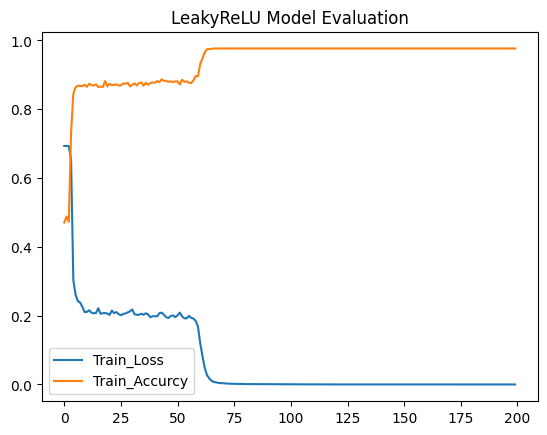

In [46]:
plt.title("LeakyReLU Model Evaluation")
plt.plot(history_LeakyReLU[0], label='Train_Loss')
for i in range(len(history_LeakyReLU[1])):
  history_LeakyReLU[1][i] = history_LeakyReLU[1][i].cpu()
plt.title("LeakyReLU Model Evaluation")
plt.plot(history_LeakyReLU[1], label='Train_Accurcy')
plt.legend()
plt.show()

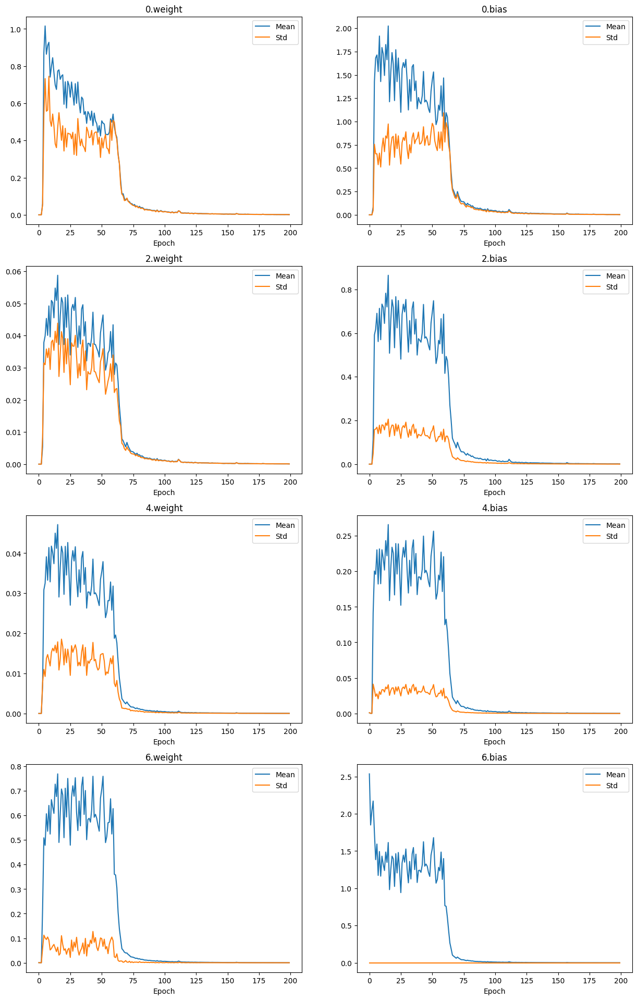

In [47]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,30))
for k, name in enumerate(history_LeakyReLU[2][0]):
  plt.subplot(5,2, 1+k)
  mean = []
  std_plot = []
  for i in range(len(history_LeakyReLU[2])):
    flatten_tensor = history_LeakyReLU[2][i][name].detach().cpu().flatten()
    mean.append(flatten_tensor.mean())
    std_plot.append(flatten_tensor.std())

  plt.plot(mean, label="Mean")
  plt.plot(std_plot, label="Std")

  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

<Figure size 3000x3500 with 0 Axes>

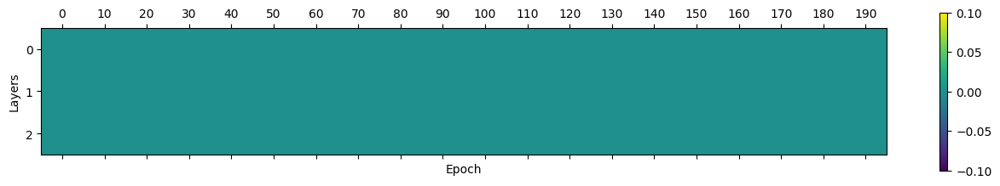

In [48]:
plt.figure(figsize=(30,35))
mean_rates = []
for k, name in enumerate(history_LeakyReLU[3][0]):
  mean_rate = []
  for j, i in enumerate(range(0, epoch, 10)):
    all_act = torch.cat(
      history_LeakyReLU[3][i][name]
    )
    mean_rate.append(np.mean(all_act.numpy()==0))
  mean_rates.append(mean_rate)
array =  np.array(mean_rates)
plt.matshow(array)
plt.xticks(range(0, epoch//10), range(0, epoch, 10))
plt.xlabel("Epoch")
plt.ylabel("Layers")
plt.colorbar()
plt.show()



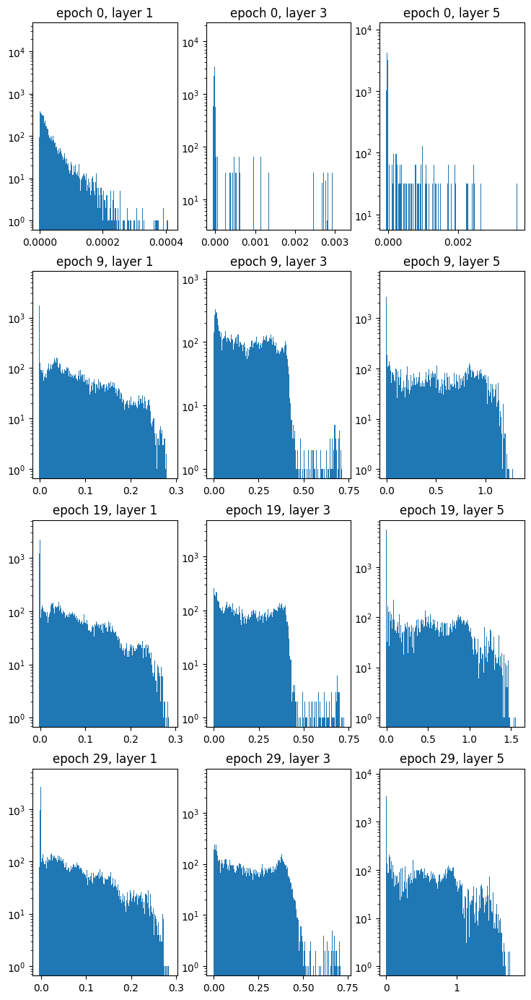

In [49]:
plt.figure(figsize=(15,35))
for j, i in enumerate([0, 9, 19, 29]):
  for k, name in enumerate(history_LeakyReLU[3][0]):
    plt.subplot(8, 5, 1+k+5*j)
    all_act = torch.cat(
      history_LeakyReLU[3][i][name]
    )
    plt.yscale("log")
    plt.title(f"epoch {i}, layer {name}")
    plt.hist(all_act.numpy(), bins=1000)
plt.show()

## Sigmoid Model

In [50]:
input_size = 2
num_classes = 2
Sigmoidmodel = nn.Sequential(
    nn.Linear(input_size, 64),
    nn.Sigmoid(),
    nn.Linear(64, 64),
    nn.Sigmoid(),
    nn.Linear(64, 64),
    nn.Sigmoid(),
    nn.Linear(64, num_classes)
)

In [51]:
for name, parm in ReLUmodel.named_parameters():
  nn.init.normal(parm, mean=0, std=std)

/tmp/ipykernel_7129/374293904.py:2: FutureWarning: `nn.init.normal` is now deprecated in favor of `nn.init.normal_`.
  nn.init.normal(parm, mean=0, std=std)


In [52]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_Sigmoid(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )

  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              batch_label
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.Sigmoid): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [53]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
Sigmoidmodel = Sigmoidmodel.to(device)
history_Sigmoid = train_model_Sigmoid(train_make_moons_dataloader, Sigmoidmodel, epoch, learning_rate=learning_rate, loss=loss, base_optimizer=optimizer, device = device)

100%|██████████| 32/32 [00:00<00:00, 234.37it/s]


Epoch 0 Loss : 0.6975641753524542
Epoch 0 accurcy : 0.4853515625


100%|██████████| 32/32 [00:00<00:00, 321.66it/s]


Epoch 1 Loss : 0.6829781867563725
Epoch 1 accurcy : 0.56640625


100%|██████████| 32/32 [00:00<00:00, 330.61it/s]


Epoch 2 Loss : 0.6483970955014229
Epoch 2 accurcy : 0.7509765625


100%|██████████| 32/32 [00:00<00:00, 332.80it/s]


Epoch 3 Loss : 0.5528318993747234
Epoch 3 accurcy : 0.7783203125


100%|██████████| 32/32 [00:00<00:00, 311.94it/s]


Epoch 4 Loss : 0.4225032622925937
Epoch 4 accurcy : 0.7939453125


100%|██████████| 32/32 [00:00<00:00, 324.72it/s]


Epoch 5 Loss : 0.3547679870389402
Epoch 5 accurcy : 0.8046875


100%|██████████| 32/32 [00:00<00:00, 330.72it/s]


Epoch 6 Loss : 0.32434881664812565
Epoch 6 accurcy : 0.8173828125


100%|██████████| 32/32 [00:00<00:00, 339.20it/s]


Epoch 7 Loss : 0.29205122287385166
Epoch 7 accurcy : 0.83203125


100%|██████████| 32/32 [00:00<00:00, 333.75it/s]


Epoch 8 Loss : 0.286739450879395
Epoch 8 accurcy : 0.8427734375


100%|██████████| 32/32 [00:00<00:00, 335.10it/s]


Epoch 9 Loss : 0.2711401963606477
Epoch 9 accurcy : 0.8525390625


100%|██████████| 32/32 [00:00<00:00, 333.58it/s]


Epoch 10 Loss : 0.26352164009585977
Epoch 10 accurcy : 0.861328125


100%|██████████| 32/32 [00:00<00:00, 334.11it/s]


Epoch 11 Loss : 0.25443538534455
Epoch 11 accurcy : 0.865234375


100%|██████████| 32/32 [00:00<00:00, 342.26it/s]


Epoch 12 Loss : 0.25955427903681993
Epoch 12 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 334.05it/s]


Epoch 13 Loss : 0.2510281321592629
Epoch 13 accurcy : 0.861328125


100%|██████████| 32/32 [00:00<00:00, 335.13it/s]


Epoch 14 Loss : 0.25755365705117583
Epoch 14 accurcy : 0.8564453125


100%|██████████| 32/32 [00:00<00:00, 337.87it/s]


Epoch 15 Loss : 0.26067292084917426
Epoch 15 accurcy : 0.8623046875


100%|██████████| 32/32 [00:00<00:00, 328.79it/s]


Epoch 16 Loss : 0.2628182682674378
Epoch 16 accurcy : 0.86328125


100%|██████████| 32/32 [00:00<00:00, 319.55it/s]


Epoch 17 Loss : 0.24731729552149773
Epoch 17 accurcy : 0.8603515625


100%|██████████| 32/32 [00:00<00:00, 336.33it/s]


Epoch 18 Loss : 0.25147706060670316
Epoch 18 accurcy : 0.861328125


100%|██████████| 32/32 [00:00<00:00, 336.85it/s]


Epoch 19 Loss : 0.24264527636114508
Epoch 19 accurcy : 0.8623046875


100%|██████████| 32/32 [00:00<00:00, 329.65it/s]


Epoch 20 Loss : 0.25610436918213964
Epoch 20 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 330.09it/s]


Epoch 21 Loss : 0.24056210392154753
Epoch 21 accurcy : 0.8671875


100%|██████████| 32/32 [00:00<00:00, 332.39it/s]


Epoch 22 Loss : 0.24352513276971877
Epoch 22 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 335.14it/s]


Epoch 23 Loss : 0.25316893530543894
Epoch 23 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 327.76it/s]


Epoch 24 Loss : 0.24233800126239657
Epoch 24 accurcy : 0.8681640625


100%|██████████| 32/32 [00:00<00:00, 326.42it/s]


Epoch 25 Loss : 0.25230921152979136
Epoch 25 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 338.57it/s]


Epoch 26 Loss : 0.2439252333715558
Epoch 26 accurcy : 0.8662109375


100%|██████████| 32/32 [00:00<00:00, 335.30it/s]


Epoch 27 Loss : 0.2557812971062958
Epoch 27 accurcy : 0.8662109375


100%|██████████| 32/32 [00:00<00:00, 339.41it/s]


Epoch 28 Loss : 0.25604144344106317
Epoch 28 accurcy : 0.865234375


100%|██████████| 32/32 [00:00<00:00, 326.08it/s]


Epoch 29 Loss : 0.241024280898273
Epoch 29 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 338.99it/s]


Epoch 30 Loss : 0.2487129580695182
Epoch 30 accurcy : 0.8681640625


100%|██████████| 32/32 [00:00<00:00, 339.59it/s]


Epoch 31 Loss : 0.2512210891582072
Epoch 31 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 336.48it/s]


Epoch 32 Loss : 0.24746257159858942
Epoch 32 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 329.32it/s]


Epoch 33 Loss : 0.25476283300668
Epoch 33 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 327.58it/s]


Epoch 34 Loss : 0.25207534059882164
Epoch 34 accurcy : 0.861328125


100%|██████████| 32/32 [00:00<00:00, 337.52it/s]


Epoch 35 Loss : 0.25045145861804485
Epoch 35 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 335.12it/s]


Epoch 36 Loss : 0.24477137625217438
Epoch 36 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 333.56it/s]


Epoch 37 Loss : 0.23878521495498717
Epoch 37 accurcy : 0.8662109375


100%|██████████| 32/32 [00:00<00:00, 314.01it/s]


Epoch 38 Loss : 0.23778217751532793
Epoch 38 accurcy : 0.865234375


100%|██████████| 32/32 [00:00<00:00, 329.76it/s]


Epoch 39 Loss : 0.24592436803504825
Epoch 39 accurcy : 0.8642578125


100%|██████████| 32/32 [00:00<00:00, 324.94it/s]


Epoch 40 Loss : 0.24839765462093055
Epoch 40 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 331.01it/s]

Epoch 41 Loss : 0.2373284506611526


Epoch 41 accurcy : 0.861328125


100%|██████████| 32/32 [00:00<00:00, 322.99it/s]


Epoch 42 Loss : 0.2383102928288281
Epoch 42 accurcy : 0.8671875


100%|██████████| 32/32 [00:00<00:00, 327.77it/s]


Epoch 43 Loss : 0.22932111052796245
Epoch 43 accurcy : 0.87109375


100%|██████████| 32/32 [00:00<00:00, 332.70it/s]


Epoch 44 Loss : 0.23564889002591372
Epoch 44 accurcy : 0.8671875


100%|██████████| 32/32 [00:00<00:00, 335.40it/s]


Epoch 45 Loss : 0.2310446046758443
Epoch 45 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 332.66it/s]


Epoch 46 Loss : 0.23039762116968632
Epoch 46 accurcy : 0.8740234375


100%|██████████| 32/32 [00:00<00:00, 316.34it/s]


Epoch 47 Loss : 0.23416493507102132
Epoch 47 accurcy : 0.8720703125


100%|██████████| 32/32 [00:00<00:00, 334.80it/s]


Epoch 48 Loss : 0.23093199403956532
Epoch 48 accurcy : 0.8740234375


100%|██████████| 32/32 [00:00<00:00, 332.84it/s]


Epoch 49 Loss : 0.23076068982481956
Epoch 49 accurcy : 0.869140625


100%|██████████| 32/32 [00:00<00:00, 337.09it/s]


Epoch 50 Loss : 0.22774790122639388
Epoch 50 accurcy : 0.875


100%|██████████| 32/32 [00:00<00:00, 338.84it/s]


Epoch 51 Loss : 0.23466515284962952
Epoch 51 accurcy : 0.8681640625


100%|██████████| 32/32 [00:00<00:00, 343.26it/s]


Epoch 52 Loss : 0.2210732721723616
Epoch 52 accurcy : 0.8779296875


100%|██████████| 32/32 [00:00<00:00, 324.56it/s]


Epoch 53 Loss : 0.22105462779290974
Epoch 53 accurcy : 0.8779296875


100%|██████████| 32/32 [00:00<00:00, 325.35it/s]


Epoch 54 Loss : 0.23412179702427238
Epoch 54 accurcy : 0.8701171875


100%|██████████| 32/32 [00:00<00:00, 324.76it/s]


Epoch 55 Loss : 0.22393417358398438
Epoch 55 accurcy : 0.8779296875


100%|██████████| 32/32 [00:00<00:00, 329.51it/s]


Epoch 56 Loss : 0.2160182137740776
Epoch 56 accurcy : 0.875


100%|██████████| 32/32 [00:00<00:00, 334.27it/s]


Epoch 57 Loss : 0.2188455080613494
Epoch 57 accurcy : 0.8740234375


100%|██████████| 32/32 [00:00<00:00, 333.56it/s]


Epoch 58 Loss : 0.20879316749051213
Epoch 58 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 326.97it/s]


Epoch 59 Loss : 0.21216760552488267
Epoch 59 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 333.86it/s]


Epoch 60 Loss : 0.2088205865584314
Epoch 60 accurcy : 0.880859375


100%|██████████| 32/32 [00:00<00:00, 333.00it/s]


Epoch 61 Loss : 0.2089220534544438
Epoch 61 accurcy : 0.8896484375


100%|██████████| 32/32 [00:00<00:00, 330.15it/s]


Epoch 62 Loss : 0.21034083212725818
Epoch 62 accurcy : 0.884765625


100%|██████████| 32/32 [00:00<00:00, 327.95it/s]


Epoch 63 Loss : 0.19794248114340007
Epoch 63 accurcy : 0.8818359375


100%|██████████| 32/32 [00:00<00:00, 332.13it/s]


Epoch 64 Loss : 0.19315542839467525
Epoch 64 accurcy : 0.884765625


100%|██████████| 32/32 [00:00<00:00, 326.46it/s]


Epoch 65 Loss : 0.1979122180491686
Epoch 65 accurcy : 0.88671875


100%|██████████| 32/32 [00:00<00:00, 320.16it/s]


Epoch 66 Loss : 0.19122016127221286
Epoch 66 accurcy : 0.9013671875


100%|██████████| 32/32 [00:00<00:00, 321.54it/s]


Epoch 67 Loss : 0.1884842135477811
Epoch 67 accurcy : 0.8955078125


100%|██████████| 32/32 [00:00<00:00, 328.08it/s]


Epoch 68 Loss : 0.17212619655765593
Epoch 68 accurcy : 0.9033203125


100%|██████████| 32/32 [00:00<00:00, 336.73it/s]


Epoch 69 Loss : 0.17036846466362476
Epoch 69 accurcy : 0.8974609375


100%|██████████| 32/32 [00:00<00:00, 333.72it/s]


Epoch 70 Loss : 0.16167782875709236
Epoch 70 accurcy : 0.9130859375


100%|██████████| 32/32 [00:00<00:00, 334.48it/s]


Epoch 71 Loss : 0.1557057062163949
Epoch 71 accurcy : 0.9033203125


100%|██████████| 32/32 [00:00<00:00, 333.44it/s]


Epoch 72 Loss : 0.14535988541319966
Epoch 72 accurcy : 0.9091796875


100%|██████████| 32/32 [00:00<00:00, 330.03it/s]


Epoch 73 Loss : 0.1394514786079526
Epoch 73 accurcy : 0.916015625


100%|██████████| 32/32 [00:00<00:00, 328.46it/s]


Epoch 74 Loss : 0.1315396639984101
Epoch 74 accurcy : 0.921875


100%|██████████| 32/32 [00:00<00:00, 330.12it/s]


Epoch 75 Loss : 0.1257781821768731
Epoch 75 accurcy : 0.92578125


100%|██████████| 32/32 [00:00<00:00, 331.73it/s]


Epoch 76 Loss : 0.12145757209509611
Epoch 76 accurcy : 0.9326171875


100%|██████████| 32/32 [00:00<00:00, 335.56it/s]


Epoch 77 Loss : 0.11022000142838806
Epoch 77 accurcy : 0.9306640625


100%|██████████| 32/32 [00:00<00:00, 337.23it/s]


Epoch 78 Loss : 0.10674790409393609
Epoch 78 accurcy : 0.939453125


100%|██████████| 32/32 [00:00<00:00, 331.73it/s]


Epoch 79 Loss : 0.0908484865212813
Epoch 79 accurcy : 0.9423828125


100%|██████████| 32/32 [00:00<00:00, 333.37it/s]


Epoch 80 Loss : 0.08433209464419633
Epoch 80 accurcy : 0.94921875


100%|██████████| 32/32 [00:00<00:00, 335.32it/s]


Epoch 81 Loss : 0.07344972912687808
Epoch 81 accurcy : 0.95703125


100%|██████████| 32/32 [00:00<00:00, 336.60it/s]


Epoch 82 Loss : 0.07014627201715484
Epoch 82 accurcy : 0.9541015625


100%|██████████| 32/32 [00:00<00:00, 331.49it/s]


Epoch 83 Loss : 0.07395947247277945
Epoch 83 accurcy : 0.953125


100%|██████████| 32/32 [00:00<00:00, 335.76it/s]


Epoch 84 Loss : 0.05771621147869155
Epoch 84 accurcy : 0.96484375


100%|██████████| 32/32 [00:00<00:00, 331.96it/s]


Epoch 85 Loss : 0.058896398928482085
Epoch 85 accurcy : 0.9658203125


100%|██████████| 32/32 [00:00<00:00, 333.78it/s]


Epoch 86 Loss : 0.05237586988369003
Epoch 86 accurcy : 0.966796875


100%|██████████| 32/32 [00:00<00:00, 336.54it/s]


Epoch 87 Loss : 0.043194378609769046
Epoch 87 accurcy : 0.96875


100%|██████████| 32/32 [00:00<00:00, 302.25it/s]


Epoch 88 Loss : 0.04025414536590688
Epoch 88 accurcy : 0.970703125


100%|██████████| 32/32 [00:00<00:00, 314.39it/s]


Epoch 89 Loss : 0.03659187926677987
Epoch 89 accurcy : 0.970703125


100%|██████████| 32/32 [00:00<00:00, 326.41it/s]


Epoch 90 Loss : 0.03372296196175739
Epoch 90 accurcy : 0.97265625


100%|██████████| 32/32 [00:00<00:00, 333.58it/s]


Epoch 91 Loss : 0.03685167204821482
Epoch 91 accurcy : 0.97265625


100%|██████████| 32/32 [00:00<00:00, 330.17it/s]


Epoch 92 Loss : 0.03557560199260479
Epoch 92 accurcy : 0.970703125


100%|██████████| 32/32 [00:00<00:00, 329.55it/s]


Epoch 93 Loss : 0.02599843786447309
Epoch 93 accurcy : 0.97265625


100%|██████████| 32/32 [00:00<00:00, 300.25it/s]


Epoch 94 Loss : 0.028633978421567008
Epoch 94 accurcy : 0.97265625


100%|██████████| 32/32 [00:00<00:00, 333.85it/s]


Epoch 95 Loss : 0.02284261753084138
Epoch 95 accurcy : 0.974609375


100%|██████████| 32/32 [00:00<00:00, 335.34it/s]


Epoch 96 Loss : 0.02080387924797833
Epoch 96 accurcy : 0.9755859375


100%|██████████| 32/32 [00:00<00:00, 334.02it/s]


Epoch 97 Loss : 0.022151459255837835
Epoch 97 accurcy : 0.9736328125


100%|██████████| 32/32 [00:00<00:00, 322.87it/s]


Epoch 98 Loss : 0.02051570502226241
Epoch 98 accurcy : 0.974609375


100%|██████████| 32/32 [00:00<00:00, 298.70it/s]


Epoch 99 Loss : 0.01716374840179924
Epoch 99 accurcy : 0.9755859375


100%|██████████| 32/32 [00:00<00:00, 326.39it/s]


Epoch 100 Loss : 0.019081455218838528
Epoch 100 accurcy : 0.9736328125


100%|██████████| 32/32 [00:00<00:00, 325.71it/s]


Epoch 101 Loss : 0.015587362737278454
Epoch 101 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.38it/s]


Epoch 102 Loss : 0.013889240566641092
Epoch 102 accurcy : 0.9755859375


100%|██████████| 32/32 [00:00<00:00, 321.70it/s]


Epoch 103 Loss : 0.01506125227024313
Epoch 103 accurcy : 0.9755859375


100%|██████████| 32/32 [00:00<00:00, 310.25it/s]


Epoch 104 Loss : 0.01210806577000767
Epoch 104 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.93it/s]


Epoch 105 Loss : 0.01385043172922451
Epoch 105 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.10it/s]


Epoch 106 Loss : 0.013195137260481715
Epoch 106 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.85it/s]


Epoch 107 Loss : 0.010996506545779994
Epoch 107 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.99it/s]


Epoch 108 Loss : 0.010750698573247064
Epoch 108 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.98it/s]


Epoch 109 Loss : 0.010971492411044892
Epoch 109 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.14it/s]


Epoch 110 Loss : 0.010149079338589218
Epoch 110 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 340.12it/s]


Epoch 111 Loss : 0.008462196674372535
Epoch 111 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 338.32it/s]


Epoch 112 Loss : 0.008138471061101882
Epoch 112 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 339.54it/s]


Epoch 113 Loss : 0.008196269067411777
Epoch 113 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 338.03it/s]


Epoch 114 Loss : 0.007919796440546634
Epoch 114 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 339.22it/s]


Epoch 115 Loss : 0.007917830500446144
Epoch 115 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 336.56it/s]


Epoch 116 Loss : 0.006917826125572901
Epoch 116 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 338.20it/s]


Epoch 117 Loss : 0.006500955663796049
Epoch 117 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.38it/s]


Epoch 118 Loss : 0.00625782130373409
Epoch 118 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.57it/s]


Epoch 119 Loss : 0.005937752954196185
Epoch 119 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.94it/s]


Epoch 120 Loss : 0.0062813105978420936
Epoch 120 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 338.14it/s]


Epoch 121 Loss : 0.005777888498414541
Epoch 121 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.33it/s]


Epoch 122 Loss : 0.005544232113606995
Epoch 122 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.20it/s]


Epoch 123 Loss : 0.005677221583027858
Epoch 123 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.35it/s]


Epoch 124 Loss : 0.005715451217838563
Epoch 124 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 335.39it/s]


Epoch 125 Loss : 0.006312793630058877
Epoch 125 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.74it/s]


Epoch 126 Loss : 0.00564728081371868
Epoch 126 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.08it/s]


Epoch 127 Loss : 0.0045956349349580705
Epoch 127 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.25it/s]


Epoch 128 Loss : 0.004171168468019459
Epoch 128 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 335.08it/s]


Epoch 129 Loss : 0.004026925034850137
Epoch 129 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.03it/s]


Epoch 130 Loss : 0.004238023715515737
Epoch 130 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.89it/s]


Epoch 131 Loss : 0.004453605142771266
Epoch 131 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 336.40it/s]


Epoch 132 Loss : 0.004660614211388747
Epoch 132 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.75it/s]


Epoch 133 Loss : 0.004055715508002322
Epoch 133 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 336.02it/s]


Epoch 134 Loss : 0.0038869757336215116
Epoch 134 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 340.55it/s]


Epoch 135 Loss : 0.0037723811219620984
Epoch 135 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.90it/s]


Epoch 136 Loss : 0.0031644932359995437
Epoch 136 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.69it/s]


Epoch 137 Loss : 0.0031633130711270496
Epoch 137 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.59it/s]


Epoch 138 Loss : 0.0031081218003237154
Epoch 138 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 336.56it/s]


Epoch 139 Loss : 0.00447465131401259
Epoch 139 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.20it/s]


Epoch 140 Loss : 0.003805361745889968
Epoch 140 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.74it/s]


Epoch 141 Loss : 0.00261382301505364
Epoch 141 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 336.39it/s]


Epoch 142 Loss : 0.0027731137506634695
Epoch 142 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 340.08it/s]


Epoch 143 Loss : 0.0026708205996328616
Epoch 143 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.70it/s]


Epoch 144 Loss : 0.002843921429303009
Epoch 144 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.63it/s]


Epoch 145 Loss : 0.0024037973744270857
Epoch 145 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 339.15it/s]


Epoch 146 Loss : 0.002358212384933722
Epoch 146 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.14it/s]


Epoch 147 Loss : 0.0026793376318892115
Epoch 147 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.26it/s]


Epoch 148 Loss : 0.002502644763808348
Epoch 148 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.08it/s]


Epoch 149 Loss : 0.002197506396441895
Epoch 149 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.00it/s]


Epoch 150 Loss : 0.0024636087400722317
Epoch 150 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 320.93it/s]


Epoch 151 Loss : 0.0020437182301975554
Epoch 151 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.24it/s]


Epoch 152 Loss : 0.002031171025009826
Epoch 152 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.29it/s]


Epoch 153 Loss : 0.0020252081940270728
Epoch 153 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.03it/s]


Epoch 154 Loss : 0.0021020016611146275
Epoch 154 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.34it/s]


Epoch 155 Loss : 0.002035610864368209
Epoch 155 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.12it/s]


Epoch 156 Loss : 0.0018945240390166873
Epoch 156 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.30it/s]


Epoch 157 Loss : 0.0018292079339516931
Epoch 157 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.70it/s]


Epoch 158 Loss : 0.0017799208499127417
Epoch 158 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.19it/s]


Epoch 159 Loss : 0.0016620338146822178
Epoch 159 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.01it/s]


Epoch 160 Loss : 0.0015807992831469164
Epoch 160 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.57it/s]


Epoch 161 Loss : 0.00168437770116725
Epoch 161 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.37it/s]


Epoch 162 Loss : 0.0014942722064006375
Epoch 162 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.65it/s]


Epoch 163 Loss : 0.0014916086211087531
Epoch 163 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.62it/s]


Epoch 164 Loss : 0.0014165221787152404
Epoch 164 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.94it/s]


Epoch 165 Loss : 0.0015151174657148658
Epoch 165 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 335.23it/s]


Epoch 166 Loss : 0.0015456523101420316
Epoch 166 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.36it/s]


Epoch 167 Loss : 0.0014016137974977028
Epoch 167 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.81it/s]


Epoch 168 Loss : 0.0012726922886940883
Epoch 168 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 334.07it/s]


Epoch 169 Loss : 0.0013419817087196861
Epoch 169 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.54it/s]


Epoch 170 Loss : 0.001250652247108519
Epoch 170 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 321.56it/s]


Epoch 171 Loss : 0.001540270072837302
Epoch 171 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.07it/s]


Epoch 172 Loss : 0.0012456122381081514
Epoch 172 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.06it/s]


Epoch 173 Loss : 0.0014772771091884351
Epoch 173 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 327.43it/s]


Epoch 174 Loss : 0.0011239981495236862
Epoch 174 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 332.70it/s]


Epoch 175 Loss : 0.0011380486475900398
Epoch 175 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.72it/s]


Epoch 176 Loss : 0.0011156478644807066
Epoch 176 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 337.26it/s]


Epoch 177 Loss : 0.0011288977455023996
Epoch 177 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 338.49it/s]


Epoch 178 Loss : 0.0010732857581388089
Epoch 178 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 324.63it/s]


Epoch 179 Loss : 0.001036511145230179
Epoch 179 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.95it/s]


Epoch 180 Loss : 0.0010171406861445575
Epoch 180 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.62it/s]


Epoch 181 Loss : 0.0009705232459964463
Epoch 181 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.85it/s]


Epoch 182 Loss : 0.0009824959215620765
Epoch 182 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 330.75it/s]


Epoch 183 Loss : 0.0009923583202180453
Epoch 183 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.45it/s]


Epoch 184 Loss : 0.000871602267579874
Epoch 184 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.55it/s]


Epoch 185 Loss : 0.0011323559624543122
Epoch 185 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.40it/s]


Epoch 186 Loss : 0.0011181991449120687
Epoch 186 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.26it/s]


Epoch 187 Loss : 0.0009793611438908556
Epoch 187 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 316.08it/s]


Epoch 188 Loss : 0.0009009642189994338
Epoch 188 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 329.87it/s]


Epoch 189 Loss : 0.0010009298198383476
Epoch 189 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.44it/s]


Epoch 190 Loss : 0.0011180771053886929
Epoch 190 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.13it/s]


Epoch 191 Loss : 0.0012151267305853253
Epoch 191 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 323.76it/s]


Epoch 192 Loss : 0.0007730300042112503
Epoch 192 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.61it/s]


Epoch 193 Loss : 0.0007080480032186642
Epoch 193 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.36it/s]


Epoch 194 Loss : 0.0007439778288471643
Epoch 194 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 333.28it/s]


Epoch 195 Loss : 0.0008391311844206939
Epoch 195 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 328.50it/s]


Epoch 196 Loss : 0.0009724594588078617
Epoch 196 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 326.15it/s]

Epoch 197 Loss : 0.00069728010248582


Epoch 197 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 331.44it/s]


Epoch 198 Loss : 0.0008249505024195969
Epoch 198 accurcy : 0.9765625


100%|██████████| 32/32 [00:00<00:00, 325.26it/s]


Epoch 199 Loss : 0.0008719607703824295
Epoch 199 accurcy : 0.9765625


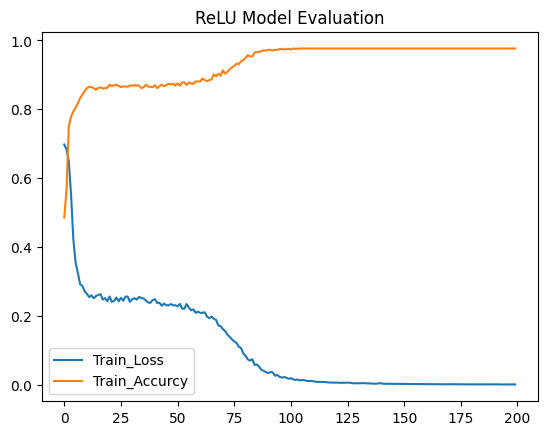

In [54]:
plt.title("ReLU Model Evaluation")
plt.plot(history_Sigmoid[0], label='Train_Loss')
for i in range(len(history_Sigmoid[1])):
  history_Sigmoid[1][i] = history_Sigmoid[1][i].cpu()
plt.title("ReLU Model Evaluation")
plt.plot(history_Sigmoid[1], label='Train_Accurcy')
plt.legend()
plt.show()

<Figure size 3000x3500 with 0 Axes>

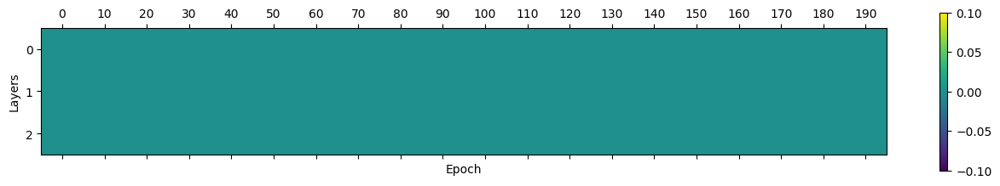

In [55]:
plt.figure(figsize=(30,35))
mean_rates = []
for k, name in enumerate(history_Sigmoid[3][0]):
  mean_rate = []
  for j, i in enumerate(range(0, epoch, 10)):
    all_act = torch.cat(
      history_Sigmoid[3][i][name]
    )
    mean_rate.append(np.mean(all_act.numpy()==0))
  mean_rates.append(mean_rate)
array =  np.array(mean_rates)
plt.matshow(array)
plt.xticks(range(0, epoch//10), range(0, epoch, 10))
plt.xlabel("Epoch")
plt.ylabel("Layers")
plt.colorbar()
plt.show()

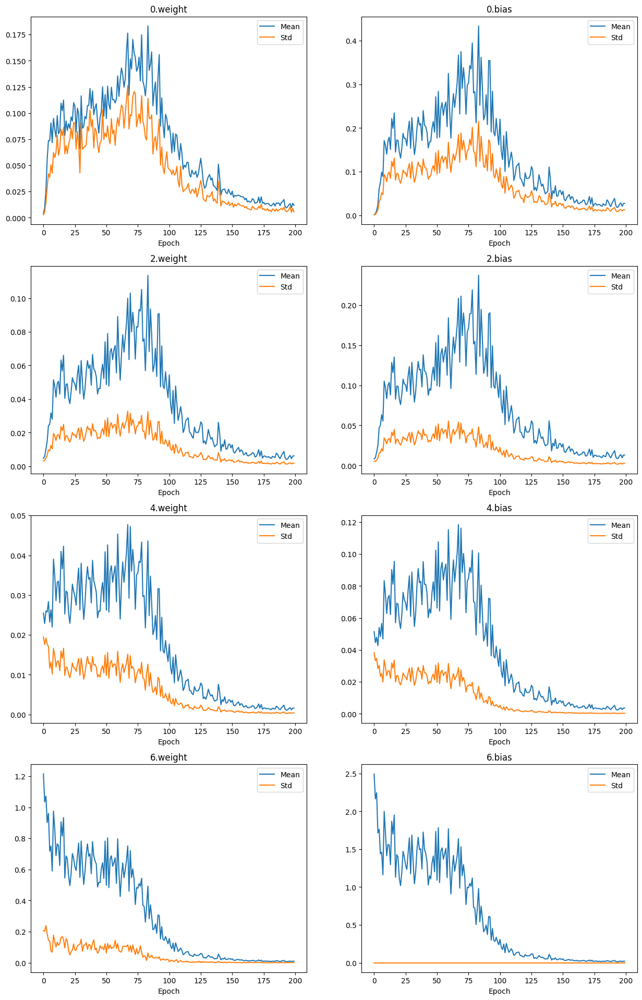

In [56]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,30))
for k, name in enumerate(history_Sigmoid[2][0]):
  plt.subplot(5,2, 1+k)
  mean = []
  std_plot = []
  for i in range(len(history_Sigmoid[2])):
    flatten_tensor = history_Sigmoid[2][i][name].detach().cpu().flatten()
    mean.append(flatten_tensor.mean())
    std_plot.append(flatten_tensor.std())

  plt.plot(mean, label="Mean")
  plt.plot(std_plot, label="Std")

  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

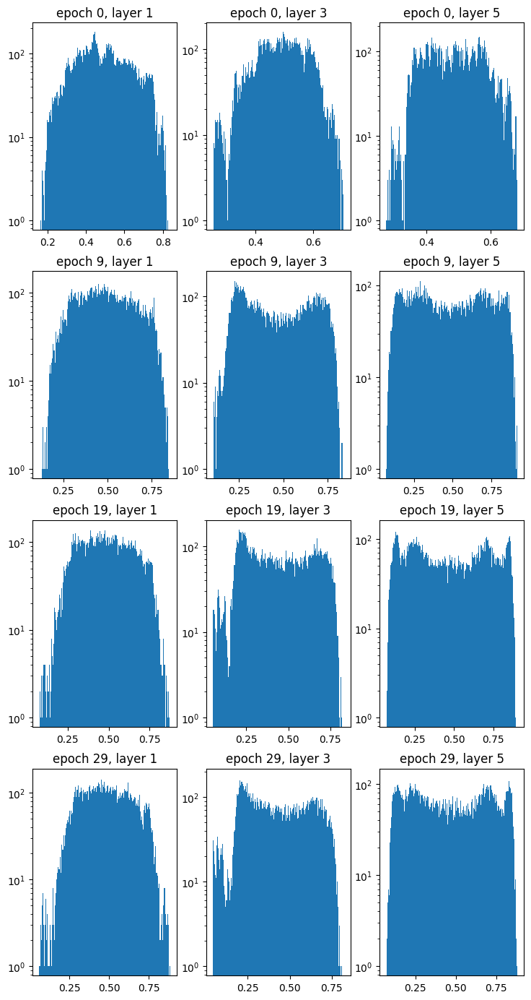

In [57]:
plt.figure(figsize=(15,35))
for j, i in enumerate([0, 9, 19, 29]):
  for k, name in enumerate(history_Sigmoid[3][0]):
    plt.subplot(8, 5, 1+k+5*j)
    all_act = torch.cat(
      history_Sigmoid[3][i][name]
    )
    plt.yscale("log")
    plt.title(f"epoch {i}, layer {name}")
    plt.hist(all_act.numpy(), bins=1000)
plt.show()

## 전체 Gradient 비교

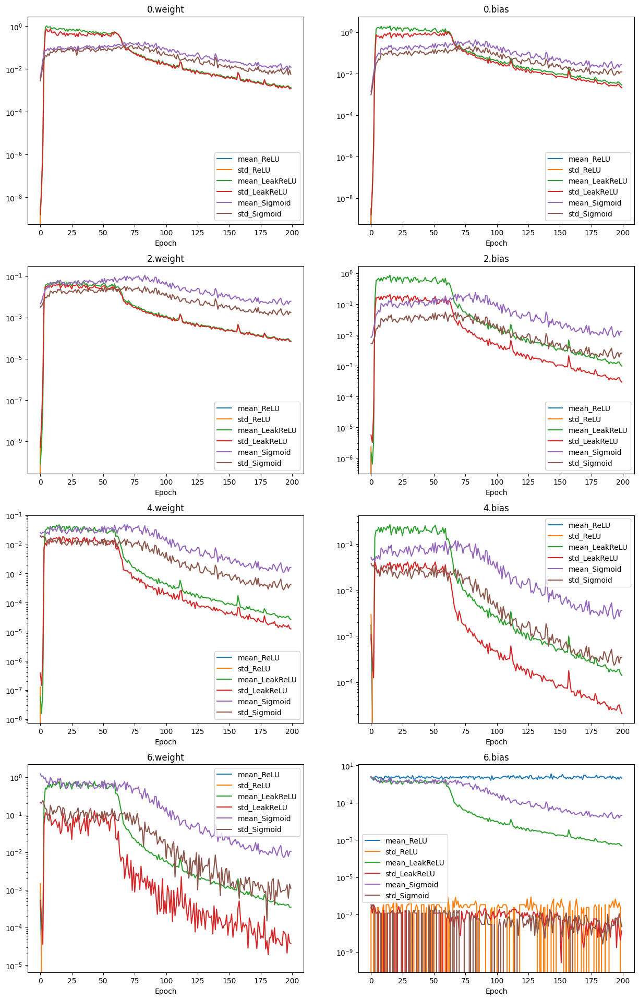

In [58]:
plt.figure(figsize=(15,30))
for k, name in enumerate(history_ReLU[2][0]):
  plt.subplot(5, 2, 1+k)
  mean_ReLU = []
  std_ReLU = []
  mean_LeakReLU = []
  std_LeakReLU = []
  mean_Sigmoid = []
  std_Sigmoid = []
  for i in range(len(history_ReLU[2])):
    flatten_tensor = history_ReLU[2][i][name].detach().cpu().flatten()
    mean_ReLU.append(flatten_tensor.mean())
    std_ReLU.append(flatten_tensor.std())
    flatten_tensor = history_LeakyReLU[2][i][name].detach().cpu().flatten()
    mean_LeakReLU.append(flatten_tensor.mean())
    std_LeakReLU.append(flatten_tensor.std())
    flatten_tensor = history_Sigmoid[2][i][name].detach().cpu().flatten()
    mean_Sigmoid.append(flatten_tensor.mean())
    std_Sigmoid.append(flatten_tensor.std())

  plt.plot(mean_ReLU, label="mean_ReLU")
  plt.plot(std_ReLU, label="std_ReLU")
  plt.plot(mean_LeakReLU, label="mean_LeakReLU")
  plt.plot(std_LeakReLU, label="std_LeakReLU")
  plt.plot(mean_Sigmoid, label="mean_Sigmoid")
  plt.plot(std_Sigmoid, label="std_Sigmoid")

  plt.yscale('log')
  plt.title(name)
  plt.xlabel("Epoch")
  plt.legend()

plt.show()

## Model 간 Accuarcy, Loss 비교

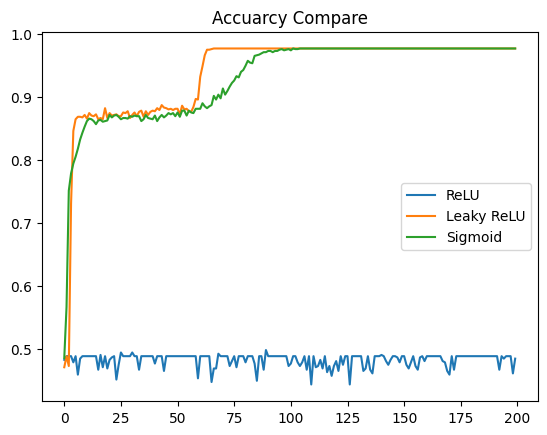

In [59]:
plt.title("Accuarcy Compare")
for i in range(len(history_ReLU[1])):
  history_ReLU[1][i] = history_ReLU[1][i].cpu()
plt.plot(history_ReLU[1], label='ReLU')
for i in range(len(history_LeakyReLU[1])):
  history_LeakyReLU[1][i] = history_LeakyReLU[1][i].cpu()
plt.plot(history_LeakyReLU[1], label='Leaky ReLU')
for i in range(len(history_Sigmoid[1])):
  history_Sigmoid[1][i] = history_Sigmoid[1][i].cpu()
plt.plot(history_Sigmoid[1], label='Sigmoid')
plt.legend()
plt.show()

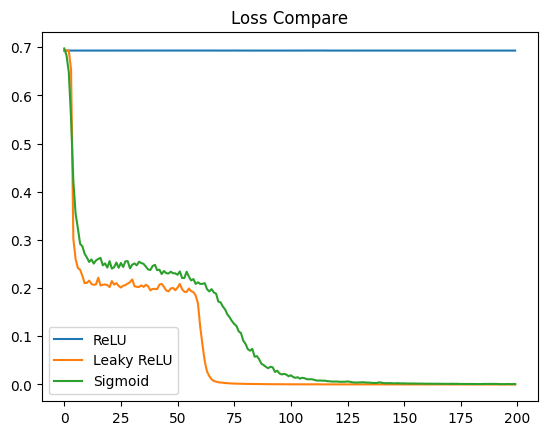

In [60]:
plt.title("Loss Compare")
plt.plot(history_ReLU[0], label='ReLU')
plt.plot(history_LeakyReLU[0], label='Leaky ReLU')
plt.plot(history_Sigmoid[0], label='Sigmoid')
plt.legend()
plt.show()

## 메모리 삭제

In [61]:
del history_ReLU
del history_LeakyReLU
del history_Sigmoid

# 최적화 알고리즘 비교 : SGD, SGD+Momentum, Adam

## 데이터 셋 준비

In [62]:
! pip install scikit-learn
! pip install numpy
! pip install torch
! pip install tensorflow

In [63]:
import sklearn.datasets as dataset
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
from tensorflow.keras import datasets
import torch
import tqdm
import random

In [64]:
# Fashion Mnist 데이터 셋 구성
(train_x, train_y), (test_x, test_y) = datasets.fashion_mnist.load_data()

In [65]:
class fashion_mnist_dataset(torch.utils.data.Dataset):
  def __init__(self, x_y : tuple):
    self.X, self.y = x_y
  def __getitem__(self, index):
    return self.X[index], self.y[index]
  def __len__(self):
    return len(self.X)

In [66]:
## 입력 데이터 Flatten (평탄화)
train_x_flatten = train_x.reshape(train_x.shape[0], -1).astype(np.float32)
test_x_flatten = test_x.reshape(test_x.shape[0], -1).astype(np.float32)

## 입력 데이터 Scaling (Min-Max)
train_x_flatten = train_x_flatten / 255.0
test_x_flatten = test_x_flatten / 255.0

In [67]:
train_y = torch.from_numpy(train_y)
train_one_hot_fashion_mnist_dataset = fashion_mnist_dataset((torch.from_numpy(train_x_flatten), torch.nn.functional.one_hot(train_y.type(torch.LongTensor)).type(torch.float32)))
train_sparse_fashion_mnist_dataset = fashion_mnist_dataset((torch.from_numpy(train_x_flatten),train_y))

In [68]:
train_one_hot_fashion_mnist_dataloader = torch.utils.data.DataLoader(train_one_hot_fashion_mnist_dataset, batch_size=32, shuffle=True)
train_sparse_fashion_mnist_dataloader = torch.utils.data.DataLoader(train_sparse_fashion_mnist_dataset, batch_size=32, shuffle=True)

## SGD

In [69]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_SGD(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device,
    isdecay
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )
  if isdecay:
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
  else :
    scheduler = None
  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              batch_label
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.ReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # scheduler를 이용하여 Lr값 지수 보정
    if scheduler != None:
      scheduler.step()

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [70]:
def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform(m.weight)
        m.bias.data.fill_(0.01)

In [71]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [72]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [73]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_1_SGD_with = train_model_SGD(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.1, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=True)
history_model_e_1_SGD_without = train_model_SGD(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.1, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:04<00:00, 383.77it/s]


Epoch 0 Loss : 0.5220173347115522
Epoch 0 accurcy : 0.8114002346992493


100%|██████████| 1875/1875 [00:04<00:00, 467.63it/s]


Epoch 1 Loss : 0.3755122429013251
Epoch 1 accurcy : 0.8628661632537842


100%|██████████| 1875/1875 [00:04<00:00, 461.25it/s]


Epoch 2 Loss : 0.3348607339680201
Epoch 2 accurcy : 0.8762831687927246


100%|██████████| 1875/1875 [00:04<00:00, 458.53it/s]


Epoch 3 Loss : 0.30705833643277475
Epoch 3 accurcy : 0.8869995474815369


100%|██████████| 1875/1875 [00:04<00:00, 452.40it/s]


Epoch 4 Loss : 0.28722305435935674
Epoch 4 accurcy : 0.8938990831375122


100%|██████████| 1875/1875 [00:04<00:00, 467.62it/s]


Epoch 5 Loss : 0.271201466697455
Epoch 5 accurcy : 0.8980162739753723


100%|██████████| 1875/1875 [00:04<00:00, 463.32it/s]


Epoch 6 Loss : 0.25657820737163206
Epoch 6 accurcy : 0.9037668108940125


100%|██████████| 1875/1875 [00:04<00:00, 463.94it/s]


Epoch 7 Loss : 0.2442202133531369
Epoch 7 accurcy : 0.9086164236068726


100%|██████████| 1875/1875 [00:03<00:00, 471.46it/s]


Epoch 8 Loss : 0.23098289303580885
Epoch 8 accurcy : 0.9128159880638123


100%|██████████| 1875/1875 [00:04<00:00, 392.79it/s]


Epoch 9 Loss : 0.22172588804811197
Epoch 9 accurcy : 0.9175165891647339


100%|██████████| 1875/1875 [00:04<00:00, 463.74it/s]


Epoch 10 Loss : 0.21313853478829048
Epoch 10 accurcy : 0.9206332564353943


100%|██████████| 1875/1875 [00:04<00:00, 449.83it/s]


Epoch 11 Loss : 0.20559877852052438
Epoch 11 accurcy : 0.9235332012176514


100%|██████████| 1875/1875 [00:04<00:00, 449.64it/s]


Epoch 12 Loss : 0.19728479782541553
Epoch 12 accurcy : 0.9280503988265991


100%|██████████| 1875/1875 [00:04<00:00, 464.69it/s]


Epoch 13 Loss : 0.1900258494153621
Epoch 13 accurcy : 0.9297007322311401


100%|██████████| 1875/1875 [00:03<00:00, 473.06it/s]


Epoch 14 Loss : 0.18379350461810845
Epoch 14 accurcy : 0.9322832226753235


100%|██████████| 1875/1875 [00:03<00:00, 469.01it/s]


Epoch 15 Loss : 0.17735283290048426
Epoch 15 accurcy : 0.9351838827133179


100%|██████████| 1875/1875 [00:04<00:00, 465.07it/s]


Epoch 16 Loss : 0.17268837724079666
Epoch 16 accurcy : 0.9364491701126099


100%|██████████| 1875/1875 [00:04<00:00, 456.71it/s]


Epoch 17 Loss : 0.1674154705052571
Epoch 17 accurcy : 0.9385830760002136


100%|██████████| 1875/1875 [00:04<00:00, 460.65it/s]


Epoch 18 Loss : 0.1630313608398038
Epoch 18 accurcy : 0.9401005506515503


100%|██████████| 1875/1875 [00:04<00:00, 397.66it/s]


Epoch 19 Loss : 0.15883119847774502
Epoch 19 accurcy : 0.9415836334228516


100%|██████████| 1875/1875 [00:03<00:00, 473.78it/s]


Epoch 20 Loss : 0.15488091554840408
Epoch 20 accurcy : 0.9439670443534851


100%|██████████| 1875/1875 [00:03<00:00, 473.68it/s]


Epoch 21 Loss : 0.15101409462044657
Epoch 21 accurcy : 0.9452330470085144


100%|██████████| 1875/1875 [00:03<00:00, 469.39it/s]


Epoch 22 Loss : 0.1481759392201899
Epoch 22 accurcy : 0.9460670351982117


100%|██████████| 1875/1875 [00:03<00:00, 477.76it/s]


Epoch 23 Loss : 0.1448604356651506
Epoch 23 accurcy : 0.948367178440094


100%|██████████| 1875/1875 [00:03<00:00, 472.17it/s]


Epoch 24 Loss : 0.14221534983813747
Epoch 24 accurcy : 0.9490330815315247


100%|██████████| 1875/1875 [00:04<00:00, 466.27it/s]


Epoch 25 Loss : 0.13984544102897248
Epoch 25 accurcy : 0.9499675631523132


100%|██████████| 1875/1875 [00:04<00:00, 459.62it/s]


Epoch 26 Loss : 0.1374577596127986
Epoch 26 accurcy : 0.9512667059898376


100%|██████████| 1875/1875 [00:04<00:00, 468.12it/s]


Epoch 27 Loss : 0.13539442101617646
Epoch 27 accurcy : 0.9523999094963074


100%|██████████| 1875/1875 [00:03<00:00, 473.12it/s]


Epoch 28 Loss : 0.1335575245325767
Epoch 28 accurcy : 0.9528006911277771


100%|██████████| 1875/1875 [00:04<00:00, 398.47it/s]


Epoch 29 Loss : 0.13165252423932153
Epoch 29 accurcy : 0.9534167647361755


100%|██████████| 1875/1875 [00:04<00:00, 391.80it/s]


Epoch 0 Loss : 0.5209201478600506
Epoch 0 accurcy : 0.8112510442733765


100%|██████████| 1875/1875 [00:03<00:00, 468.85it/s]


Epoch 1 Loss : 0.3821939426382391
Epoch 1 accurcy : 0.8579835295677185


100%|██████████| 1875/1875 [00:04<00:00, 458.55it/s]


Epoch 2 Loss : 0.34096929630835826
Epoch 2 accurcy : 0.8725327849388123


100%|██████████| 1875/1875 [00:04<00:00, 456.40it/s]


Epoch 3 Loss : 0.3159492940048377
Epoch 3 accurcy : 0.8823826313018799


100%|██████████| 1875/1875 [00:03<00:00, 469.75it/s]


Epoch 4 Loss : 0.29656545051336225
Epoch 4 accurcy : 0.8893164992332458


100%|██████████| 1875/1875 [00:03<00:00, 470.60it/s]


Epoch 5 Loss : 0.2821986453076207
Epoch 5 accurcy : 0.8946497440338135


100%|██████████| 1875/1875 [00:04<00:00, 461.98it/s]


Epoch 6 Loss : 0.26745798653960284
Epoch 6 accurcy : 0.8996155261993408


100%|██████████| 1875/1875 [00:04<00:00, 448.53it/s]


Epoch 7 Loss : 0.2582218052705131
Epoch 7 accurcy : 0.902683675289154


100%|██████████| 1875/1875 [00:04<00:00, 459.04it/s]


Epoch 8 Loss : 0.24671731666972252
Epoch 8 accurcy : 0.9063489437103271


100%|██████████| 1875/1875 [00:04<00:00, 388.61it/s]


Epoch 9 Loss : 0.23829531083405006
Epoch 9 accurcy : 0.9099830389022827


100%|██████████| 1875/1875 [00:04<00:00, 463.42it/s]


Epoch 10 Loss : 0.23029847958187266
Epoch 10 accurcy : 0.9125162363052368


100%|██████████| 1875/1875 [00:04<00:00, 456.24it/s]


Epoch 11 Loss : 0.22231663131217125
Epoch 11 accurcy : 0.9160494208335876


100%|██████████| 1875/1875 [00:04<00:00, 460.62it/s]


Epoch 12 Loss : 0.21502182759493582
Epoch 12 accurcy : 0.9175167679786682


100%|██████████| 1875/1875 [00:04<00:00, 459.11it/s]


Epoch 13 Loss : 0.21075570750435169
Epoch 13 accurcy : 0.9184337258338928


100%|██████████| 1875/1875 [00:04<00:00, 458.79it/s]


Epoch 14 Loss : 0.20172044207553055
Epoch 14 accurcy : 0.9232834577560425


100%|██████████| 1875/1875 [00:04<00:00, 461.61it/s]


Epoch 15 Loss : 0.19416042090455718
Epoch 15 accurcy : 0.9254660606384277


100%|██████████| 1875/1875 [00:04<00:00, 462.34it/s]


Epoch 16 Loss : 0.1893340577801067
Epoch 16 accurcy : 0.9277659058570862


100%|██████████| 1875/1875 [00:04<00:00, 458.75it/s]


Epoch 17 Loss : 0.183583460127314
Epoch 17 accurcy : 0.9301172494888306


100%|██████████| 1875/1875 [00:04<00:00, 454.27it/s]


Epoch 18 Loss : 0.17988220605353542
Epoch 18 accurcy : 0.9306163787841797


100%|██████████| 1875/1875 [00:04<00:00, 381.92it/s]


Epoch 19 Loss : 0.17175935601393363
Epoch 19 accurcy : 0.9335833191871643


100%|██████████| 1875/1875 [00:04<00:00, 448.11it/s]


Epoch 20 Loss : 0.17070612760533876
Epoch 20 accurcy : 0.9339494705200195


100%|██████████| 1875/1875 [00:04<00:00, 460.56it/s]


Epoch 21 Loss : 0.16457847475856546
Epoch 21 accurcy : 0.9365831613540649


100%|██████████| 1875/1875 [00:04<00:00, 463.79it/s]


Epoch 22 Loss : 0.16175300714870303
Epoch 22 accurcy : 0.9380831718444824


100%|██████████| 1875/1875 [00:04<00:00, 460.54it/s]


Epoch 23 Loss : 0.15785968606869397
Epoch 23 accurcy : 0.9388331770896912


100%|██████████| 1875/1875 [00:04<00:00, 458.15it/s]


Epoch 24 Loss : 0.15358659266655664
Epoch 24 accurcy : 0.9410333633422852


100%|██████████| 1875/1875 [00:04<00:00, 459.62it/s]


Epoch 25 Loss : 0.14691334051514687
Epoch 25 accurcy : 0.9431501626968384


100%|██████████| 1875/1875 [00:04<00:00, 449.80it/s]


Epoch 26 Loss : 0.14244766411508103
Epoch 26 accurcy : 0.9450666904449463


100%|██████████| 1875/1875 [00:04<00:00, 464.12it/s]


Epoch 27 Loss : 0.14176973440200086
Epoch 27 accurcy : 0.9459832310676575


100%|██████████| 1875/1875 [00:04<00:00, 458.53it/s]


Epoch 28 Loss : 0.13999123173455408
Epoch 28 accurcy : 0.9467665553092957


100%|██████████| 1875/1875 [00:04<00:00, 386.30it/s]

Epoch 29 Loss : 0.13311987234999734
Epoch 29 accurcy : 0.9484670758247375


In [74]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [75]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [76]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_2_SGD_with = train_model_SGD(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=True)
history_model_e_2_SGD_without = train_model_SGD(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:04<00:00, 386.65it/s]


Epoch 0 Loss : 0.7002314062913257
Epoch 0 accurcy : 0.7696860432624817


100%|██████████| 1875/1875 [00:04<00:00, 458.87it/s]


Epoch 1 Loss : 0.4765115148385368
Epoch 1 accurcy : 0.8344688415527344


100%|██████████| 1875/1875 [00:04<00:00, 463.55it/s]


Epoch 2 Loss : 0.4336591197729114
Epoch 2 accurcy : 0.8483332395553589


100%|██████████| 1875/1875 [00:04<00:00, 459.24it/s]


Epoch 3 Loss : 0.4078671290437377
Epoch 3 accurcy : 0.8581168055534363


100%|██████████| 1875/1875 [00:04<00:00, 458.33it/s]


Epoch 4 Loss : 0.39048264822562495
Epoch 4 accurcy : 0.8624995350837708


100%|██████████| 1875/1875 [00:04<00:00, 442.83it/s]


Epoch 5 Loss : 0.377008779927094
Epoch 5 accurcy : 0.8678497076034546


100%|██████████| 1875/1875 [00:04<00:00, 455.21it/s]


Epoch 6 Loss : 0.366663639426232
Epoch 6 accurcy : 0.8708163499832153


100%|██████████| 1875/1875 [00:04<00:00, 458.07it/s]


Epoch 7 Loss : 0.35742125070095043
Epoch 7 accurcy : 0.8735498189926147


100%|██████████| 1875/1875 [00:04<00:00, 462.26it/s]


Epoch 8 Loss : 0.3498189769625661
Epoch 8 accurcy : 0.8767321705818176


100%|██████████| 1875/1875 [00:04<00:00, 382.61it/s]


Epoch 9 Loss : 0.34320598336458197
Epoch 9 accurcy : 0.8788158297538757


100%|██████████| 1875/1875 [00:04<00:00, 437.61it/s]


Epoch 10 Loss : 0.33832858657638254
Epoch 10 accurcy : 0.8809658288955688


100%|██████████| 1875/1875 [00:04<00:00, 461.41it/s]


Epoch 11 Loss : 0.33360469331542597
Epoch 11 accurcy : 0.8824656009674072


100%|██████████| 1875/1875 [00:04<00:00, 455.16it/s]


Epoch 12 Loss : 0.3296484993497535
Epoch 12 accurcy : 0.8840993642807007


100%|██████████| 1875/1875 [00:04<00:00, 457.54it/s]


Epoch 13 Loss : 0.3256662717580787
Epoch 13 accurcy : 0.8846662044525146


100%|██████████| 1875/1875 [00:04<00:00, 460.88it/s]


Epoch 14 Loss : 0.32237437229553806
Epoch 14 accurcy : 0.8861488699913025


100%|██████████| 1875/1875 [00:04<00:00, 447.10it/s]


Epoch 15 Loss : 0.31886508243083966
Epoch 15 accurcy : 0.886865496635437


100%|██████████| 1875/1875 [00:04<00:00, 458.87it/s]


Epoch 16 Loss : 0.316815741638343
Epoch 16 accurcy : 0.8873159885406494


100%|██████████| 1875/1875 [00:04<00:00, 457.31it/s]


Epoch 17 Loss : 0.3145678397734957
Epoch 17 accurcy : 0.8893322944641113


100%|██████████| 1875/1875 [00:04<00:00, 451.83it/s]


Epoch 18 Loss : 0.3123116545538111
Epoch 18 accurcy : 0.8896661996841431


100%|██████████| 1875/1875 [00:04<00:00, 380.18it/s]


Epoch 19 Loss : 0.3104410998165606
Epoch 19 accurcy : 0.8900994658470154


100%|██████████| 1875/1875 [00:04<00:00, 451.64it/s]


Epoch 20 Loss : 0.30879525468150765
Epoch 20 accurcy : 0.8908337950706482


100%|██████████| 1875/1875 [00:04<00:00, 458.68it/s]


Epoch 21 Loss : 0.30732507457335767
Epoch 21 accurcy : 0.8913831114768982


100%|██████████| 1875/1875 [00:04<00:00, 460.28it/s]


Epoch 22 Loss : 0.3060177974005539
Epoch 22 accurcy : 0.8910164833068848


100%|██████████| 1875/1875 [00:04<00:00, 456.51it/s]


Epoch 23 Loss : 0.304831645367543
Epoch 23 accurcy : 0.8923987746238708


100%|██████████| 1875/1875 [00:04<00:00, 462.72it/s]


Epoch 24 Loss : 0.3038920202215511
Epoch 24 accurcy : 0.8929490447044373


100%|██████████| 1875/1875 [00:04<00:00, 463.36it/s]


Epoch 25 Loss : 0.30291184749603345
Epoch 25 accurcy : 0.8931492567062378


100%|██████████| 1875/1875 [00:04<00:00, 457.23it/s]


Epoch 26 Loss : 0.30204091323415444
Epoch 26 accurcy : 0.8928987979888916


100%|██████████| 1875/1875 [00:04<00:00, 451.64it/s]


Epoch 27 Loss : 0.30120249911944014
Epoch 27 accurcy : 0.8935328722000122


100%|██████████| 1875/1875 [00:04<00:00, 453.83it/s]


Epoch 28 Loss : 0.30030185292959166
Epoch 28 accurcy : 0.8939156532287598


100%|██████████| 1875/1875 [00:04<00:00, 378.60it/s]


Epoch 29 Loss : 0.2997963824748997
Epoch 29 accurcy : 0.8945329189300537


100%|██████████| 1875/1875 [00:04<00:00, 385.33it/s]


Epoch 0 Loss : 0.6958415775696432
Epoch 0 accurcy : 0.7725692391395569


100%|██████████| 1875/1875 [00:04<00:00, 450.72it/s]


Epoch 1 Loss : 0.4788942254463831
Epoch 1 accurcy : 0.8334847688674927


100%|██████████| 1875/1875 [00:04<00:00, 458.11it/s]


Epoch 2 Loss : 0.4336430706063894
Epoch 2 accurcy : 0.8476834297180176


100%|██████████| 1875/1875 [00:04<00:00, 457.85it/s]


Epoch 3 Loss : 0.40665002033313036
Epoch 3 accurcy : 0.8586501479148865


100%|██████████| 1875/1875 [00:04<00:00, 454.56it/s]


Epoch 4 Loss : 0.3870054744839667
Epoch 4 accurcy : 0.8640825152397156


100%|██████████| 1875/1875 [00:04<00:00, 459.00it/s]


Epoch 5 Loss : 0.3706882688760763
Epoch 5 accurcy : 0.8699324131011963


100%|██████████| 1875/1875 [00:04<00:00, 456.10it/s]


Epoch 6 Loss : 0.35807121945619597
Epoch 6 accurcy : 0.8749829530715942


100%|██████████| 1875/1875 [00:04<00:00, 453.59it/s]


Epoch 7 Loss : 0.3478530942837395
Epoch 7 accurcy : 0.8772504925727844


100%|██████████| 1875/1875 [00:04<00:00, 455.89it/s]


Epoch 8 Loss : 0.337321408836046
Epoch 8 accurcy : 0.8804152607917786


100%|██████████| 1875/1875 [00:05<00:00, 373.64it/s]


Epoch 9 Loss : 0.327583937120438
Epoch 9 accurcy : 0.8838487863540649


100%|██████████| 1875/1875 [00:04<00:00, 453.48it/s]


Epoch 10 Loss : 0.3195733330825964
Epoch 10 accurcy : 0.8866996765136719


100%|██████████| 1875/1875 [00:04<00:00, 451.10it/s]


Epoch 11 Loss : 0.3135335752964021
Epoch 11 accurcy : 0.888500452041626


100%|██████████| 1875/1875 [00:04<00:00, 446.90it/s]


Epoch 12 Loss : 0.30616000591913906
Epoch 12 accurcy : 0.8905496597290039


100%|██████████| 1875/1875 [00:04<00:00, 455.43it/s]


Epoch 13 Loss : 0.30024539886315643
Epoch 13 accurcy : 0.8916159868240356


100%|██████████| 1875/1875 [00:04<00:00, 446.42it/s]


Epoch 14 Loss : 0.2935740506609275
Epoch 14 accurcy : 0.8949651122093201


100%|██████████| 1875/1875 [00:04<00:00, 439.71it/s]


Epoch 15 Loss : 0.2873911816616852
Epoch 15 accurcy : 0.8963499665260315


100%|██████████| 1875/1875 [00:04<00:00, 450.39it/s]


Epoch 16 Loss : 0.28143565915823016
Epoch 16 accurcy : 0.8981815576553345


100%|██████████| 1875/1875 [00:04<00:00, 456.68it/s]


Epoch 17 Loss : 0.27640228905876524
Epoch 17 accurcy : 0.9005489945411682


100%|██████████| 1875/1875 [00:04<00:00, 449.08it/s]


Epoch 18 Loss : 0.27137827783823026
Epoch 18 accurcy : 0.9020149111747742


100%|██████████| 1875/1875 [00:04<00:00, 379.51it/s]


Epoch 19 Loss : 0.2662495139787598
Epoch 19 accurcy : 0.9035993218421936


100%|██████████| 1875/1875 [00:04<00:00, 459.51it/s]


Epoch 20 Loss : 0.2618931653499606
Epoch 20 accurcy : 0.9056488275527954


100%|██████████| 1875/1875 [00:04<00:00, 446.99it/s]


Epoch 21 Loss : 0.2568985881010693
Epoch 21 accurcy : 0.906633198261261


100%|██████████| 1875/1875 [00:04<00:00, 459.22it/s]


Epoch 22 Loss : 0.252368961185217
Epoch 22 accurcy : 0.9090664386749268


100%|██████████| 1875/1875 [00:04<00:00, 443.35it/s]


Epoch 23 Loss : 0.24829938218692976
Epoch 23 accurcy : 0.9094835519790649


100%|██████████| 1875/1875 [00:04<00:00, 448.69it/s]


Epoch 24 Loss : 0.24401164431174607
Epoch 24 accurcy : 0.9120336174964905


100%|██████████| 1875/1875 [00:04<00:00, 446.26it/s]


Epoch 25 Loss : 0.23986527183254558
Epoch 25 accurcy : 0.9131327867507935


100%|██████████| 1875/1875 [00:04<00:00, 456.90it/s]


Epoch 26 Loss : 0.23625088811914138
Epoch 26 accurcy : 0.9147660732269287


100%|██████████| 1875/1875 [00:04<00:00, 457.66it/s]


Epoch 27 Loss : 0.23225872707963022
Epoch 27 accurcy : 0.9164832234382629


100%|██████████| 1875/1875 [00:04<00:00, 460.60it/s]


Epoch 28 Loss : 0.2282209719806913
Epoch 28 accurcy : 0.9176152944564819


100%|██████████| 1875/1875 [00:04<00:00, 377.94it/s]

Epoch 29 Loss : 0.2255726977874835
Epoch 29 accurcy : 0.9176995754241943


In [77]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [78]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [79]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_3_SGD_with = train_model_SGD(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.001, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=True)
history_model_e_3_SGD_without = train_model_SGD(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.001, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:04<00:00, 379.22it/s]


Epoch 0 Loss : 1.378047101974486
Epoch 0 accurcy : 0.5976357460021973


100%|██████████| 1875/1875 [00:04<00:00, 452.69it/s]


Epoch 1 Loss : 0.8393245974699681
Epoch 1 accurcy : 0.7267377972602844


100%|██████████| 1875/1875 [00:04<00:00, 449.82it/s]


Epoch 2 Loss : 0.7202779622872684
Epoch 2 accurcy : 0.7672198414802551


100%|██████████| 1875/1875 [00:04<00:00, 454.95it/s]


Epoch 3 Loss : 0.6598110181967423
Epoch 3 accurcy : 0.7867527008056641


100%|██████████| 1875/1875 [00:04<00:00, 456.29it/s]


Epoch 4 Loss : 0.6208150753339132
Epoch 4 accurcy : 0.7987191677093506


100%|██████████| 1875/1875 [00:04<00:00, 454.55it/s]


Epoch 5 Loss : 0.593950727319717
Epoch 5 accurcy : 0.8068029284477234


100%|██████████| 1875/1875 [00:04<00:00, 458.87it/s]


Epoch 6 Loss : 0.5740205974737793
Epoch 6 accurcy : 0.812402069568634


100%|██████████| 1875/1875 [00:04<00:00, 457.25it/s]


Epoch 7 Loss : 0.5589682113170626
Epoch 7 accurcy : 0.8160688281059265


100%|██████████| 1875/1875 [00:04<00:00, 455.92it/s]


Epoch 8 Loss : 0.547025046284994
Epoch 8 accurcy : 0.8186686038970947


100%|██████████| 1875/1875 [00:04<00:00, 382.34it/s]


Epoch 9 Loss : 0.5374577222426722
Epoch 9 accurcy : 0.8207849264144897


100%|██████████| 1875/1875 [00:04<00:00, 450.75it/s]


Epoch 10 Loss : 0.5296109886646269
Epoch 10 accurcy : 0.8231346011161804


100%|██████████| 1875/1875 [00:04<00:00, 458.79it/s]


Epoch 11 Loss : 0.5229753222068158
Epoch 11 accurcy : 0.8247010111808777


100%|██████████| 1875/1875 [00:04<00:00, 457.34it/s]


Epoch 12 Loss : 0.5175836818615602
Epoch 12 accurcy : 0.8254512548446655


100%|██████████| 1875/1875 [00:04<00:00, 446.64it/s]


Epoch 13 Loss : 0.5129559656858442
Epoch 13 accurcy : 0.8274522423744202


100%|██████████| 1875/1875 [00:04<00:00, 457.90it/s]


Epoch 14 Loss : 0.5090388030767441
Epoch 14 accurcy : 0.8285021781921387


100%|██████████| 1875/1875 [00:04<00:00, 458.06it/s]


Epoch 15 Loss : 0.5055945213079459
Epoch 15 accurcy : 0.8292350769042969


100%|██████████| 1875/1875 [00:04<00:00, 452.38it/s]


Epoch 16 Loss : 0.5026350821892417
Epoch 16 accurcy : 0.8295689225196838


100%|██████████| 1875/1875 [00:04<00:00, 457.47it/s]


Epoch 17 Loss : 0.5001429076989488
Epoch 17 accurcy : 0.8305352330207825


100%|██████████| 1875/1875 [00:04<00:00, 453.40it/s]


Epoch 18 Loss : 0.49782536780039527
Epoch 18 accurcy : 0.8308011293411255


100%|██████████| 1875/1875 [00:05<00:00, 372.24it/s]


Epoch 19 Loss : 0.4959346600055698
Epoch 19 accurcy : 0.832018256187439


100%|██████████| 1875/1875 [00:04<00:00, 450.42it/s]


Epoch 20 Loss : 0.49422476810614285
Epoch 20 accurcy : 0.8327517509460449


100%|██████████| 1875/1875 [00:04<00:00, 446.69it/s]


Epoch 21 Loss : 0.4927420834541312
Epoch 21 accurcy : 0.8328678607940674


100%|██████████| 1875/1875 [00:04<00:00, 442.81it/s]


Epoch 22 Loss : 0.49142374753157225
Epoch 22 accurcy : 0.8333674669265747


100%|██████████| 1875/1875 [00:04<00:00, 447.82it/s]


Epoch 23 Loss : 0.490322544082006
Epoch 23 accurcy : 0.8334013223648071


100%|██████████| 1875/1875 [00:04<00:00, 444.77it/s]


Epoch 24 Loss : 0.48928024626572875
Epoch 24 accurcy : 0.8337017893791199


100%|██████████| 1875/1875 [00:04<00:00, 452.85it/s]


Epoch 25 Loss : 0.4883693346897764
Epoch 25 accurcy : 0.8340176343917847


100%|██████████| 1875/1875 [00:04<00:00, 451.25it/s]


Epoch 26 Loss : 0.4875315994262691
Epoch 26 accurcy : 0.8342182636260986


100%|██████████| 1875/1875 [00:04<00:00, 449.09it/s]


Epoch 27 Loss : 0.4868229548692703
Epoch 27 accurcy : 0.8344840407371521


100%|██████████| 1875/1875 [00:04<00:00, 457.16it/s]


Epoch 28 Loss : 0.48616232896645867
Epoch 28 accurcy : 0.8344335556030273


100%|██████████| 1875/1875 [00:05<00:00, 353.25it/s]


Epoch 29 Loss : 0.48557687432765956
Epoch 29 accurcy : 0.8348179459571838


100%|██████████| 1875/1875 [00:04<00:00, 383.49it/s]


Epoch 0 Loss : 1.377532587941484
Epoch 0 accurcy : 0.5951351523399353


100%|██████████| 1875/1875 [00:04<00:00, 456.78it/s]


Epoch 1 Loss : 0.8205557133992514
Epoch 1 accurcy : 0.7461873292922974


100%|██████████| 1875/1875 [00:04<00:00, 450.05it/s]


Epoch 2 Loss : 0.6930059360345195
Epoch 2 accurcy : 0.7817533016204834


100%|██████████| 1875/1875 [00:04<00:00, 444.46it/s]


Epoch 3 Loss : 0.6274567482630404
Epoch 3 accurcy : 0.7990349531173706


100%|██████████| 1875/1875 [00:04<00:00, 458.65it/s]


Epoch 4 Loss : 0.586008921281497
Epoch 4 accurcy : 0.8103359341621399


100%|██████████| 1875/1875 [00:04<00:00, 454.55it/s]


Epoch 5 Loss : 0.5564576025803872
Epoch 5 accurcy : 0.8168007731437683


100%|██████████| 1875/1875 [00:04<00:00, 454.45it/s]


Epoch 6 Loss : 0.5346685730934148
Epoch 6 accurcy : 0.8228350281715393


100%|██████████| 1875/1875 [00:04<00:00, 457.02it/s]


Epoch 7 Loss : 0.5172011705239619
Epoch 7 accurcy : 0.8276341557502747


100%|██████████| 1875/1875 [00:04<00:00, 456.16it/s]


Epoch 8 Loss : 0.5031546390374507
Epoch 8 accurcy : 0.8306680917739868


100%|██████████| 1875/1875 [00:04<00:00, 380.70it/s]


Epoch 9 Loss : 0.4911680479605995
Epoch 9 accurcy : 0.8333851099014282


100%|██████████| 1875/1875 [00:04<00:00, 450.38it/s]


Epoch 10 Loss : 0.48097934506734175
Epoch 10 accurcy : 0.8363670110702515


100%|██████████| 1875/1875 [00:04<00:00, 437.92it/s]


Epoch 11 Loss : 0.4723458211024603
Epoch 11 accurcy : 0.8383007049560547


100%|██████████| 1875/1875 [00:04<00:00, 459.78it/s]


Epoch 12 Loss : 0.4645275563796365
Epoch 12 accurcy : 0.8409008383750916


100%|██████████| 1875/1875 [00:04<00:00, 450.24it/s]


Epoch 13 Loss : 0.4577047755360599
Epoch 13 accurcy : 0.8426334857940674


100%|██████████| 1875/1875 [00:04<00:00, 458.51it/s]


Epoch 14 Loss : 0.4512911860227586
Epoch 14 accurcy : 0.846100389957428


100%|██████████| 1875/1875 [00:04<00:00, 455.32it/s]


Epoch 15 Loss : 0.44546430394649583
Epoch 15 accurcy : 0.8466657996177673


100%|██████████| 1875/1875 [00:04<00:00, 444.92it/s]


Epoch 16 Loss : 0.44034186642567363
Epoch 16 accurcy : 0.8488506078720093


100%|██████████| 1875/1875 [00:04<00:00, 451.33it/s]


Epoch 17 Loss : 0.43539062279860125
Epoch 17 accurcy : 0.8496993780136108


100%|██████████| 1875/1875 [00:04<00:00, 454.87it/s]


Epoch 18 Loss : 0.4309041839838023
Epoch 18 accurcy : 0.8510664701461792


100%|██████████| 1875/1875 [00:05<00:00, 371.63it/s]


Epoch 19 Loss : 0.4264871107021961
Epoch 19 accurcy : 0.853133499622345


100%|██████████| 1875/1875 [00:04<00:00, 456.50it/s]


Epoch 20 Loss : 0.42230216821034783
Epoch 20 accurcy : 0.8543328046798706


100%|██████████| 1875/1875 [00:04<00:00, 453.65it/s]


Epoch 21 Loss : 0.41865871193011633
Epoch 21 accurcy : 0.8563496470451355


100%|██████████| 1875/1875 [00:04<00:00, 446.97it/s]


Epoch 22 Loss : 0.4151872945229207
Epoch 22 accurcy : 0.8575167059898376


100%|██████████| 1875/1875 [00:04<00:00, 454.81it/s]


Epoch 23 Loss : 0.4119223006327946
Epoch 23 accurcy : 0.8582993149757385


100%|██████████| 1875/1875 [00:04<00:00, 448.47it/s]


Epoch 24 Loss : 0.40842106701930364
Epoch 24 accurcy : 0.8600495457649231


100%|██████████| 1875/1875 [00:04<00:00, 458.37it/s]


Epoch 25 Loss : 0.40529223835468253
Epoch 25 accurcy : 0.8595998287200928


100%|██████████| 1875/1875 [00:04<00:00, 456.05it/s]


Epoch 26 Loss : 0.40244646745125406
Epoch 26 accurcy : 0.8619987964630127


100%|██████████| 1875/1875 [00:04<00:00, 448.74it/s]


Epoch 27 Loss : 0.3995590451836584
Epoch 27 accurcy : 0.8626158237457275


100%|██████████| 1875/1875 [00:04<00:00, 450.19it/s]


Epoch 28 Loss : 0.39677287952105167
Epoch 28 accurcy : 0.8633327484130859


100%|██████████| 1875/1875 [00:04<00:00, 380.92it/s]

Epoch 29 Loss : 0.39420101476907654
Epoch 29 accurcy : 0.8640826940536499


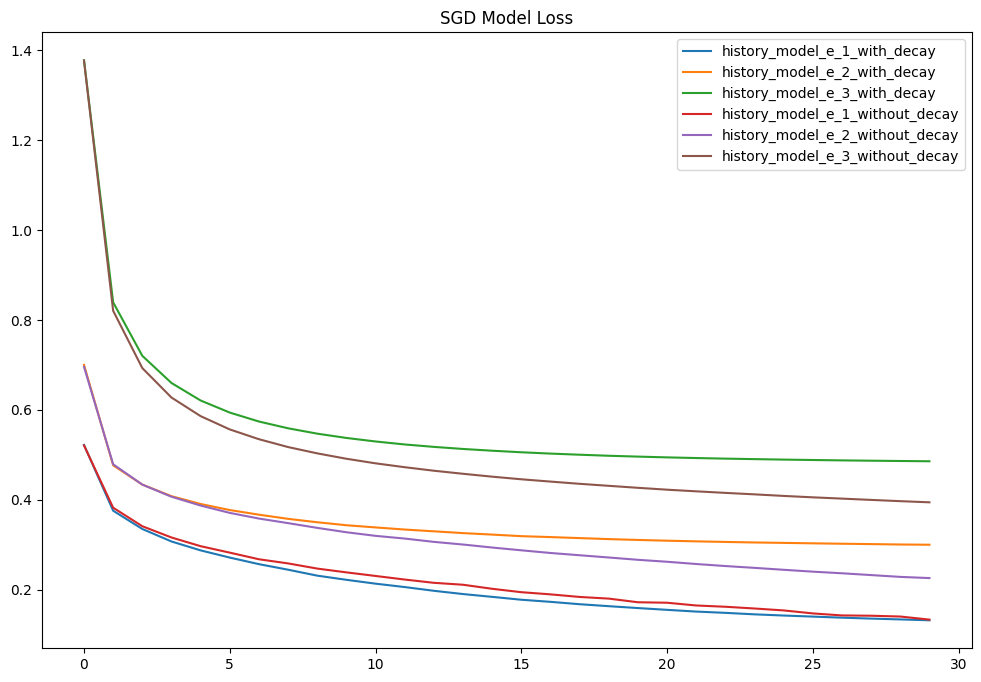

In [80]:
plt.figure(figsize=(12,8))
plt.title("SGD Model Loss")
hist_list_with = [history_model_e_1_SGD_with, history_model_e_2_SGD_with, history_model_e_3_SGD_with]
for k, history in enumerate(hist_list_with):
  plt.plot(history[0], label=f"history_model_e_{k+1}_with_decay")
  plt.legend()
hist_list_without = [history_model_e_1_SGD_without, history_model_e_2_SGD_without, history_model_e_3_SGD_without]
for k, history in enumerate(hist_list_without):
  plt.plot(history[0], label=f"history_model_e_{k+1}_without_decay")
  plt.legend()
plt.show()

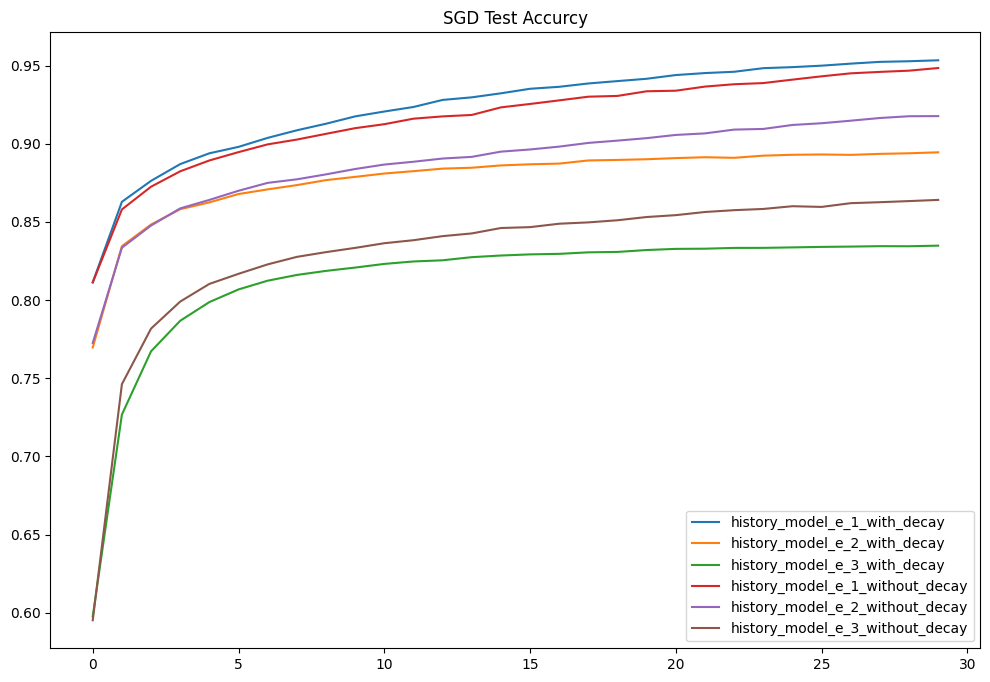

In [81]:
plt.figure(figsize=(12,8))
plt.title("SGD Test Accurcy")
for k, history in enumerate(hist_list_with):
  for i in range(len(history[1])):
    history[1][i] = history[1][i].cpu()
  plt.plot(history[1], label=f"history_model_e_{k+1}_with_decay")
for k, history in enumerate(hist_list_without):
  for i in range(len(history[1])):
    history[1][i] = history[1][i].cpu()
  plt.plot(history[1], label=f"history_model_e_{k+1}_without_decay")
plt.legend()
plt.show()

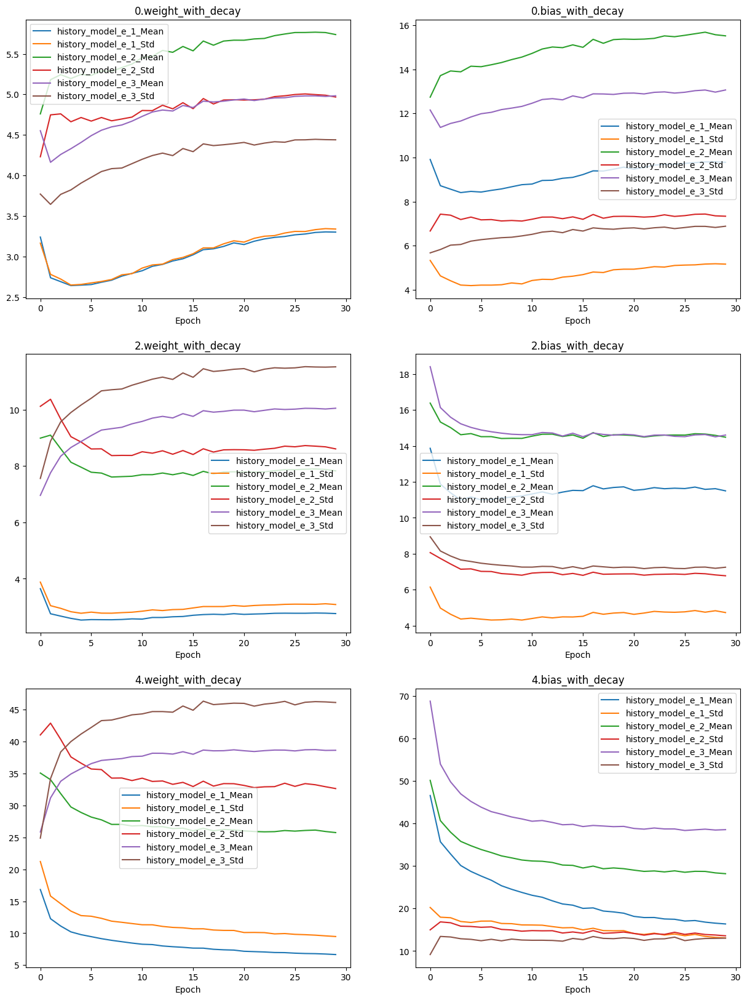

In [82]:
plt.figure(figsize=(15,20))
for k, history in enumerate(hist_list_with):
  for j, name in enumerate(history[2][0]):
    plt.subplot(3,2, 1+j)
    mean = []
    std = []
    for i in range(len(history[2])):
      flatten_tensor = history[2][i][name].detach().cpu().flatten()
      mean.append(flatten_tensor.mean())
      std.append(flatten_tensor.std())

    plt.plot(mean, label=f"history_model_e_{k+1}_Mean")
    plt.plot(std, label=f"history_model_e_{k+1}_Std")

    plt.title(f"{name}_with_decay")
    plt.xlabel("Epoch")
    plt.legend()
plt.show()

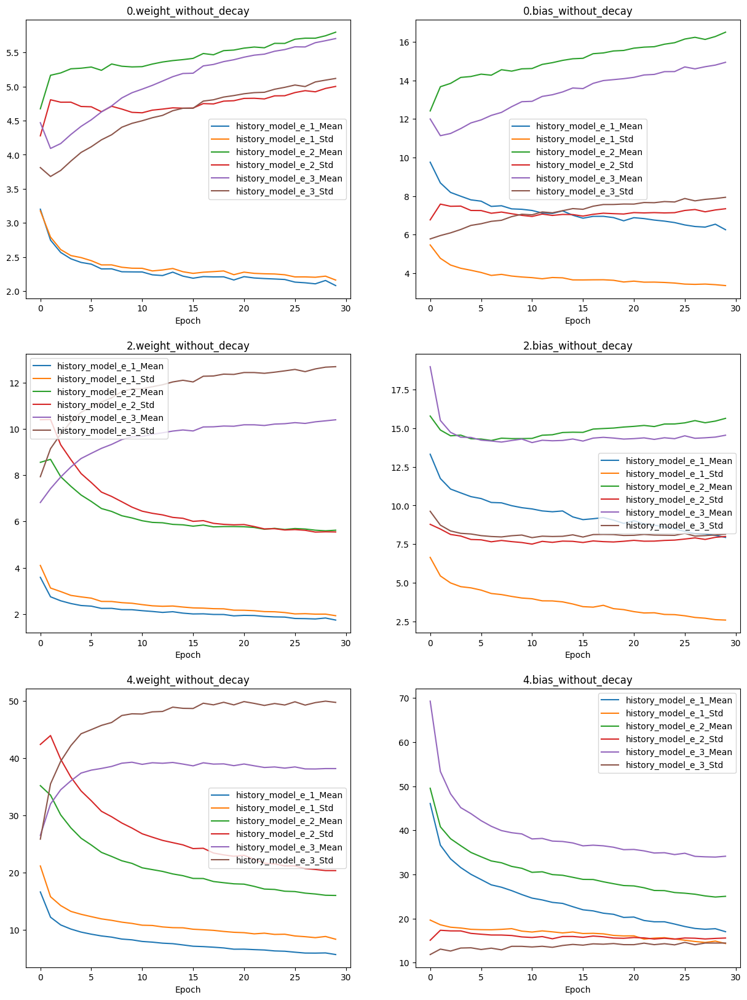

In [83]:
plt.figure(figsize=(15,20))
for k, history in enumerate(hist_list_without):
  for j, name in enumerate(history[2][0]):
    plt.subplot(3,2, 1+j)
    mean = []
    std = []
    for i in range(len(history[2])):
      flatten_tensor = history[2][i][name].detach().cpu().flatten()
      mean.append(flatten_tensor.mean())
      std.append(flatten_tensor.std())

    plt.plot(mean, label=f"history_model_e_{k+1}_Mean")
    plt.plot(std, label=f"history_model_e_{k+1}_Std")

    plt.title(f"{name}_without_decay")
    plt.xlabel("Epoch")
    plt.legend()
plt.show()

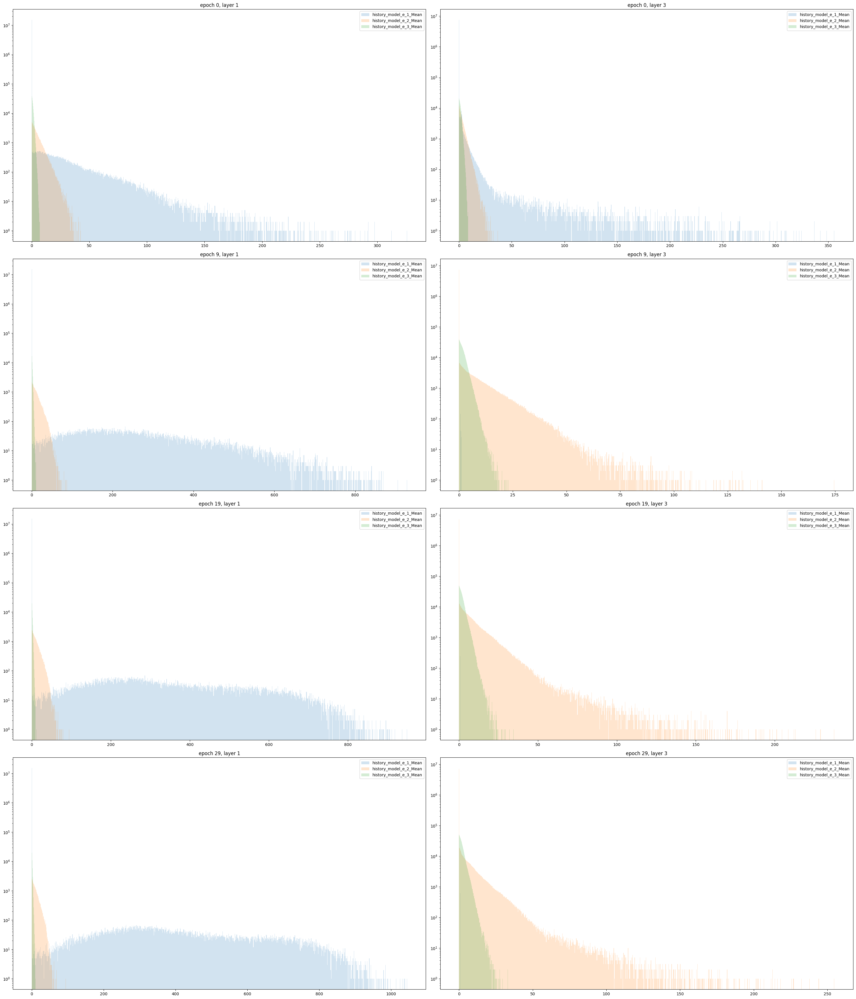

In [128]:
hist_list_with = [history_model_e_1_SGD_with, history_model_e_2_SGD_with, history_model_e_3_SGD_with]
fig, axis = plt.subplots(4, 2, figsize=(30,35))
for q, history in enumerate(hist_list_with):
  for j, i in enumerate([0, 9, 19, 29]):
    for k, name in enumerate(hist_list_with[q][3][0]):
      all_act = torch.cat(
        history[3][i][name]
      )
      axis[j, k].set_yscale("log")
      axis[j, k].set_title(f"epoch {i}, layer {name}")
      axis[j, k].hist(all_act.numpy(), bins=1000, label=f"history_model_e_{q+1}_Mean", alpha = 0.2)
      axis[j, k].legend()
plt.tight_layout()
plt.show()

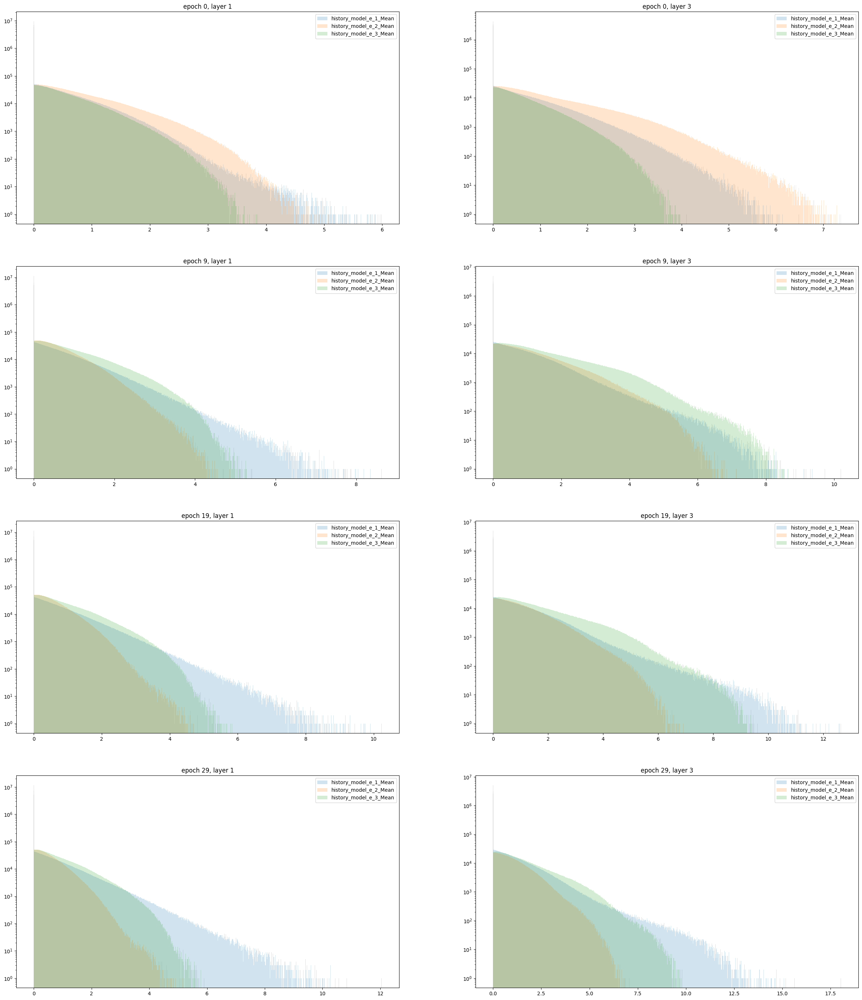

In [133]:
hist_list_without = [history_model_e_1_SGD_without, history_model_e_2_SGD_without, history_model_e_3_SGD_without]
fig, axis = plt.subplots(4, 2, figsize=(30,35))
for q, history in enumerate(hist_list_without):
  for j, i in enumerate([0, 9, 19, 29]):
    for k, name in enumerate(hist_list_with[q][3][0]):
      all_act = torch.cat(
        history[3][i][name]
      )
      axis[j, k].set_yscale("log")
      axis[j, k].set_title(f"epoch {i}, layer {name}")
      axis[j, k].hist(all_act.numpy(), bins=1000, label=f"history_model_e_{q+1}_Mean", alpha = 0.2)
      axis[j, k].legend()
plt.show()
plt.show()

## Momentum

In [86]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_SGD_Momentum(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device,
    isdecay
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate,
      momentum=0.9
  )
  if isdecay:
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
  else :
    scheduler = None
  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              batch_label
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.ReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # scheduler를 이용하여 Lr값 지수 보정
    if scheduler != None:
      scheduler.step()

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [87]:
def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform(m.weight)
        m.bias.data.fill_(0.01)

In [88]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [89]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [90]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_1_SGD_Momentum_with = train_model_SGD_Momentum(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.1, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=True)
history_model_e_1_SGD_Momentum_without = train_model_SGD_Momentum(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.1, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:05<00:00, 373.36it/s]


Epoch 0 Loss : 0.8075654350439703
Epoch 0 accurcy : 0.7003031373023987


100%|██████████| 1875/1875 [00:04<00:00, 446.21it/s]


Epoch 1 Loss : 0.7502893837690351
Epoch 1 accurcy : 0.7128698229789734


100%|██████████| 1875/1875 [00:04<00:00, 453.85it/s]


Epoch 2 Loss : 0.6982949185768758
Epoch 2 accurcy : 0.724453866481781


100%|██████████| 1875/1875 [00:04<00:00, 454.36it/s]


Epoch 3 Loss : 0.6797476752042769
Epoch 3 accurcy : 0.7376856803894043


100%|██████████| 1875/1875 [00:04<00:00, 452.33it/s]


Epoch 4 Loss : 0.6306016841729484
Epoch 4 accurcy : 0.7459698915481567


100%|██████████| 1875/1875 [00:04<00:00, 455.10it/s]


Epoch 5 Loss : 0.57055793225368
Epoch 5 accurcy : 0.7967016100883484


100%|██████████| 1875/1875 [00:04<00:00, 456.49it/s]


Epoch 6 Loss : 0.5295878234704332
Epoch 6 accurcy : 0.8124355673789978


100%|██████████| 1875/1875 [00:04<00:00, 451.52it/s]


Epoch 7 Loss : 0.505039919690291
Epoch 7 accurcy : 0.8203020095825195


100%|██████████| 1875/1875 [00:04<00:00, 456.46it/s]


Epoch 8 Loss : 0.4613558030207954
Epoch 8 accurcy : 0.8358341455459595


100%|██████████| 1875/1875 [00:04<00:00, 383.65it/s]


Epoch 9 Loss : 0.4241461777170506
Epoch 9 accurcy : 0.8498837947845459


100%|██████████| 1875/1875 [00:04<00:00, 451.88it/s]


Epoch 10 Loss : 0.3922796706199658
Epoch 10 accurcy : 0.8599168658256531


100%|██████████| 1875/1875 [00:04<00:00, 449.74it/s]


Epoch 11 Loss : 0.36926452148159433
Epoch 11 accurcy : 0.8646166324615479


100%|██████████| 1875/1875 [00:04<00:00, 446.90it/s]


Epoch 12 Loss : 0.3550393926501275
Epoch 12 accurcy : 0.8703991770744324


100%|██████████| 1875/1875 [00:04<00:00, 447.95it/s]


Epoch 13 Loss : 0.34184746763904944
Epoch 13 accurcy : 0.8736993670463562


100%|██████████| 1875/1875 [00:04<00:00, 454.73it/s]


Epoch 14 Loss : 0.33072289512753467
Epoch 14 accurcy : 0.8774989247322083


100%|██████████| 1875/1875 [00:04<00:00, 448.48it/s]


Epoch 15 Loss : 0.3205357326865195
Epoch 15 accurcy : 0.882232666015625


100%|██████████| 1875/1875 [00:04<00:00, 451.32it/s]


Epoch 16 Loss : 0.31537055835127836
Epoch 16 accurcy : 0.8826325535774231


100%|██████████| 1875/1875 [00:04<00:00, 457.34it/s]


Epoch 17 Loss : 0.3053348357409244
Epoch 17 accurcy : 0.886749267578125


100%|██████████| 1875/1875 [00:04<00:00, 448.48it/s]


Epoch 18 Loss : 0.30100937877893413
Epoch 18 accurcy : 0.8864999413490295


100%|██████████| 1875/1875 [00:04<00:00, 377.09it/s]


Epoch 19 Loss : 0.29380384926994574
Epoch 19 accurcy : 0.8899675607681274


100%|██████████| 1875/1875 [00:04<00:00, 453.40it/s]


Epoch 20 Loss : 0.2899446851213775
Epoch 20 accurcy : 0.8920167088508606


100%|██████████| 1875/1875 [00:04<00:00, 441.82it/s]


Epoch 21 Loss : 0.28404519185920585
Epoch 21 accurcy : 0.8937326073646545


100%|██████████| 1875/1875 [00:04<00:00, 450.46it/s]


Epoch 22 Loss : 0.27951148116389946
Epoch 22 accurcy : 0.8943156599998474


100%|██████████| 1875/1875 [00:04<00:00, 450.87it/s]


Epoch 23 Loss : 0.27509886522293087
Epoch 23 accurcy : 0.8974494338035583


100%|██████████| 1875/1875 [00:04<00:00, 449.09it/s]


Epoch 24 Loss : 0.27135642984608815
Epoch 24 accurcy : 0.897933304309845


100%|██████████| 1875/1875 [00:04<00:00, 449.36it/s]


Epoch 25 Loss : 0.2675363461037483
Epoch 25 accurcy : 0.8997493386268616


100%|██████████| 1875/1875 [00:04<00:00, 448.34it/s]


Epoch 26 Loss : 0.26417241464257235
Epoch 26 accurcy : 0.9009491205215454


100%|██████████| 1875/1875 [00:04<00:00, 457.62it/s]


Epoch 27 Loss : 0.2612088596026106
Epoch 27 accurcy : 0.9029993414878845


100%|██████████| 1875/1875 [00:04<00:00, 453.82it/s]


Epoch 28 Loss : 0.2581186542292436
Epoch 28 accurcy : 0.9035667181015015


100%|██████████| 1875/1875 [00:05<00:00, 370.73it/s]


Epoch 29 Loss : 0.25561195803284653
Epoch 29 accurcy : 0.9044321775436401


100%|██████████| 1875/1875 [00:04<00:00, 378.90it/s]


Epoch 0 Loss : 0.7827669223626454
Epoch 0 accurcy : 0.7074031829833984


100%|██████████| 1875/1875 [00:04<00:00, 432.80it/s]


Epoch 1 Loss : 0.782986805645624
Epoch 1 accurcy : 0.7019031047821045


100%|██████████| 1875/1875 [00:04<00:00, 440.73it/s]


Epoch 2 Loss : 0.9351954896450035
Epoch 2 accurcy : 0.6561031937599182


100%|██████████| 1875/1875 [00:04<00:00, 449.33it/s]


Epoch 3 Loss : 0.9291695221900942
Epoch 3 accurcy : 0.6772193908691406


100%|██████████| 1875/1875 [00:04<00:00, 440.53it/s]


Epoch 4 Loss : 1.3886646717389444
Epoch 4 accurcy : 0.4787495732307434


100%|██████████| 1875/1875 [00:04<00:00, 443.85it/s]


Epoch 5 Loss : 1.4322836999893154
Epoch 5 accurcy : 0.4028327167034149


100%|██████████| 1875/1875 [00:04<00:00, 447.50it/s]


Epoch 6 Loss : 1.698294274552663
Epoch 6 accurcy : 0.3263166844844818


100%|██████████| 1875/1875 [00:04<00:00, 440.62it/s]


Epoch 7 Loss : 1.2817275133132953
Epoch 7 accurcy : 0.44408416748046875


100%|██████████| 1875/1875 [00:04<00:00, 449.91it/s]


Epoch 8 Loss : 1.5394453097979233
Epoch 8 accurcy : 0.3770161271095276


100%|██████████| 1875/1875 [00:05<00:00, 370.89it/s]


Epoch 9 Loss : 1.7982758218129484
Epoch 9 accurcy : 0.2929999530315399


100%|██████████| 1875/1875 [00:04<00:00, 437.11it/s]


Epoch 10 Loss : 1.6658456823666883
Epoch 10 accurcy : 0.3144169747829437


100%|██████████| 1875/1875 [00:04<00:00, 447.96it/s]


Epoch 11 Loss : 1.7296578889211014
Epoch 11 accurcy : 0.26978281140327454


100%|██████████| 1875/1875 [00:04<00:00, 441.64it/s]


Epoch 12 Loss : 1.6476489754676813
Epoch 12 accurcy : 0.3039499521255493


100%|██████████| 1875/1875 [00:04<00:00, 445.17it/s]


Epoch 13 Loss : 1.7015450378417942
Epoch 13 accurcy : 0.2800998091697693


100%|██████████| 1875/1875 [00:04<00:00, 443.08it/s]


Epoch 14 Loss : 1.8222574267705316
Epoch 14 accurcy : 0.23764944076538086


100%|██████████| 1875/1875 [00:04<00:00, 440.03it/s]


Epoch 15 Loss : 1.7112214971542405
Epoch 15 accurcy : 0.26486629247665405


100%|██████████| 1875/1875 [00:04<00:00, 448.45it/s]


Epoch 16 Loss : 1.7688713006337498
Epoch 16 accurcy : 0.2703319489955902


100%|██████████| 1875/1875 [00:04<00:00, 449.65it/s]


Epoch 17 Loss : 2.0088270621617634
Epoch 17 accurcy : 0.20879913866519928


100%|██████████| 1875/1875 [00:04<00:00, 440.91it/s]


Epoch 18 Loss : 2.173566911188765
Epoch 18 accurcy : 0.15973295271396637


100%|██████████| 1875/1875 [00:05<00:00, 373.16it/s]


Epoch 19 Loss : 2.226291197840373
Epoch 19 accurcy : 0.13503427803516388


100%|██████████| 1875/1875 [00:04<00:00, 444.23it/s]


Epoch 20 Loss : 2.2434145531336482
Epoch 20 accurcy : 0.13425099849700928


100%|██████████| 1875/1875 [00:04<00:00, 442.49it/s]


Epoch 21 Loss : 2.0433902778625477
Epoch 21 accurcy : 0.19828391075134277


100%|██████████| 1875/1875 [00:04<00:00, 443.10it/s]


Epoch 22 Loss : 2.1312898097991946
Epoch 22 accurcy : 0.1727330982685089


100%|██████████| 1875/1875 [00:04<00:00, 438.98it/s]


Epoch 23 Loss : 2.2863841726938916
Epoch 23 accurcy : 0.11250127851963043


100%|██████████| 1875/1875 [00:04<00:00, 448.07it/s]


Epoch 24 Loss : 2.2932679462432906
Epoch 24 accurcy : 0.10835127532482147


100%|██████████| 1875/1875 [00:04<00:00, 439.75it/s]


Epoch 25 Loss : 2.3090366675059
Epoch 25 accurcy : 0.10110113024711609


100%|██████████| 1875/1875 [00:04<00:00, 434.72it/s]


Epoch 26 Loss : 2.283620973205564
Epoch 26 accurcy : 0.11578468978404999


100%|██████████| 1875/1875 [00:04<00:00, 444.32it/s]


Epoch 27 Loss : 2.337508209164942
Epoch 27 accurcy : 0.1287512481212616


100%|██████████| 1875/1875 [00:04<00:00, 447.41it/s]


Epoch 28 Loss : 2.302105205345151
Epoch 28 accurcy : 0.10455120354890823


100%|██████████| 1875/1875 [00:05<00:00, 372.07it/s]

Epoch 29 Loss : 2.3090972899119055
Epoch 29 accurcy : 0.10080112516880035


In [91]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [92]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [93]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_2_SGD_Momentum_with = train_model_SGD_Momentum(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=True)
history_model_e_2_SGD_Momentum_without = train_model_SGD_Momentum(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:05<00:00, 315.46it/s]


Epoch 0 Loss : 0.5124717710971843
Epoch 0 accurcy : 0.8160349130630493


100%|██████████| 1875/1875 [00:04<00:00, 442.51it/s]


Epoch 1 Loss : 0.3727029761155445
Epoch 1 accurcy : 0.8636499643325806


100%|██████████| 1875/1875 [00:04<00:00, 448.80it/s]


Epoch 2 Loss : 0.3344965948859852
Epoch 2 accurcy : 0.8759333491325378


100%|██████████| 1875/1875 [00:04<00:00, 443.14it/s]


Epoch 3 Loss : 0.3069875906685986
Epoch 3 accurcy : 0.8864490985870361


100%|██████████| 1875/1875 [00:04<00:00, 431.88it/s]


Epoch 4 Loss : 0.284863987318675
Epoch 4 accurcy : 0.8945162892341614


100%|██████████| 1875/1875 [00:04<00:00, 432.34it/s]


Epoch 5 Loss : 0.26977947457432755
Epoch 5 accurcy : 0.8998162746429443


100%|██████████| 1875/1875 [00:04<00:00, 439.04it/s]


Epoch 6 Loss : 0.25623144546151155
Epoch 6 accurcy : 0.9049499034881592


100%|██████████| 1875/1875 [00:04<00:00, 445.62it/s]


Epoch 7 Loss : 0.24259827753007351
Epoch 7 accurcy : 0.9090984463691711


100%|██████████| 1875/1875 [00:04<00:00, 447.04it/s]


Epoch 8 Loss : 0.23244957114954803
Epoch 8 accurcy : 0.9135327935218811


100%|██████████| 1875/1875 [00:05<00:00, 373.02it/s]


Epoch 9 Loss : 0.22170456674993036
Epoch 9 accurcy : 0.9175487756729126


100%|██████████| 1875/1875 [00:04<00:00, 442.13it/s]


Epoch 10 Loss : 0.21346366225481053
Epoch 10 accurcy : 0.9203824400901794


100%|██████████| 1875/1875 [00:04<00:00, 446.43it/s]


Epoch 11 Loss : 0.20347602965732375
Epoch 11 accurcy : 0.9241502285003662


100%|██████████| 1875/1875 [00:04<00:00, 440.08it/s]


Epoch 12 Loss : 0.19639159126182418
Epoch 12 accurcy : 0.9268991947174072


100%|██████████| 1875/1875 [00:04<00:00, 442.98it/s]


Epoch 13 Loss : 0.1904362236564361
Epoch 13 accurcy : 0.9295675754547119


100%|██████████| 1875/1875 [00:04<00:00, 435.74it/s]


Epoch 14 Loss : 0.183850126093129
Epoch 14 accurcy : 0.9316664934158325


100%|██████████| 1875/1875 [00:04<00:00, 440.61it/s]


Epoch 15 Loss : 0.17695744400918498
Epoch 15 accurcy : 0.9347837567329407


100%|██████████| 1875/1875 [00:04<00:00, 432.28it/s]


Epoch 16 Loss : 0.17223449918329722
Epoch 16 accurcy : 0.9370488524436951


100%|██████████| 1875/1875 [00:04<00:00, 439.92it/s]


Epoch 17 Loss : 0.16697212127745123
Epoch 17 accurcy : 0.9384496808052063


100%|██████████| 1875/1875 [00:04<00:00, 440.13it/s]


Epoch 18 Loss : 0.16280549994558102
Epoch 18 accurcy : 0.9404342770576477


100%|██████████| 1875/1875 [00:05<00:00, 363.99it/s]


Epoch 19 Loss : 0.15839636875887703
Epoch 19 accurcy : 0.9423996210098267


100%|██████████| 1875/1875 [00:04<00:00, 435.14it/s]


Epoch 20 Loss : 0.15465211316843863
Epoch 20 accurcy : 0.9444500207901001


100%|██████████| 1875/1875 [00:04<00:00, 441.31it/s]


Epoch 21 Loss : 0.1503086974158882
Epoch 21 accurcy : 0.9466834664344788


100%|██████████| 1875/1875 [00:04<00:00, 436.36it/s]


Epoch 22 Loss : 0.1479233202189208
Epoch 22 accurcy : 0.9470332264900208


100%|██████████| 1875/1875 [00:04<00:00, 400.39it/s]


Epoch 23 Loss : 0.14454208257794388
Epoch 23 accurcy : 0.9480006098747253


100%|██████████| 1875/1875 [00:04<00:00, 433.44it/s]


Epoch 24 Loss : 0.14189051946103556
Epoch 24 accurcy : 0.9496164321899414


100%|██████████| 1875/1875 [00:04<00:00, 427.90it/s]


Epoch 25 Loss : 0.1389940816238525
Epoch 25 accurcy : 0.9507176280021667


100%|██████████| 1875/1875 [00:04<00:00, 424.85it/s]


Epoch 26 Loss : 0.13700727697362525
Epoch 26 accurcy : 0.9513005018234253


100%|██████████| 1875/1875 [00:04<00:00, 407.35it/s]


Epoch 27 Loss : 0.13484559818158534
Epoch 27 accurcy : 0.9524503946304321


100%|██████████| 1875/1875 [00:04<00:00, 418.74it/s]


Epoch 28 Loss : 0.13302504559556635
Epoch 28 accurcy : 0.952867329120636


100%|██████████| 1875/1875 [00:05<00:00, 354.20it/s]


Epoch 29 Loss : 0.13113083377281828
Epoch 29 accurcy : 0.95416659116745


100%|██████████| 1875/1875 [00:05<00:00, 354.90it/s]


Epoch 0 Loss : 0.5120415978670122
Epoch 0 accurcy : 0.8173334002494812


100%|██████████| 1875/1875 [00:04<00:00, 432.63it/s]


Epoch 1 Loss : 0.37673188735643964
Epoch 1 accurcy : 0.862216591835022


100%|██████████| 1875/1875 [00:04<00:00, 420.29it/s]


Epoch 2 Loss : 0.3404286863307149
Epoch 2 accurcy : 0.8736493587493896


100%|██████████| 1875/1875 [00:04<00:00, 428.50it/s]


Epoch 3 Loss : 0.31696010265549035
Epoch 3 accurcy : 0.8822166919708252


100%|██████████| 1875/1875 [00:04<00:00, 437.00it/s]


Epoch 4 Loss : 0.2978703944663203
Epoch 4 accurcy : 0.888532280921936


100%|██████████| 1875/1875 [00:04<00:00, 407.96it/s]


Epoch 5 Loss : 0.2834907318552331
Epoch 5 accurcy : 0.8947994112968445


100%|██████████| 1875/1875 [00:04<00:00, 426.26it/s]


Epoch 6 Loss : 0.2688396913836406
Epoch 6 accurcy : 0.8984161019325256


100%|██████████| 1875/1875 [00:04<00:00, 434.03it/s]


Epoch 7 Loss : 0.25844862617254244
Epoch 7 accurcy : 0.902399480342865


100%|██████████| 1875/1875 [00:04<00:00, 428.30it/s]


Epoch 8 Loss : 0.24946000399986862
Epoch 8 accurcy : 0.9054335951805115


100%|██████████| 1875/1875 [00:05<00:00, 360.61it/s]


Epoch 9 Loss : 0.2414206850528715
Epoch 9 accurcy : 0.9085328578948975


100%|██████████| 1875/1875 [00:04<00:00, 430.73it/s]


Epoch 10 Loss : 0.22978234492341684
Epoch 10 accurcy : 0.9127996563911438


100%|██████████| 1875/1875 [00:04<00:00, 434.46it/s]


Epoch 11 Loss : 0.22421514033377177
Epoch 11 accurcy : 0.914650559425354


100%|██████████| 1875/1875 [00:04<00:00, 427.12it/s]


Epoch 12 Loss : 0.21798042631198986
Epoch 12 accurcy : 0.9166485667228699


100%|██████████| 1875/1875 [00:04<00:00, 420.37it/s]


Epoch 13 Loss : 0.2129687883754573
Epoch 13 accurcy : 0.9183669090270996


100%|██████████| 1875/1875 [00:04<00:00, 433.71it/s]


Epoch 14 Loss : 0.20452257213691868
Epoch 14 accurcy : 0.9215835332870483


100%|██████████| 1875/1875 [00:04<00:00, 432.80it/s]


Epoch 15 Loss : 0.19778430614372114
Epoch 15 accurcy : 0.9244164228439331


100%|██████████| 1875/1875 [00:04<00:00, 427.52it/s]


Epoch 16 Loss : 0.19247592308868977
Epoch 16 accurcy : 0.926349937915802


100%|██████████| 1875/1875 [00:04<00:00, 434.14it/s]


Epoch 17 Loss : 0.18687779607797675
Epoch 17 accurcy : 0.9286156296730042


100%|██████████| 1875/1875 [00:04<00:00, 431.98it/s]


Epoch 18 Loss : 0.18152591713964913
Epoch 18 accurcy : 0.9306665062904358


100%|██████████| 1875/1875 [00:05<00:00, 352.85it/s]


Epoch 19 Loss : 0.17737335965434714
Epoch 19 accurcy : 0.9315332770347595


100%|██████████| 1875/1875 [00:04<00:00, 432.48it/s]


Epoch 20 Loss : 0.17078533388127884
Epoch 20 accurcy : 0.9341498017311096


100%|██████████| 1875/1875 [00:04<00:00, 423.28it/s]


Epoch 21 Loss : 0.1678620451773205
Epoch 21 accurcy : 0.9350162148475647


100%|██████████| 1875/1875 [00:04<00:00, 417.65it/s]


Epoch 22 Loss : 0.162510162558655
Epoch 22 accurcy : 0.9379503726959229


100%|██████████| 1875/1875 [00:04<00:00, 427.47it/s]


Epoch 23 Loss : 0.16034900110562625
Epoch 23 accurcy : 0.9388167858123779


100%|██████████| 1875/1875 [00:04<00:00, 427.96it/s]


Epoch 24 Loss : 0.15523465540930623
Epoch 24 accurcy : 0.9413334727287292


100%|██████████| 1875/1875 [00:04<00:00, 429.17it/s]


Epoch 25 Loss : 0.14995320477237317
Epoch 25 accurcy : 0.9430000185966492


100%|██████████| 1875/1875 [00:04<00:00, 426.89it/s]


Epoch 26 Loss : 0.14878996976887202
Epoch 26 accurcy : 0.9432496428489685


100%|██████████| 1875/1875 [00:04<00:00, 430.57it/s]


Epoch 27 Loss : 0.14635012721717364
Epoch 27 accurcy : 0.9440671801567078


100%|██████████| 1875/1875 [00:04<00:00, 431.53it/s]


Epoch 28 Loss : 0.13953344111852345
Epoch 28 accurcy : 0.9460331797599792


100%|██████████| 1875/1875 [00:05<00:00, 349.08it/s]

Epoch 29 Loss : 0.13680954267382625
Epoch 29 accurcy : 0.9466503858566284


In [94]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [95]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [96]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_3_SGD_Momentum_with = train_model_SGD_Momentum(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.001, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=True)
history_model_e_3_SGD_Momentum_without = train_model_SGD_Momentum(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.001, loss=loss, base_optimizer=torch.optim.SGD, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:05<00:00, 357.39it/s]


Epoch 0 Loss : 0.7081553160985329
Epoch 0 accurcy : 0.7660691142082214


100%|██████████| 1875/1875 [00:04<00:00, 433.07it/s]


Epoch 1 Loss : 0.4744246239264805
Epoch 1 accurcy : 0.8348004221916199


100%|██████████| 1875/1875 [00:04<00:00, 427.65it/s]


Epoch 2 Loss : 0.4327869566678999
Epoch 2 accurcy : 0.8494331240653992


100%|██████████| 1875/1875 [00:04<00:00, 423.73it/s]


Epoch 3 Loss : 0.40768006970087645
Epoch 3 accurcy : 0.8578835129737854


100%|██████████| 1875/1875 [00:04<00:00, 425.43it/s]


Epoch 4 Loss : 0.3888330463210746
Epoch 4 accurcy : 0.864216685295105


100%|██████████| 1875/1875 [00:04<00:00, 429.80it/s]


Epoch 5 Loss : 0.3775572999795281
Epoch 5 accurcy : 0.8672666549682617


100%|██████████| 1875/1875 [00:04<00:00, 431.08it/s]


Epoch 6 Loss : 0.36671222604115855
Epoch 6 accurcy : 0.8717997670173645


100%|██████████| 1875/1875 [00:04<00:00, 422.34it/s]


Epoch 7 Loss : 0.35780723814169524
Epoch 7 accurcy : 0.8743664026260376


100%|██████████| 1875/1875 [00:04<00:00, 426.40it/s]


Epoch 8 Loss : 0.3505475151141489
Epoch 8 accurcy : 0.876216471195221


100%|██████████| 1875/1875 [00:05<00:00, 361.64it/s]


Epoch 9 Loss : 0.3433799077908195
Epoch 9 accurcy : 0.8786828517913818


100%|██████████| 1875/1875 [00:04<00:00, 442.00it/s]


Epoch 10 Loss : 0.3386958503921829
Epoch 10 accurcy : 0.8812985420227051


100%|██████████| 1875/1875 [00:04<00:00, 437.74it/s]


Epoch 11 Loss : 0.33374296374320994
Epoch 11 accurcy : 0.8828326463699341


100%|██████████| 1875/1875 [00:04<00:00, 438.90it/s]


Epoch 12 Loss : 0.329568434826533
Epoch 12 accurcy : 0.8841158747673035


100%|██████████| 1875/1875 [00:04<00:00, 438.31it/s]


Epoch 13 Loss : 0.3263105186899508
Epoch 13 accurcy : 0.8845990300178528


100%|██████████| 1875/1875 [00:04<00:00, 440.90it/s]


Epoch 14 Loss : 0.3228343713124593
Epoch 14 accurcy : 0.8857492208480835


100%|██████████| 1875/1875 [00:04<00:00, 432.77it/s]


Epoch 15 Loss : 0.3194508190075558
Epoch 15 accurcy : 0.8877319097518921


100%|██████████| 1875/1875 [00:04<00:00, 438.82it/s]


Epoch 16 Loss : 0.3172609550913173
Epoch 16 accurcy : 0.8880338072776794


100%|██████████| 1875/1875 [00:04<00:00, 436.48it/s]


Epoch 17 Loss : 0.31475718801816294
Epoch 17 accurcy : 0.8892310857772827


100%|██████████| 1875/1875 [00:04<00:00, 423.34it/s]


Epoch 18 Loss : 0.312931785253684
Epoch 18 accurcy : 0.8895320892333984


100%|██████████| 1875/1875 [00:05<00:00, 364.55it/s]


Epoch 19 Loss : 0.31051590654849975
Epoch 19 accurcy : 0.8901327252388


100%|██████████| 1875/1875 [00:04<00:00, 436.58it/s]


Epoch 20 Loss : 0.30903596913814574
Epoch 20 accurcy : 0.8911335468292236


100%|██████████| 1875/1875 [00:04<00:00, 435.89it/s]


Epoch 21 Loss : 0.3077273889402549
Epoch 21 accurcy : 0.8922834396362305


100%|██████████| 1875/1875 [00:04<00:00, 428.12it/s]


Epoch 22 Loss : 0.3064986620068552
Epoch 22 accurcy : 0.891782283782959


100%|██████████| 1875/1875 [00:04<00:00, 436.16it/s]


Epoch 23 Loss : 0.3053414733747642
Epoch 23 accurcy : 0.8924493789672852


100%|██████████| 1875/1875 [00:04<00:00, 443.21it/s]


Epoch 24 Loss : 0.30421238367954967
Epoch 24 accurcy : 0.8931155204772949


100%|██████████| 1875/1875 [00:04<00:00, 439.98it/s]


Epoch 25 Loss : 0.3033509467283883
Epoch 25 accurcy : 0.8933000564575195


100%|██████████| 1875/1875 [00:04<00:00, 431.90it/s]


Epoch 26 Loss : 0.3023693309823667
Epoch 26 accurcy : 0.8934489488601685


100%|██████████| 1875/1875 [00:04<00:00, 440.11it/s]


Epoch 27 Loss : 0.3016349995036924
Epoch 27 accurcy : 0.8938162922859192


100%|██████████| 1875/1875 [00:04<00:00, 436.13it/s]


Epoch 28 Loss : 0.300761082667113
Epoch 28 accurcy : 0.8939155340194702


100%|██████████| 1875/1875 [00:05<00:00, 369.71it/s]


Epoch 29 Loss : 0.3002322923024489
Epoch 29 accurcy : 0.8946654200553894


100%|██████████| 1875/1875 [00:05<00:00, 369.34it/s]


Epoch 0 Loss : 0.7026319893280667
Epoch 0 accurcy : 0.7690850496292114


100%|██████████| 1875/1875 [00:04<00:00, 431.76it/s]


Epoch 1 Loss : 0.4745184432347612
Epoch 1 accurcy : 0.8352342247962952


100%|██████████| 1875/1875 [00:04<00:00, 441.48it/s]


Epoch 2 Loss : 0.4320750351071352
Epoch 2 accurcy : 0.8490832448005676


100%|██████████| 1875/1875 [00:04<00:00, 442.43it/s]


Epoch 3 Loss : 0.404419938556353
Epoch 3 accurcy : 0.8592662811279297


100%|██████████| 1875/1875 [00:04<00:00, 441.13it/s]


Epoch 4 Loss : 0.38498504620393087
Epoch 4 accurcy : 0.8656497597694397


100%|██████████| 1875/1875 [00:04<00:00, 445.09it/s]


Epoch 5 Loss : 0.37134186190764107
Epoch 5 accurcy : 0.8701335191726685


100%|██████████| 1875/1875 [00:04<00:00, 439.34it/s]


Epoch 6 Loss : 0.3567304394284878
Epoch 6 accurcy : 0.8747501373291016


100%|██████████| 1875/1875 [00:04<00:00, 447.07it/s]


Epoch 7 Loss : 0.3468137546837333
Epoch 7 accurcy : 0.8775503039360046


100%|██████████| 1875/1875 [00:04<00:00, 441.53it/s]


Epoch 8 Loss : 0.3364214180509249
Epoch 8 accurcy : 0.8813161253929138


100%|██████████| 1875/1875 [00:05<00:00, 365.44it/s]


Epoch 9 Loss : 0.3282148119330405
Epoch 9 accurcy : 0.883649468421936


100%|██████████| 1875/1875 [00:04<00:00, 442.15it/s]


Epoch 10 Loss : 0.31907533041238845
Epoch 10 accurcy : 0.8862331509590149


100%|██████████| 1875/1875 [00:04<00:00, 441.48it/s]


Epoch 11 Loss : 0.31296517516374556
Epoch 11 accurcy : 0.8873497247695923


100%|██████████| 1875/1875 [00:04<00:00, 426.01it/s]


Epoch 12 Loss : 0.30538916013240797
Epoch 12 accurcy : 0.8901495933532715


100%|██████████| 1875/1875 [00:04<00:00, 440.12it/s]


Epoch 13 Loss : 0.2984067003508412
Epoch 13 accurcy : 0.8926831483840942


100%|██████████| 1875/1875 [00:04<00:00, 440.99it/s]


Epoch 14 Loss : 0.2922063631633917
Epoch 14 accurcy : 0.89613276720047


100%|██████████| 1875/1875 [00:04<00:00, 439.67it/s]


Epoch 15 Loss : 0.2866092445135114
Epoch 15 accurcy : 0.8972505331039429


100%|██████████| 1875/1875 [00:04<00:00, 437.71it/s]


Epoch 16 Loss : 0.2811050788303217
Epoch 16 accurcy : 0.8978154063224792


100%|██████████| 1875/1875 [00:04<00:00, 439.24it/s]


Epoch 17 Loss : 0.27504216975967083
Epoch 17 accurcy : 0.9012001156806946


100%|██████████| 1875/1875 [00:04<00:00, 437.20it/s]


Epoch 18 Loss : 0.2709651829024161
Epoch 18 accurcy : 0.9024317264556885


100%|██████████| 1875/1875 [00:05<00:00, 366.25it/s]


Epoch 19 Loss : 0.26607584862907785
Epoch 19 accurcy : 0.9034496545791626


100%|██████████| 1875/1875 [00:04<00:00, 438.24it/s]


Epoch 20 Loss : 0.2601990292131897
Epoch 20 accurcy : 0.9067160487174988


100%|██████████| 1875/1875 [00:04<00:00, 440.41it/s]


Epoch 21 Loss : 0.2561914034108324
Epoch 21 accurcy : 0.9069495797157288


100%|██████████| 1875/1875 [00:04<00:00, 431.98it/s]


Epoch 22 Loss : 0.25142274589836583
Epoch 22 accurcy : 0.9096662402153015


100%|██████████| 1875/1875 [00:04<00:00, 439.58it/s]


Epoch 23 Loss : 0.247053610125184
Epoch 23 accurcy : 0.9107495546340942


100%|██████████| 1875/1875 [00:04<00:00, 440.71it/s]


Epoch 24 Loss : 0.24269496637284763
Epoch 24 accurcy : 0.9128664135932922


100%|██████████| 1875/1875 [00:04<00:00, 429.39it/s]


Epoch 25 Loss : 0.23726092715263383
Epoch 25 accurcy : 0.9146996736526489


100%|██████████| 1875/1875 [00:04<00:00, 435.06it/s]


Epoch 26 Loss : 0.23422446134487757
Epoch 26 accurcy : 0.9153668880462646


100%|██████████| 1875/1875 [00:04<00:00, 436.47it/s]


Epoch 27 Loss : 0.23146882504125402
Epoch 27 accurcy : 0.9167492389678955


100%|██████████| 1875/1875 [00:04<00:00, 428.87it/s]


Epoch 28 Loss : 0.22701140043834844
Epoch 28 accurcy : 0.9179657697677612


100%|██████████| 1875/1875 [00:05<00:00, 368.31it/s]


Epoch 29 Loss : 0.22291874358455377
Epoch 29 accurcy : 0.9197655916213989


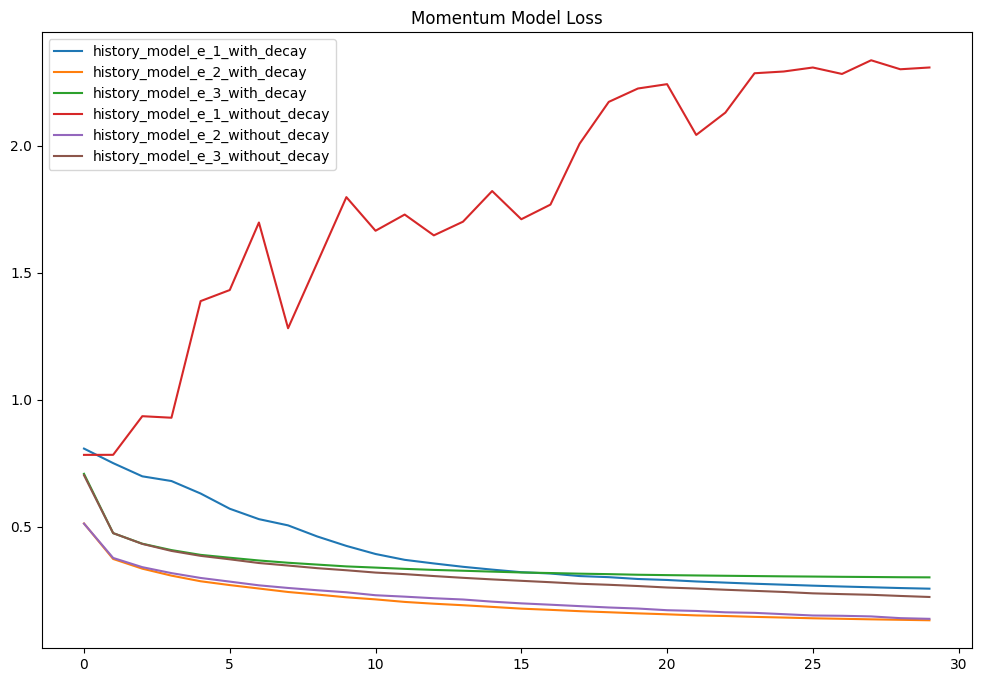

In [97]:
plt.figure(figsize=(12,8))
plt.title("Momentum Model Loss")
hist_list_with = [history_model_e_1_SGD_Momentum_with, history_model_e_2_SGD_Momentum_with, history_model_e_3_SGD_Momentum_with]
for k, history in enumerate(hist_list_with):
  plt.plot(history[0], label=f"history_model_e_{k+1}_with_decay")
  plt.legend()
hist_list_without = [history_model_e_1_SGD_Momentum_without, history_model_e_2_SGD_Momentum_without, history_model_e_3_SGD_Momentum_without]
for k, history in enumerate(hist_list_without):
  plt.plot(history[0], label=f"history_model_e_{k+1}_without_decay")
  plt.legend()
plt.show()

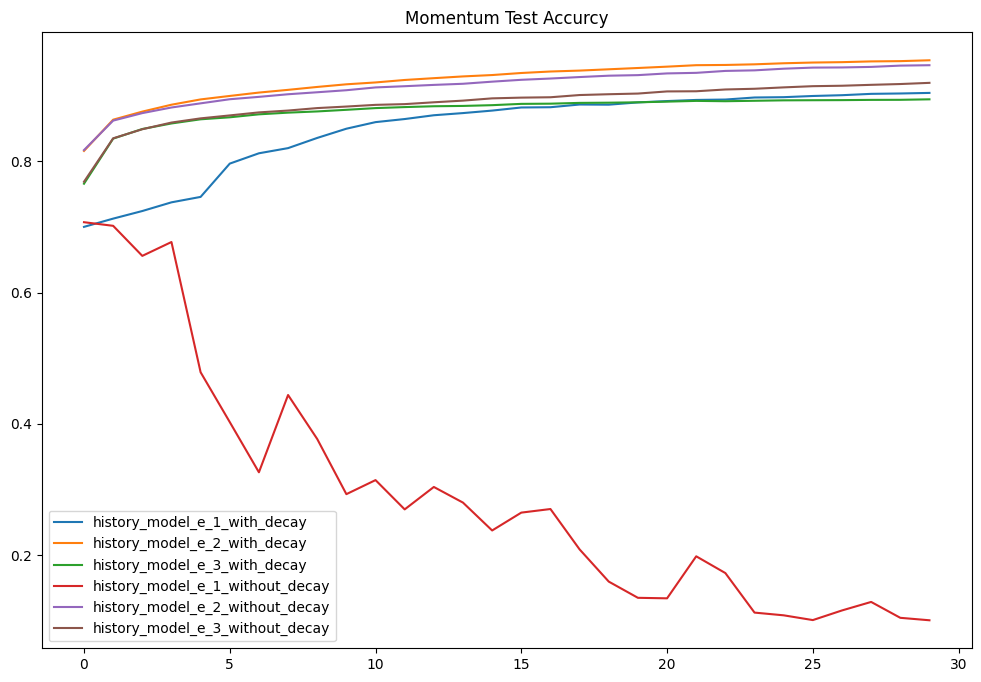

In [98]:
plt.figure(figsize=(12,8))
plt.title("Momentum Test Accurcy")
for k, history in enumerate(hist_list_with):
  for i in range(len(history[1])):
    history[1][i] = history[1][i].cpu()
  plt.plot(history[1], label=f"history_model_e_{k+1}_with_decay")
for k, history in enumerate(hist_list_without):
  for i in range(len(history[1])):
    history[1][i] = history[1][i].cpu()
  plt.plot(history[1], label=f"history_model_e_{k+1}_without_decay")
plt.legend()
plt.show()

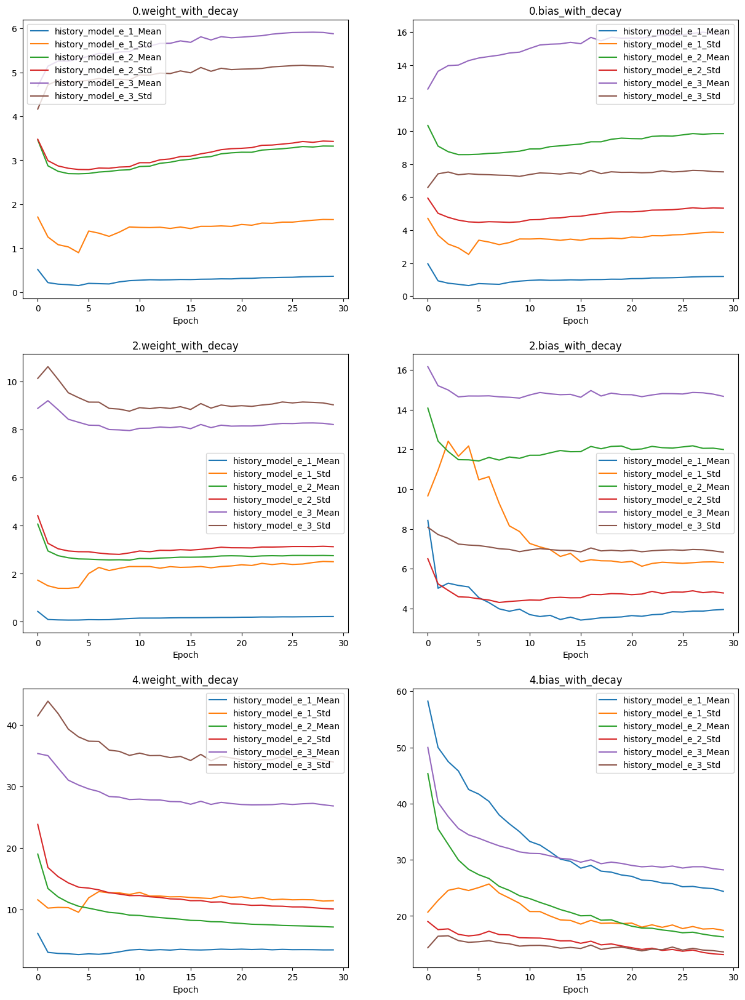

In [99]:
plt.figure(figsize=(15,20))
for k, history in enumerate(hist_list_with):
  for j, name in enumerate(history[2][0]):
    plt.subplot(3,2, 1+j)
    mean = []
    std = []
    for i in range(len(history[2])):
      flatten_tensor = history[2][i][name].detach().cpu().flatten()
      mean.append(flatten_tensor.mean())
      std.append(flatten_tensor.std())

    plt.plot(mean, label=f"history_model_e_{k+1}_Mean")
    plt.plot(std, label=f"history_model_e_{k+1}_Std")

    plt.title(f"{name}_with_decay")
    plt.xlabel("Epoch")
    plt.legend()
plt.show()

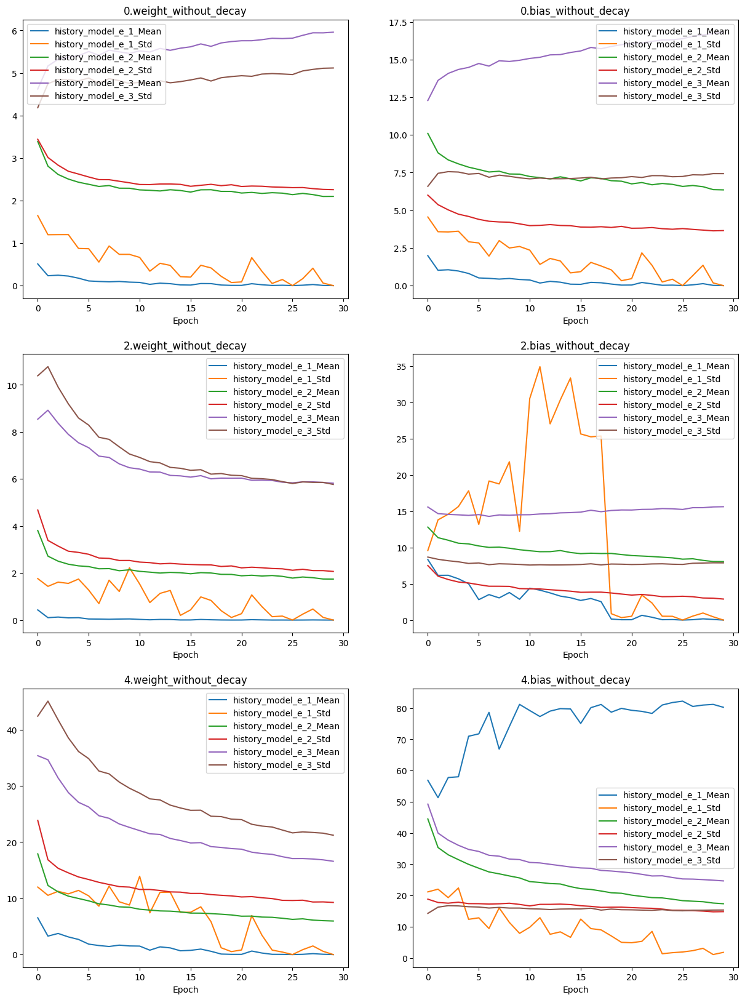

In [100]:
plt.figure(figsize=(15,20))
for k, history in enumerate(hist_list_without):
  for j, name in enumerate(history[2][0]):
    plt.subplot(3,2, 1+j)
    mean = []
    std = []
    for i in range(len(history[2])):
      flatten_tensor = history[2][i][name].detach().cpu().flatten()
      mean.append(flatten_tensor.mean())
      std.append(flatten_tensor.std())

    plt.plot(mean, label=f"history_model_e_{k+1}_Mean")
    plt.plot(std, label=f"history_model_e_{k+1}_Std")

    plt.title(f"{name}_without_decay")
    plt.xlabel("Epoch")
    plt.legend()
plt.show()

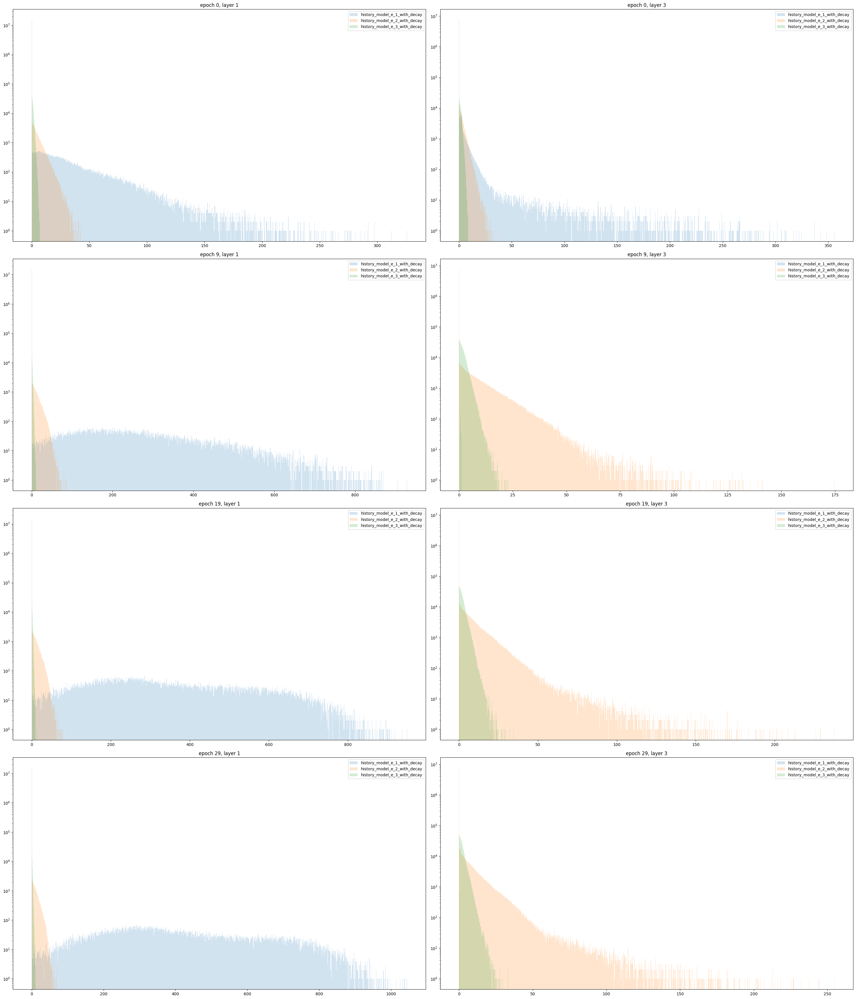

In [129]:
hist_list_with = [history_model_e_1_SGD_Momentum_with, history_model_e_2_SGD_Momentum_with, history_model_e_3_SGD_Momentum_with]
fig, axis = plt.subplots(4, 2, figsize=(30,35))
for q, history in enumerate(hist_list_with):
  for j, i in enumerate([0, 9, 19, 29]):
    for k, name in enumerate(hist_list_with[q][3][0]):
      all_act = torch.cat(
        history[3][i][name]
      )
      axis[j, k].set_yscale("log")
      axis[j, k].set_title(f"epoch {i}, layer {name}")
      axis[j, k].hist(all_act.numpy(), bins=1000, label=f"history_model_e_{q+1}_with_decay", alpha = 0.2)
      axis[j, k].legend()
plt.tight_layout()
plt.show()

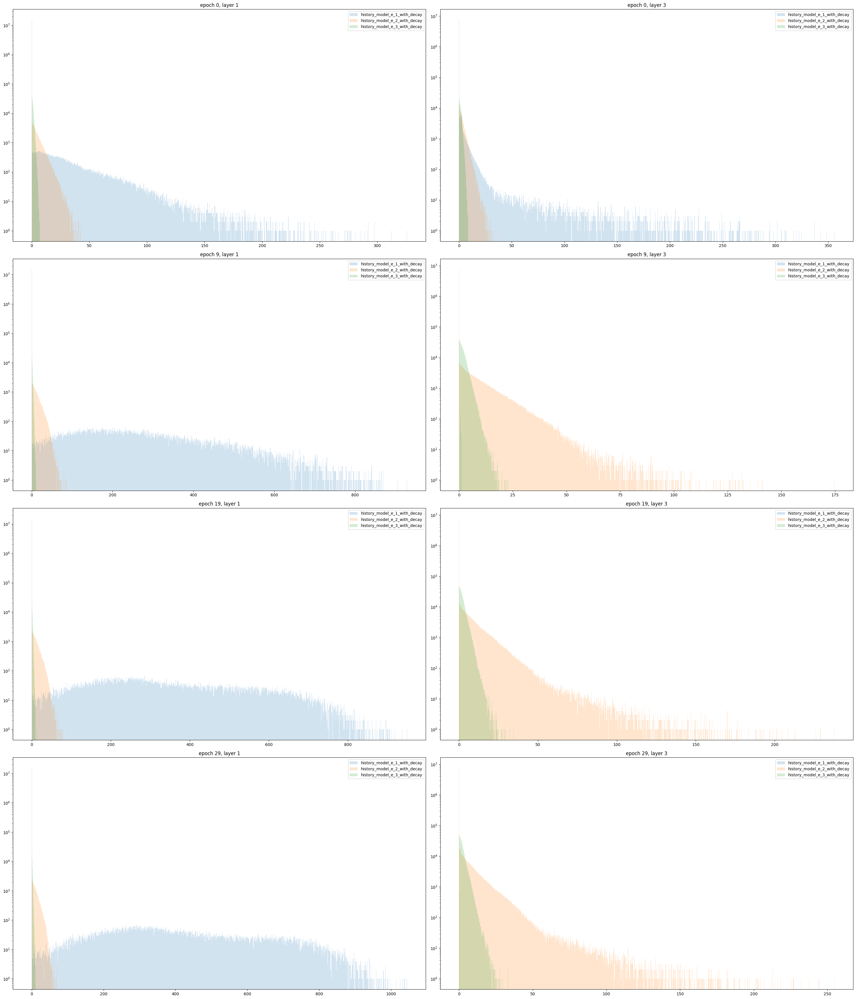

In [130]:
hist_list_without = [history_model_e_1_SGD_Momentum_without, history_model_e_2_SGD_Momentum_without, history_model_e_3_SGD_Momentum_without]
fig, axis = plt.subplots(4, 2, figsize=(30,35))
for q, history in enumerate(hist_list_without):
  for j, i in enumerate([0, 9, 19, 29]):
    for k, name in enumerate(hist_list_with[q][3][0]):
      all_act = torch.cat(
        history[3][i][name]
      )
      axis[j, k].set_yscale("log")
      axis[j, k].set_title(f"epoch {i}, layer {name}")
      axis[j, k].hist(all_act.numpy(), bins=1000, label=f"history_model_e_{q+1}_without_decay", alpha = 0.2)
      axis[j, k].legend()
plt.tight_layout()
plt.show()

## Adam

In [101]:
# CrossEntropy Loss 기반 모델 학습 함수
def train_model_Adam(
    dataloader : torch.utils.data.DataLoader,
    model,
    epoch,
    learning_rate,
    loss : torch.nn.Module,
    base_optimizer : torch.optim.Optimizer,
    device,
    isdecay
):

  # optimizer 생성
  # base_optimizer를 외부에서 받아와
  # SGD, Adam 등 다양한 optimizer 실험 가능
  optimizer = base_optimizer(
      model.parameters(),
      lr = learning_rate
  )
  if isdecay:
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
  else :
    scheduler = None
  # epoch별 loss 저장 list
  lossPerEpoch = []

  # epoch별 accuracy 저장 list
  accurcyPerEpoch = []

  # epoch별 gradient 저장 list
  weightGradPerEpoch = []

  # epoch별 activation 저장 list
  activationPerEpoch = []

  # 전체 epoch 반복
  for i in range(epoch):

    # 현재 epoch의 gradient 저장 dictionary
    weightGradOneEpoch = {}

    # 현재 epoch의 activation 저장 dictionary
    activationOneEpoch = {}

    # 각 parameter별 gradient 누적 tensor 초기화
    for name, param in model.named_parameters():

      # parameter shape와 동일한 크기의 0 tensor 생성
      weightGradOneEpoch[name] = torch.zeros_like(param)

    # 현재 epoch loss 초기화
    lossOneEpoch = 0.0

    # 현재 epoch accuracy 초기화
    accurcyOneEpoch = 0.0

    # batch 단위 학습 반복
    for batch_data, batch_label in tqdm.tqdm(dataloader):

      # 입력 데이터와 label을 device(GPU/CPU)로 이동
      batch_data = batch_data.to(device)
      batch_label = batch_label.to(device)

      # 모델을 train mode로 설정
      model.train(True)

      # forward propagation 수행
      output = model(batch_data)

      # CrossEntropy Loss 계산
      # CrossEntropy는 내부적으로 softmax를 포함하므로
      # output(logits)을 그대로 사용
      #
      # batch_label은 one-hot encoding 형태이므로
      # torch.argmax를 사용하여 class index 형태로 변환
      result = loss(
          output,
          batch_label
      )

      # 이전 batch gradient 초기화
      optimizer.zero_grad()

      # backward propagation 수행
      result.backward()

      # optimizer를 이용하여 parameter update
      optimizer.step()

      # accuracy 계산
      #
      # output의 가장 큰 값(argmax)을 예측 class로 사용
      # label의 argmax와 비교하여 정답 개수 계산
      accurcyOneEpoch += (
          torch.sum(
              torch.argmax(output, dim=1)
              ==
              batch_label
          )
          / 32
          / len(dataloader)
      )

      # batch loss 누적
      # epoch 평균 loss 계산을 위해 dataloader 길이로 나눔
      lossOneEpoch += (
          result.item()
          / len(dataloader)
      )

      # 각 layer(parameter)의 gradient magnitude 저장
      for name, param in model.named_parameters():

        # gradient 절댓값 저장
        #
        # abs 사용 이유:
        # gradient의 양수/음수 값이 서로 상쇄되는 문제 방지
        #
        # detach():
        # computational graph 분리
        #
        # clone():
        # gradient tensor 복사
        weightGradOneEpoch[name] += (
          abs(param.grad.detach().clone())
        )

      # 현재 batch의 activation 저장
      #
      # ReLU activation distribution 분석 목적
      with torch.no_grad():
        if i in activation_list:
          x = batch_data.clone()
          # 레이어를 하나씩 통과시키면서 원하는 곳의 출력 확인
          for name, layer in model.named_children():
            x = layer(x)
            if isinstance(layer, nn.ReLU): # ReLU 레이어의 출력만 확인하고 싶다면
              if activationOneEpoch.get(str(name), None) == None:

              # layer별 activation list 생성
                activationOneEpoch[str(name)] = []

              # activation tensor 저장
              # detach() : gradient graph에서 분리
              # cpu() : GPU tensor를 CPU로 이동
              # flatten() : histogram 분석을 위해 1차원으로 변환
              activationOneEpoch[str(name)].append(
                  x.detach().cpu().flatten()
              )

    # scheduler를 이용하여 Lr값 지수 보정
    if scheduler != None:
      scheduler.step()

    # 현재 epoch 결과 출력
    print("Epoch {} Loss : {}".format(i, lossOneEpoch))
    print("Epoch {} accurcy : {}".format(i, accurcyOneEpoch))

    # 현재 epoch gradient 저장
    weightGradPerEpoch.append(weightGradOneEpoch)

    # 현재 epoch loss 저장
    lossPerEpoch.append(lossOneEpoch)

    # 현재 epoch accuracy 저장
    accurcyPerEpoch.append(accurcyOneEpoch)

    # 현재 epoch activation 저장
    activationPerEpoch.append(activationOneEpoch)

  # 전체 학습 결과 반환
  return (
      lossPerEpoch,
      accurcyPerEpoch,
      weightGradPerEpoch,
      activationPerEpoch
  )

In [102]:
def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform(m.weight)
        m.bias.data.fill_(0.01)

In [103]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [104]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [105]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_1_Adam_with = train_model_Adam(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.1, loss=loss, base_optimizer=torch.optim.Adam, device = device, isdecay=True)
history_model_e_1_Adam_without = train_model_Adam(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.1, loss=loss, base_optimizer=torch.optim.Adam, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:05<00:00, 337.21it/s]


Epoch 0 Loss : 2.0003787116686507
Epoch 0 accurcy : 0.3783327341079712


100%|██████████| 1875/1875 [00:04<00:00, 401.01it/s]


Epoch 1 Loss : 1.5446576169649742
Epoch 1 accurcy : 0.3529326319694519


100%|██████████| 1875/1875 [00:04<00:00, 394.62it/s]


Epoch 2 Loss : 1.620172561136883
Epoch 2 accurcy : 0.30799996852874756


100%|██████████| 1875/1875 [00:04<00:00, 400.11it/s]


Epoch 3 Loss : 1.7624128382364896
Epoch 3 accurcy : 0.23858200013637543


100%|██████████| 1875/1875 [00:04<00:00, 398.47it/s]


Epoch 4 Loss : 1.784010965092976
Epoch 4 accurcy : 0.20056629180908203


100%|██████████| 1875/1875 [00:04<00:00, 398.19it/s]


Epoch 5 Loss : 1.7699804074605265
Epoch 5 accurcy : 0.19683338701725006


100%|██████████| 1875/1875 [00:04<00:00, 404.41it/s]


Epoch 6 Loss : 1.7518544176101678
Epoch 6 accurcy : 0.19543308019638062


100%|██████████| 1875/1875 [00:04<00:00, 392.49it/s]


Epoch 7 Loss : 1.8749736839294415
Epoch 7 accurcy : 0.19433307647705078


100%|██████████| 1875/1875 [00:04<00:00, 402.98it/s]


Epoch 8 Loss : 1.7203527736028053
Epoch 8 accurcy : 0.19529978930950165


100%|██████████| 1875/1875 [00:05<00:00, 342.82it/s]


Epoch 9 Loss : 1.7592607494354253
Epoch 9 accurcy : 0.19614984095096588


100%|██████████| 1875/1875 [00:04<00:00, 399.42it/s]


Epoch 10 Loss : 1.7088313978830967
Epoch 10 accurcy : 0.19784976541996002


100%|██████████| 1875/1875 [00:04<00:00, 406.13it/s]


Epoch 11 Loss : 1.707388819313053
Epoch 11 accurcy : 0.19546650350093842


100%|██████████| 1875/1875 [00:04<00:00, 396.86it/s]


Epoch 12 Loss : 1.695668376413983
Epoch 12 accurcy : 0.1967494934797287


100%|██████████| 1875/1875 [00:04<00:00, 398.42it/s]


Epoch 13 Loss : 1.7003981318155936
Epoch 13 accurcy : 0.19953300058841705


100%|██████████| 1875/1875 [00:04<00:00, 397.56it/s]


Epoch 14 Loss : 1.7007768274943023
Epoch 14 accurcy : 0.19883321225643158


100%|██████████| 1875/1875 [00:04<00:00, 396.70it/s]


Epoch 15 Loss : 1.7460807097117115
Epoch 15 accurcy : 0.1983165740966797


100%|██████████| 1875/1875 [00:04<00:00, 399.28it/s]


Epoch 16 Loss : 1.6933667475382512
Epoch 16 accurcy : 0.19769975543022156


100%|██████████| 1875/1875 [00:04<00:00, 400.08it/s]


Epoch 17 Loss : 1.702749179458618
Epoch 17 accurcy : 0.1997663378715515


100%|██████████| 1875/1875 [00:04<00:00, 402.41it/s]


Epoch 18 Loss : 1.6948547763188675
Epoch 18 accurcy : 0.19979964196681976


100%|██████████| 1875/1875 [00:05<00:00, 340.51it/s]


Epoch 19 Loss : 1.7027482161204017
Epoch 19 accurcy : 0.19839981198310852


100%|██████████| 1875/1875 [00:04<00:00, 401.32it/s]


Epoch 20 Loss : 1.6918379585266097
Epoch 20 accurcy : 0.2007497400045395


100%|██████████| 1875/1875 [00:04<00:00, 398.68it/s]


Epoch 21 Loss : 1.6895715407053642
Epoch 21 accurcy : 0.20059993863105774


100%|██████████| 1875/1875 [00:04<00:00, 396.17it/s]


Epoch 22 Loss : 1.6874281795501713
Epoch 22 accurcy : 0.19903308153152466


100%|██████████| 1875/1875 [00:04<00:00, 395.10it/s]


Epoch 23 Loss : 1.6869243283589646
Epoch 23 accurcy : 0.20204967260360718


100%|██████████| 1875/1875 [00:04<00:00, 389.87it/s]


Epoch 24 Loss : 1.6865951927820837
Epoch 24 accurcy : 0.19901616871356964


100%|██████████| 1875/1875 [00:04<00:00, 396.39it/s]


Epoch 25 Loss : 1.6925917222976687
Epoch 25 accurcy : 0.198099747300148


100%|██████████| 1875/1875 [00:04<00:00, 400.62it/s]


Epoch 26 Loss : 1.6846538976669305
Epoch 26 accurcy : 0.19926638901233673


100%|██████████| 1875/1875 [00:04<00:00, 390.74it/s]


Epoch 27 Loss : 1.68267876733144
Epoch 27 accurcy : 0.20219990611076355


100%|██████████| 1875/1875 [00:04<00:00, 398.26it/s]


Epoch 28 Loss : 1.6948593737284334
Epoch 28 accurcy : 0.2009829729795456


100%|██████████| 1875/1875 [00:05<00:00, 337.63it/s]


Epoch 29 Loss : 1.6822537642161028
Epoch 29 accurcy : 0.19786645472049713


100%|██████████| 1875/1875 [00:05<00:00, 337.52it/s]


Epoch 0 Loss : 1.9633606686274205
Epoch 0 accurcy : 0.2982660233974457


100%|██████████| 1875/1875 [00:04<00:00, 390.82it/s]


Epoch 1 Loss : 1.8621345698038734
Epoch 1 accurcy : 0.21604904532432556


100%|██████████| 1875/1875 [00:04<00:00, 400.78it/s]


Epoch 2 Loss : 2.316131448109942
Epoch 2 accurcy : 0.10026776790618896


100%|██████████| 1875/1875 [00:04<00:00, 399.16it/s]


Epoch 3 Loss : 2.3147318679809548
Epoch 3 accurcy : 0.10121779888868332


100%|██████████| 1875/1875 [00:04<00:00, 389.01it/s]


Epoch 4 Loss : 2.315823569234209
Epoch 4 accurcy : 0.09878445416688919


100%|██████████| 1875/1875 [00:04<00:00, 407.32it/s]


Epoch 5 Loss : 2.3155011388142954
Epoch 5 accurcy : 0.09981776028871536


100%|██████████| 1875/1875 [00:04<00:00, 399.06it/s]


Epoch 6 Loss : 2.315861292394003
Epoch 6 accurcy : 0.10060111433267593


100%|██████████| 1875/1875 [00:04<00:00, 396.43it/s]


Epoch 7 Loss : 2.315473387273155
Epoch 7 accurcy : 0.09971777349710464


100%|██████████| 1875/1875 [00:04<00:00, 401.62it/s]


Epoch 8 Loss : 2.315149030685423
Epoch 8 accurcy : 0.09910112619400024


100%|██████████| 1875/1875 [00:05<00:00, 341.25it/s]


Epoch 9 Loss : 2.315683409245806
Epoch 9 accurcy : 0.10010110586881638


100%|██████████| 1875/1875 [00:04<00:00, 399.28it/s]


Epoch 10 Loss : 2.314782939275103
Epoch 10 accurcy : 0.09955110400915146


100%|██████████| 1875/1875 [00:04<00:00, 399.89it/s]


Epoch 11 Loss : 2.315098480987552
Epoch 11 accurcy : 0.09993445128202438


100%|██████████| 1875/1875 [00:04<00:00, 392.25it/s]


Epoch 12 Loss : 2.315828044001258
Epoch 12 accurcy : 0.09806778281927109


100%|██████████| 1875/1875 [00:04<00:00, 394.53it/s]


Epoch 13 Loss : 2.3157916861216212
Epoch 13 accurcy : 0.10161782801151276


100%|██████████| 1875/1875 [00:04<00:00, 397.87it/s]


Epoch 14 Loss : 2.315149093755083
Epoch 14 accurcy : 0.09841780364513397


100%|██████████| 1875/1875 [00:04<00:00, 399.02it/s]


Epoch 15 Loss : 2.3147271589914924
Epoch 15 accurcy : 0.09953443706035614


100%|██████████| 1875/1875 [00:04<00:00, 396.82it/s]


Epoch 16 Loss : 2.3154580107371032
Epoch 16 accurcy : 0.10116779059171677


100%|██████████| 1875/1875 [00:04<00:00, 404.71it/s]


Epoch 17 Loss : 2.314269603729252
Epoch 17 accurcy : 0.09876778721809387


100%|██████████| 1875/1875 [00:04<00:00, 399.12it/s]


Epoch 18 Loss : 2.3159928596496573
Epoch 18 accurcy : 0.09960109740495682


100%|██████████| 1875/1875 [00:05<00:00, 340.54it/s]


Epoch 19 Loss : 2.3150094664255763
Epoch 19 accurcy : 0.09906774759292603


100%|██████████| 1875/1875 [00:04<00:00, 401.44it/s]


Epoch 20 Loss : 2.3154841684977234
Epoch 20 accurcy : 0.100667804479599


100%|██████████| 1875/1875 [00:04<00:00, 397.73it/s]


Epoch 21 Loss : 2.3167941950480118
Epoch 21 accurcy : 0.09933444857597351


100%|██████████| 1875/1875 [00:04<00:00, 401.68it/s]


Epoch 22 Loss : 2.3150972176869713
Epoch 22 accurcy : 0.10065112262964249


100%|██████████| 1875/1875 [00:04<00:00, 397.34it/s]


Epoch 23 Loss : 2.3157138997395834
Epoch 23 accurcy : 0.09983443468809128


100%|██████████| 1875/1875 [00:04<00:00, 400.60it/s]


Epoch 24 Loss : 2.3161365833282415
Epoch 24 accurcy : 0.10021781176328659


100%|██████████| 1875/1875 [00:04<00:00, 400.20it/s]


Epoch 25 Loss : 2.3155479380289714
Epoch 25 accurcy : 0.09886780381202698


100%|██████████| 1875/1875 [00:04<00:00, 396.69it/s]


Epoch 26 Loss : 2.3151515500386624
Epoch 26 accurcy : 0.09901776909828186


100%|██████████| 1875/1875 [00:04<00:00, 404.51it/s]


Epoch 27 Loss : 2.3157840023040777
Epoch 27 accurcy : 0.09890111535787582


100%|██████████| 1875/1875 [00:04<00:00, 393.22it/s]


Epoch 28 Loss : 2.3156313206990595
Epoch 28 accurcy : 0.09748443961143494


100%|██████████| 1875/1875 [00:05<00:00, 339.45it/s]

Epoch 29 Loss : 2.315157475662237
Epoch 29 accurcy : 0.10030112415552139


In [106]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [107]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [108]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_2_Adam_with = train_model_Adam(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.Adam, device = device, isdecay=True)
history_model_e_2_Adam_without = train_model_Adam(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.01, loss=loss, base_optimizer=torch.optim.Adam, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:05<00:00, 337.70it/s]


Epoch 0 Loss : 0.5560469907760609
Epoch 0 accurcy : 0.8045517206192017


100%|██████████| 1875/1875 [00:04<00:00, 401.47it/s]


Epoch 1 Loss : 0.43887012770573286
Epoch 1 accurcy : 0.8442007303237915


100%|██████████| 1875/1875 [00:04<00:00, 401.92it/s]


Epoch 2 Loss : 0.40514694642424476
Epoch 2 accurcy : 0.8539673089981079


100%|██████████| 1875/1875 [00:04<00:00, 398.96it/s]


Epoch 3 Loss : 0.3839103634357452
Epoch 3 accurcy : 0.8614668846130371


100%|██████████| 1875/1875 [00:04<00:00, 401.78it/s]


Epoch 4 Loss : 0.36307342363993267
Epoch 4 accurcy : 0.8671656847000122


100%|██████████| 1875/1875 [00:04<00:00, 399.25it/s]


Epoch 5 Loss : 0.3464662731071311
Epoch 5 accurcy : 0.8722823262214661


100%|██████████| 1875/1875 [00:04<00:00, 402.16it/s]


Epoch 6 Loss : 0.33724920091430377
Epoch 6 accurcy : 0.8764494061470032


100%|██████████| 1875/1875 [00:04<00:00, 400.79it/s]


Epoch 7 Loss : 0.32260811144709545
Epoch 7 accurcy : 0.8807823657989502


100%|██████████| 1875/1875 [00:04<00:00, 395.11it/s]


Epoch 8 Loss : 0.31393218573331877
Epoch 8 accurcy : 0.8834484815597534


100%|██████████| 1875/1875 [00:05<00:00, 344.15it/s]


Epoch 9 Loss : 0.30583016916960454
Epoch 9 accurcy : 0.8862154483795166


100%|██████████| 1875/1875 [00:04<00:00, 395.96it/s]


Epoch 10 Loss : 0.2938295392880831
Epoch 10 accurcy : 0.8902491331100464


100%|██████████| 1875/1875 [00:04<00:00, 402.91it/s]


Epoch 11 Loss : 0.2885724086001518
Epoch 11 accurcy : 0.8925982713699341


100%|██████████| 1875/1875 [00:04<00:00, 400.67it/s]


Epoch 12 Loss : 0.2807489593505863
Epoch 12 accurcy : 0.8944492936134338


100%|██████████| 1875/1875 [00:04<00:00, 396.48it/s]


Epoch 13 Loss : 0.27495802400012753
Epoch 13 accurcy : 0.8971655368804932


100%|██████████| 1875/1875 [00:04<00:00, 396.44it/s]


Epoch 14 Loss : 0.26681213067968657
Epoch 14 accurcy : 0.8998496532440186


100%|██████████| 1875/1875 [00:04<00:00, 392.19it/s]


Epoch 15 Loss : 0.2617481786936522
Epoch 15 accurcy : 0.8997154235839844


100%|██████████| 1875/1875 [00:04<00:00, 399.87it/s]


Epoch 16 Loss : 0.2583484658221401
Epoch 16 accurcy : 0.9014667272567749


100%|██████████| 1875/1875 [00:04<00:00, 398.89it/s]


Epoch 17 Loss : 0.25221535990536204
Epoch 17 accurcy : 0.9028826355934143


100%|██████████| 1875/1875 [00:04<00:00, 398.53it/s]


Epoch 18 Loss : 0.2476396316965417
Epoch 18 accurcy : 0.9046827554702759


100%|██████████| 1875/1875 [00:05<00:00, 344.00it/s]


Epoch 19 Loss : 0.24286633741358962
Epoch 19 accurcy : 0.9067333340644836


100%|██████████| 1875/1875 [00:04<00:00, 394.08it/s]


Epoch 20 Loss : 0.23939424068083412
Epoch 20 accurcy : 0.908015787601471


100%|██████████| 1875/1875 [00:04<00:00, 398.47it/s]


Epoch 21 Loss : 0.2356090899616484
Epoch 21 accurcy : 0.9100331664085388


100%|██████████| 1875/1875 [00:04<00:00, 397.41it/s]


Epoch 22 Loss : 0.23273535356571218
Epoch 22 accurcy : 0.910599946975708


100%|██████████| 1875/1875 [00:04<00:00, 399.48it/s]


Epoch 23 Loss : 0.22949774984121327
Epoch 23 accurcy : 0.912283182144165


100%|██████████| 1875/1875 [00:04<00:00, 405.84it/s]


Epoch 24 Loss : 0.22747829620341484
Epoch 24 accurcy : 0.9121658205986023


100%|██████████| 1875/1875 [00:04<00:00, 394.54it/s]


Epoch 25 Loss : 0.22445949169794668
Epoch 25 accurcy : 0.9132158160209656


100%|██████████| 1875/1875 [00:04<00:00, 399.40it/s]


Epoch 26 Loss : 0.22198402983546278
Epoch 26 accurcy : 0.9145830869674683


100%|██████████| 1875/1875 [00:04<00:00, 394.76it/s]


Epoch 27 Loss : 0.22024527691205328
Epoch 27 accurcy : 0.9149499535560608


100%|██████████| 1875/1875 [00:04<00:00, 395.72it/s]


Epoch 28 Loss : 0.2180229439998663
Epoch 28 accurcy : 0.9160662293434143


100%|██████████| 1875/1875 [00:05<00:00, 334.09it/s]


Epoch 29 Loss : 0.21620737431943488
Epoch 29 accurcy : 0.9169995188713074


100%|██████████| 1875/1875 [00:05<00:00, 337.01it/s]


Epoch 0 Loss : 0.5469900806268051
Epoch 0 accurcy : 0.8053336143493652


100%|██████████| 1875/1875 [00:04<00:00, 399.85it/s]


Epoch 1 Loss : 0.4436438797156018
Epoch 1 accurcy : 0.8419333696365356


100%|██████████| 1875/1875 [00:04<00:00, 397.21it/s]


Epoch 2 Loss : 0.4217813075264295
Epoch 2 accurcy : 0.8497499823570251


100%|██████████| 1875/1875 [00:04<00:00, 402.44it/s]


Epoch 3 Loss : 0.41086924260258717
Epoch 3 accurcy : 0.853499710559845


100%|██████████| 1875/1875 [00:04<00:00, 399.33it/s]


Epoch 4 Loss : 0.40001130541165647
Epoch 4 accurcy : 0.8562493324279785


100%|██████████| 1875/1875 [00:04<00:00, 399.42it/s]


Epoch 5 Loss : 0.39155274204810464
Epoch 5 accurcy : 0.8589836955070496


100%|██████████| 1875/1875 [00:04<00:00, 395.23it/s]


Epoch 6 Loss : 0.388913042608897
Epoch 6 accurcy : 0.8597822189331055


100%|██████████| 1875/1875 [00:04<00:00, 396.82it/s]


Epoch 7 Loss : 0.37994669141769316
Epoch 7 accurcy : 0.8653506636619568


100%|██████████| 1875/1875 [00:04<00:00, 401.36it/s]


Epoch 8 Loss : 0.3750876363555601
Epoch 8 accurcy : 0.8653493523597717


100%|██████████| 1875/1875 [00:05<00:00, 340.05it/s]


Epoch 9 Loss : 0.3771706851621464
Epoch 9 accurcy : 0.865549623966217


100%|██████████| 1875/1875 [00:04<00:00, 391.77it/s]


Epoch 10 Loss : 0.36750245265563375
Epoch 10 accurcy : 0.8687829971313477


100%|██████████| 1875/1875 [00:04<00:00, 394.11it/s]


Epoch 11 Loss : 0.3729472279588386
Epoch 11 accurcy : 0.8680165410041809


100%|██████████| 1875/1875 [00:04<00:00, 397.83it/s]


Epoch 12 Loss : 0.36965079772869736
Epoch 12 accurcy : 0.8672332167625427


100%|██████████| 1875/1875 [00:04<00:00, 401.72it/s]


Epoch 13 Loss : 0.3593362071196231
Epoch 13 accurcy : 0.8717659711837769


100%|██████████| 1875/1875 [00:04<00:00, 395.69it/s]


Epoch 14 Loss : 0.361965104756753
Epoch 14 accurcy : 0.8705165386199951


100%|██████████| 1875/1875 [00:04<00:00, 397.37it/s]


Epoch 15 Loss : 0.35824850502610134
Epoch 15 accurcy : 0.8718993067741394


100%|██████████| 1875/1875 [00:04<00:00, 397.65it/s]


Epoch 16 Loss : 0.35360579198598857
Epoch 16 accurcy : 0.8735663890838623


100%|██████████| 1875/1875 [00:04<00:00, 398.76it/s]


Epoch 17 Loss : 0.35096557988723065
Epoch 17 accurcy : 0.8743003010749817


100%|██████████| 1875/1875 [00:04<00:00, 403.49it/s]


Epoch 18 Loss : 0.3505196786602335
Epoch 18 accurcy : 0.8752837777137756


100%|██████████| 1875/1875 [00:05<00:00, 341.26it/s]


Epoch 19 Loss : 0.3541222641229625
Epoch 19 accurcy : 0.8733663558959961


100%|██████████| 1875/1875 [00:04<00:00, 401.23it/s]


Epoch 20 Loss : 0.358474875017007
Epoch 20 accurcy : 0.8741169571876526


100%|██████████| 1875/1875 [00:04<00:00, 392.66it/s]


Epoch 21 Loss : 0.33911922589937826
Epoch 21 accurcy : 0.8782495260238647


100%|██████████| 1875/1875 [00:04<00:00, 398.16it/s]


Epoch 22 Loss : 0.3529019996583464
Epoch 22 accurcy : 0.8759824633598328


100%|██████████| 1875/1875 [00:04<00:00, 401.03it/s]


Epoch 23 Loss : 0.34858902062575026
Epoch 23 accurcy : 0.8774158358573914


100%|██████████| 1875/1875 [00:04<00:00, 395.53it/s]


Epoch 24 Loss : 0.34415898850262194
Epoch 24 accurcy : 0.8788493275642395


100%|██████████| 1875/1875 [00:04<00:00, 399.86it/s]


Epoch 25 Loss : 0.34475457675854393
Epoch 25 accurcy : 0.8777660727500916


100%|██████████| 1875/1875 [00:04<00:00, 398.34it/s]


Epoch 26 Loss : 0.34642606581449525
Epoch 26 accurcy : 0.8787329792976379


100%|██████████| 1875/1875 [00:04<00:00, 397.66it/s]


Epoch 27 Loss : 0.33292976908485117
Epoch 27 accurcy : 0.8799986839294434


100%|██████████| 1875/1875 [00:04<00:00, 392.81it/s]


Epoch 28 Loss : 0.33921653859416606
Epoch 28 accurcy : 0.8800661563873291


100%|██████████| 1875/1875 [00:05<00:00, 338.99it/s]

Epoch 29 Loss : 0.34017755520343834
Epoch 29 accurcy : 0.8799650073051453


In [109]:
seed = 2026
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = False

In [110]:
input_size = train_x_flatten.shape[-1]
num_classes = 10
activation_list = [0, 9, 19, 29]
base_model_decay = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_decay.apply(init_weights)
base_model_without = nn.Sequential(
    nn.Linear(input_size, 256),   # 입력 → 첫 번째 은닉층 (input_size → 256)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(256, 128),              # 두 번째 은닉층 (256 → 128)
    nn.ReLU(),                              # 활성화 함수 (ReLU)
    nn.Linear(128, num_classes)   # 출력층 (128 → 클래스 개수)
)
base_model_without.apply(init_weights)

/tmp/ipykernel_7129/239054705.py:3: FutureWarning: `nn.init.xavier_uniform` is now deprecated in favor of `nn.init.xavier_uniform_`.
  torch.nn.init.xavier_uniform(m.weight)


Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)

In [111]:
loss = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model_decay = base_model_decay.to(device)
base_model_without = base_model_without.to(device)
history_model_e_3_Adam_with = train_model_Adam(train_sparse_fashion_mnist_dataloader, base_model_decay, 30, learning_rate=0.001, loss=loss, base_optimizer=torch.optim.Adam, device = device, isdecay=True)
history_model_e_3_Adam_without = train_model_Adam(train_sparse_fashion_mnist_dataloader, base_model_without, 30, learning_rate=0.001, loss=loss, base_optimizer=torch.optim.Adam, device = device, isdecay=False)

100%|██████████| 1875/1875 [00:05<00:00, 343.19it/s]


Epoch 0 Loss : 0.47222957793076786
Epoch 0 accurcy : 0.8299336433410645


100%|██████████| 1875/1875 [00:04<00:00, 395.32it/s]


Epoch 1 Loss : 0.3537906914313632
Epoch 1 accurcy : 0.8704996705055237


100%|██████████| 1875/1875 [00:04<00:00, 398.67it/s]


Epoch 2 Loss : 0.3133605675796669
Epoch 2 accurcy : 0.8833831548690796


100%|██████████| 1875/1875 [00:04<00:00, 391.01it/s]


Epoch 3 Loss : 0.28778585146069563
Epoch 3 accurcy : 0.8932324051856995


100%|██████████| 1875/1875 [00:04<00:00, 400.83it/s]


Epoch 4 Loss : 0.2638238760272657
Epoch 4 accurcy : 0.9016662836074829


100%|██████████| 1875/1875 [00:04<00:00, 402.44it/s]


Epoch 5 Loss : 0.2488415779004495
Epoch 5 accurcy : 0.9061164259910583


100%|██████████| 1875/1875 [00:04<00:00, 395.13it/s]


Epoch 6 Loss : 0.23215934663613624
Epoch 6 accurcy : 0.9130500555038452


100%|██████████| 1875/1875 [00:04<00:00, 398.59it/s]


Epoch 7 Loss : 0.2155209126194321
Epoch 7 accurcy : 0.9185332655906677


100%|██████████| 1875/1875 [00:04<00:00, 397.54it/s]


Epoch 8 Loss : 0.20394804351876178
Epoch 8 accurcy : 0.922899067401886


100%|██████████| 1875/1875 [00:05<00:00, 338.93it/s]


Epoch 9 Loss : 0.1912687200484175
Epoch 9 accurcy : 0.9275673627853394


100%|██████████| 1875/1875 [00:04<00:00, 395.90it/s]


Epoch 10 Loss : 0.17996352225144713
Epoch 10 accurcy : 0.9316831231117249


100%|██████████| 1875/1875 [00:04<00:00, 388.95it/s]


Epoch 11 Loss : 0.1691674839069445
Epoch 11 accurcy : 0.9363327622413635


100%|██████████| 1875/1875 [00:04<00:00, 395.65it/s]


Epoch 12 Loss : 0.15993794322535362
Epoch 12 accurcy : 0.9396827816963196


100%|██████████| 1875/1875 [00:04<00:00, 392.82it/s]


Epoch 13 Loss : 0.1515883583284914
Epoch 13 accurcy : 0.9440665245056152


100%|██████████| 1875/1875 [00:04<00:00, 395.98it/s]


Epoch 14 Loss : 0.1433182895292839
Epoch 14 accurcy : 0.9460335373878479


100%|██████████| 1875/1875 [00:04<00:00, 397.14it/s]


Epoch 15 Loss : 0.13527382393330364
Epoch 15 accurcy : 0.9499500393867493


100%|██████████| 1875/1875 [00:04<00:00, 392.32it/s]


Epoch 16 Loss : 0.12924744835495988
Epoch 16 accurcy : 0.9523669481277466


100%|██████████| 1875/1875 [00:04<00:00, 397.80it/s]


Epoch 17 Loss : 0.1221000922153393
Epoch 17 accurcy : 0.9551001191139221


100%|██████████| 1875/1875 [00:04<00:00, 386.41it/s]


Epoch 18 Loss : 0.11724692081660039
Epoch 18 accurcy : 0.9571323990821838


100%|██████████| 1875/1875 [00:05<00:00, 340.98it/s]


Epoch 19 Loss : 0.11174260759738563
Epoch 19 accurcy : 0.9592834711074829


100%|██████████| 1875/1875 [00:04<00:00, 400.36it/s]


Epoch 20 Loss : 0.10705747019834794
Epoch 20 accurcy : 0.9614329934120178


100%|██████████| 1875/1875 [00:04<00:00, 395.70it/s]


Epoch 21 Loss : 0.10248281383241208
Epoch 21 accurcy : 0.9628987312316895


100%|██████████| 1875/1875 [00:04<00:00, 398.59it/s]


Epoch 22 Loss : 0.09886231177126356
Epoch 22 accurcy : 0.964316189289093


100%|██████████| 1875/1875 [00:04<00:00, 391.21it/s]


Epoch 23 Loss : 0.09500888726313894
Epoch 23 accurcy : 0.9664827585220337


100%|██████████| 1875/1875 [00:04<00:00, 393.28it/s]


Epoch 24 Loss : 0.0919983929378292
Epoch 24 accurcy : 0.9676329493522644


100%|██████████| 1875/1875 [00:04<00:00, 395.18it/s]


Epoch 25 Loss : 0.08846174271255731
Epoch 25 accurcy : 0.9683501124382019


100%|██████████| 1875/1875 [00:04<00:00, 387.23it/s]


Epoch 26 Loss : 0.08570926679012686
Epoch 26 accurcy : 0.9703506231307983


100%|██████████| 1875/1875 [00:04<00:00, 394.55it/s]


Epoch 27 Loss : 0.08327387068060534
Epoch 27 accurcy : 0.971500039100647


100%|██████████| 1875/1875 [00:04<00:00, 391.70it/s]


Epoch 28 Loss : 0.08136977031789708
Epoch 28 accurcy : 0.9717174768447876


100%|██████████| 1875/1875 [00:05<00:00, 342.61it/s]


Epoch 29 Loss : 0.07906738330150644
Epoch 29 accurcy : 0.9729500412940979


100%|██████████| 1875/1875 [00:05<00:00, 339.56it/s]


Epoch 0 Loss : 0.47397938476403556
Epoch 0 accurcy : 0.8288838267326355


100%|██████████| 1875/1875 [00:04<00:00, 402.63it/s]


Epoch 1 Loss : 0.3591020508984725
Epoch 1 accurcy : 0.8676331043243408


100%|██████████| 1875/1875 [00:04<00:00, 392.44it/s]


Epoch 2 Loss : 0.3244120355407398
Epoch 2 accurcy : 0.8798996806144714


100%|██████████| 1875/1875 [00:04<00:00, 392.33it/s]


Epoch 3 Loss : 0.29996017099022837
Epoch 3 accurcy : 0.8884161114692688


100%|██████████| 1875/1875 [00:04<00:00, 399.29it/s]


Epoch 4 Loss : 0.2831463426828382
Epoch 4 accurcy : 0.8942667245864868


100%|██████████| 1875/1875 [00:04<00:00, 392.20it/s]


Epoch 5 Loss : 0.2694477611521877
Epoch 5 accurcy : 0.898166298866272


100%|██████████| 1875/1875 [00:04<00:00, 394.61it/s]


Epoch 6 Loss : 0.2537859468956792
Epoch 6 accurcy : 0.9032665491104126


100%|██████████| 1875/1875 [00:04<00:00, 402.92it/s]


Epoch 7 Loss : 0.24329866037964798
Epoch 7 accurcy : 0.9076997637748718


100%|██████████| 1875/1875 [00:04<00:00, 391.66it/s]


Epoch 8 Loss : 0.2324996935437122
Epoch 8 accurcy : 0.9110667109489441


100%|██████████| 1875/1875 [00:05<00:00, 343.94it/s]


Epoch 9 Loss : 0.22750372009575376
Epoch 9 accurcy : 0.9134328961372375


100%|██████████| 1875/1875 [00:04<00:00, 399.86it/s]


Epoch 10 Loss : 0.21519033406476146
Epoch 10 accurcy : 0.9175994396209717


100%|██████████| 1875/1875 [00:04<00:00, 402.85it/s]


Epoch 11 Loss : 0.20791404507060862
Epoch 11 accurcy : 0.9208324551582336


100%|██████████| 1875/1875 [00:04<00:00, 396.13it/s]


Epoch 12 Loss : 0.2022388983478147
Epoch 12 accurcy : 0.9232826828956604


100%|██████████| 1875/1875 [00:04<00:00, 401.60it/s]


Epoch 13 Loss : 0.19353591826856145
Epoch 13 accurcy : 0.9256661534309387


100%|██████████| 1875/1875 [00:04<00:00, 394.61it/s]


Epoch 14 Loss : 0.18777209381262458
Epoch 14 accurcy : 0.9279654026031494


100%|██████████| 1875/1875 [00:04<00:00, 398.19it/s]


Epoch 15 Loss : 0.18049453882227334
Epoch 15 accurcy : 0.9306828379631042


100%|██████████| 1875/1875 [00:04<00:00, 400.36it/s]


Epoch 16 Loss : 0.175458806322763
Epoch 16 accurcy : 0.9318668842315674


100%|██████████| 1875/1875 [00:04<00:00, 392.00it/s]


Epoch 17 Loss : 0.17041406285464739
Epoch 17 accurcy : 0.9348993897438049


100%|██████████| 1875/1875 [00:04<00:00, 395.37it/s]


Epoch 18 Loss : 0.1679673828698692
Epoch 18 accurcy : 0.9342157244682312


100%|██████████| 1875/1875 [00:05<00:00, 339.15it/s]


Epoch 19 Loss : 0.1607752180698016
Epoch 19 accurcy : 0.9386168718338013


100%|██████████| 1875/1875 [00:04<00:00, 395.84it/s]


Epoch 20 Loss : 0.15939278550992397
Epoch 20 accurcy : 0.9389836192131042


100%|██████████| 1875/1875 [00:04<00:00, 399.56it/s]


Epoch 21 Loss : 0.15151817788581073
Epoch 21 accurcy : 0.9417828321456909


100%|██████████| 1875/1875 [00:04<00:00, 392.01it/s]


Epoch 22 Loss : 0.14999008091613628
Epoch 22 accurcy : 0.9427330493927002


100%|██████████| 1875/1875 [00:04<00:00, 396.30it/s]


Epoch 23 Loss : 0.14656035066296658
Epoch 23 accurcy : 0.9442161917686462


100%|██████████| 1875/1875 [00:04<00:00, 398.41it/s]


Epoch 24 Loss : 0.14156463547833267
Epoch 24 accurcy : 0.9454337358474731


100%|██████████| 1875/1875 [00:04<00:00, 391.50it/s]


Epoch 25 Loss : 0.13791578392659623
Epoch 25 accurcy : 0.9458168745040894


100%|██████████| 1875/1875 [00:04<00:00, 398.92it/s]


Epoch 26 Loss : 0.13325390714953345
Epoch 26 accurcy : 0.948082447052002


100%|██████████| 1875/1875 [00:04<00:00, 391.61it/s]


Epoch 27 Loss : 0.13129050340925674
Epoch 27 accurcy : 0.9491672515869141


100%|██████████| 1875/1875 [00:04<00:00, 402.40it/s]


Epoch 28 Loss : 0.1292103280515722
Epoch 28 accurcy : 0.9502499103546143


100%|██████████| 1875/1875 [00:05<00:00, 338.02it/s]

Epoch 29 Loss : 0.12447613049820065
Epoch 29 accurcy : 0.9512510895729065


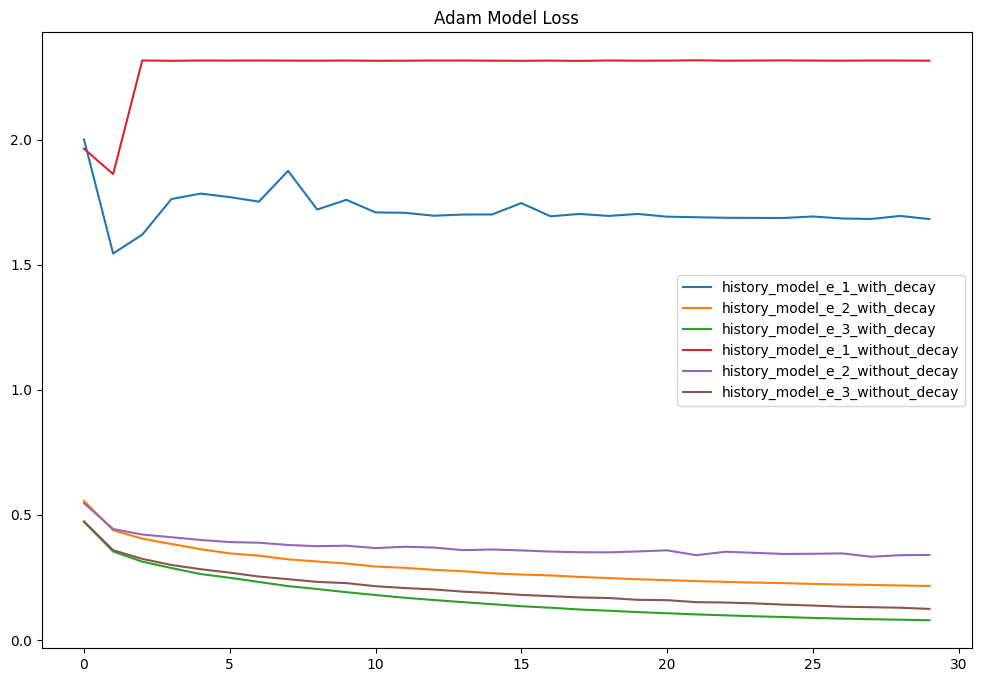

In [112]:
plt.figure(figsize=(12,8))
plt.title("Adam Model Loss")
hist_list_with = [history_model_e_1_Adam_with, history_model_e_2_Adam_with, history_model_e_3_Adam_with]
for k, history in enumerate(hist_list_with):
  plt.plot(history[0], label=f"history_model_e_{k+1}_with_decay")
  plt.legend()
hist_list_without = [history_model_e_1_Adam_without, history_model_e_2_Adam_without, history_model_e_3_Adam_without]
for k, history in enumerate(hist_list_without):
  plt.plot(history[0], label=f"history_model_e_{k+1}_without_decay")
  plt.legend()
plt.show()

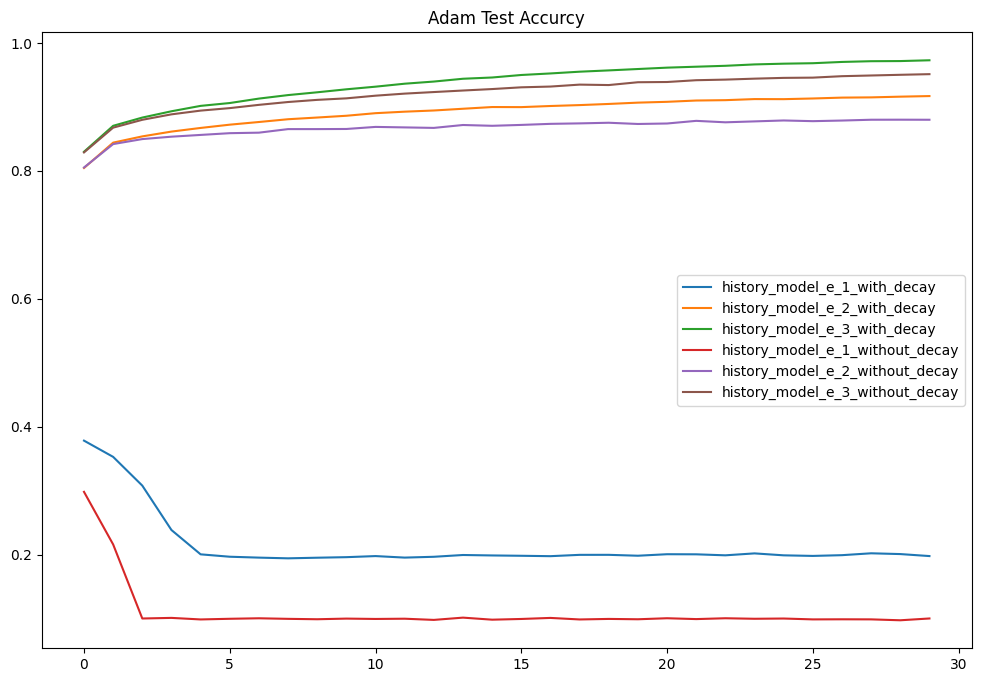

In [113]:
plt.figure(figsize=(12,8))
plt.title("Adam Test Accurcy")
for k, history in enumerate(hist_list_with):
  for i in range(len(history[1])):
    history[1][i] = history[1][i].cpu()
  plt.plot(history[1], label=f"history_model_e_{k+1}_with_decay")
for k, history in enumerate(hist_list_without):
  for i in range(len(history[1])):
    history[1][i] = history[1][i].cpu()
  plt.plot(history[1], label=f"history_model_e_{k+1}_without_decay")
plt.legend()
plt.show()

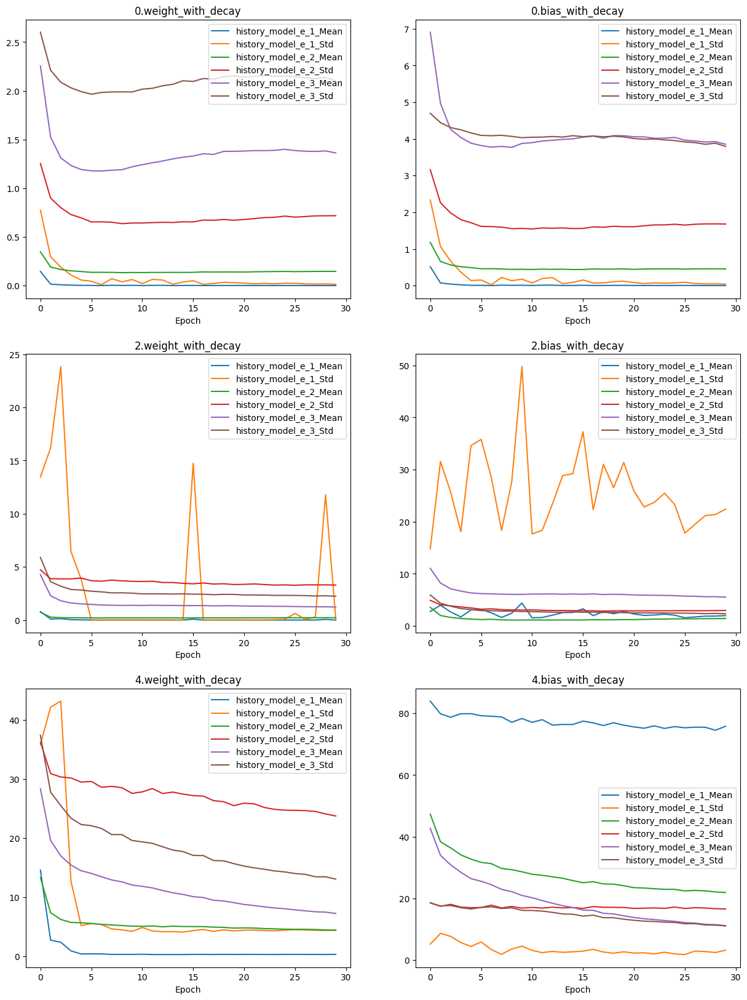

In [114]:
plt.figure(figsize=(15,20))
for k, history in enumerate(hist_list_with):
  for j, name in enumerate(history[2][0]):
    plt.subplot(3,2, 1+j)
    mean = []
    std = []
    for i in range(len(history[2])):
      flatten_tensor = history[2][i][name].detach().cpu().flatten()
      mean.append(flatten_tensor.mean())
      std.append(flatten_tensor.std())

    plt.plot(mean, label=f"history_model_e_{k+1}_Mean")
    plt.plot(std, label=f"history_model_e_{k+1}_Std")

    plt.title(f"{name}_with_decay")
    plt.xlabel("Epoch")
    plt.legend()
plt.show()

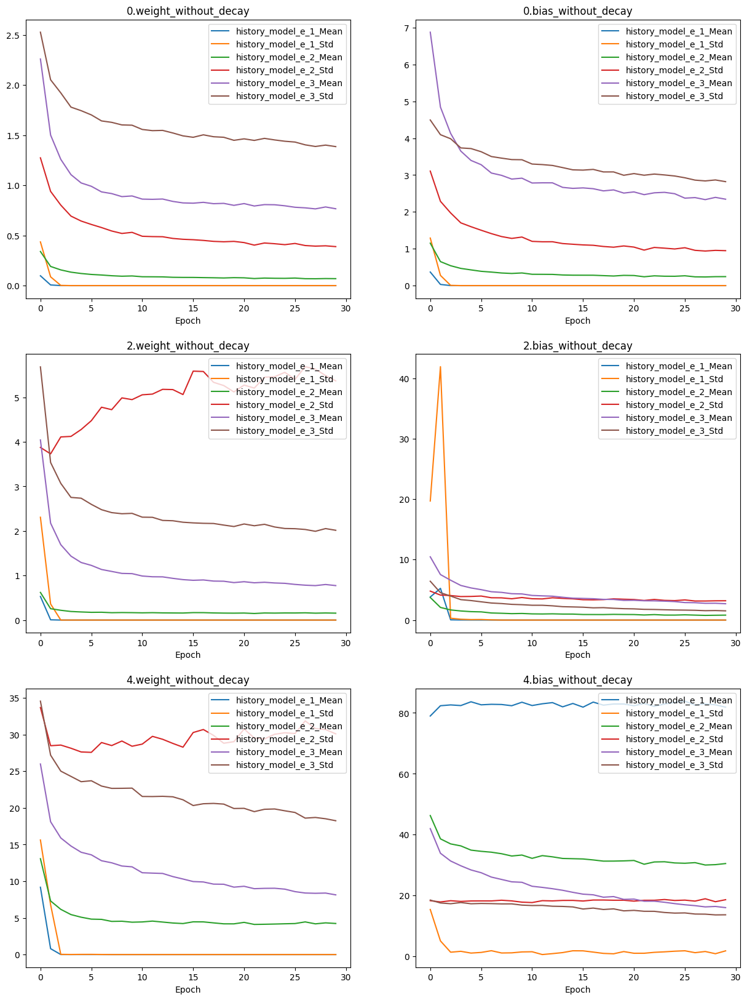

In [115]:
plt.figure(figsize=(15,20))
for k, history in enumerate(hist_list_without):
  for j, name in enumerate(history[2][0]):
    plt.subplot(3,2, 1+j)
    mean = []
    std = []
    for i in range(len(history[2])):
      flatten_tensor = history[2][i][name].detach().cpu().flatten()
      mean.append(flatten_tensor.mean())
      std.append(flatten_tensor.std())

    plt.plot(mean, label=f"history_model_e_{k+1}_Mean")
    plt.plot(std, label=f"history_model_e_{k+1}_Std")

    plt.title(f"{name}_without_decay")
    plt.xlabel("Epoch")
    plt.legend()
plt.show()

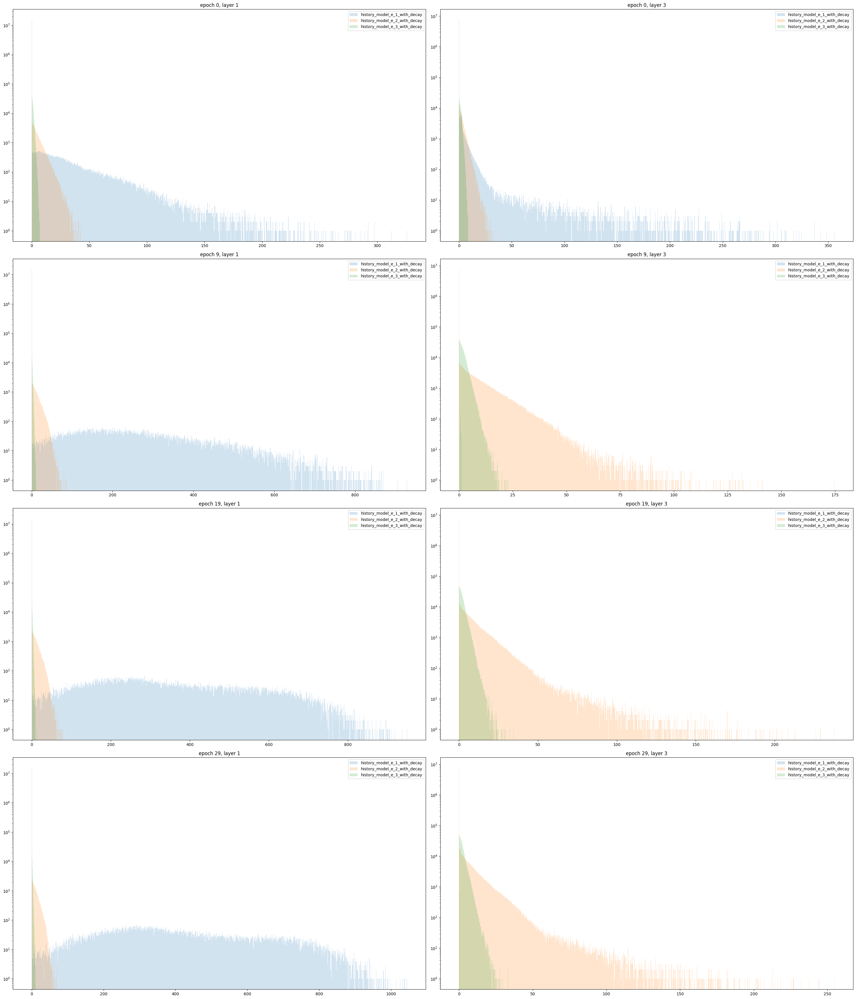

In [131]:
hist_list_with = [history_model_e_1_Adam_with, history_model_e_2_Adam_with, history_model_e_3_Adam_with]
fig, axis = plt.subplots(4, 2, figsize=(30,35))
for q, history in enumerate(hist_list_with):
  for j, i in enumerate([0, 9, 19, 29]):
    for k, name in enumerate(hist_list_with[q][3][0]):
      all_act = torch.cat(
        history[3][i][name]
      )
      axis[j, k].set_yscale("log")
      axis[j, k].set_title(f"epoch {i}, layer {name}")
      axis[j, k].hist(all_act.numpy(), bins=1000, label=f"history_model_e_{q+1}_with_decay", alpha = 0.2)
      axis[j, k].legend()
plt.tight_layout()
plt.show()

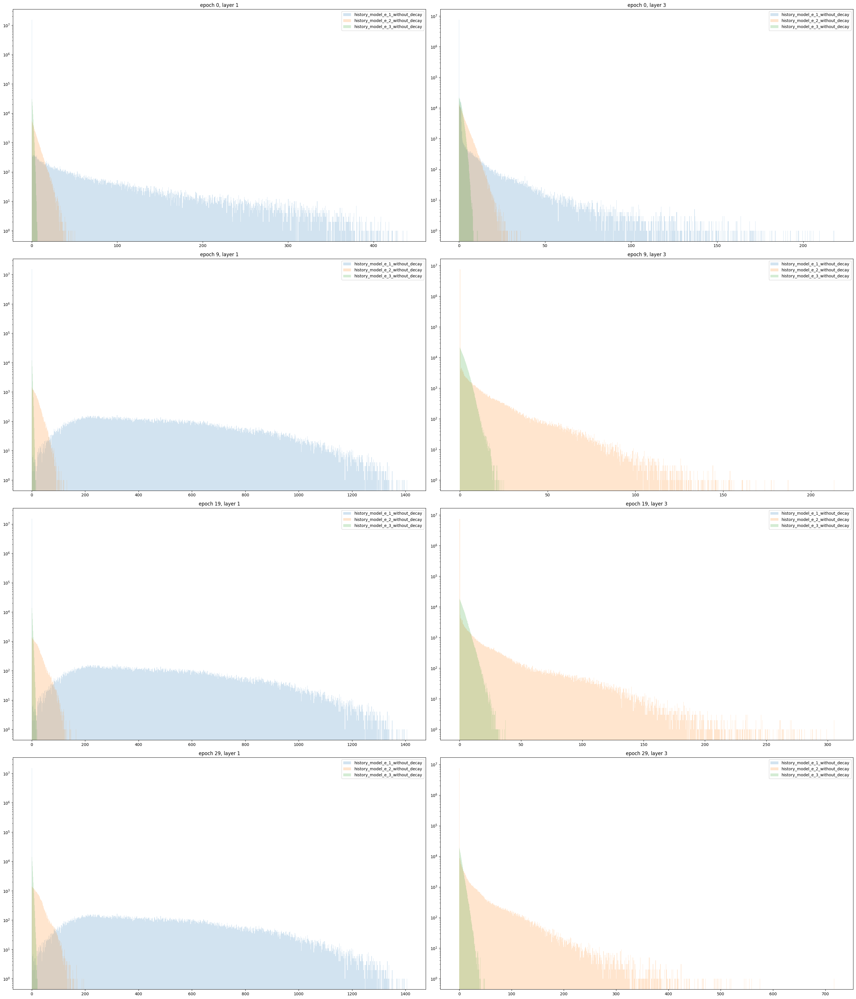

In [132]:
hist_list_without = [history_model_e_1_Adam_without, history_model_e_2_Adam_without, history_model_e_3_Adam_without]
fig, axis = plt.subplots(4, 2, figsize=(30,35))
for q, history in enumerate(hist_list_without):
  for j, i in enumerate([0, 9, 19, 29]):
    for k, name in enumerate(hist_list_with[q][3][0]):
      all_act = torch.cat(
        history[3][i][name]
      )
      axis[j, k].set_yscale("log")
      axis[j, k].set_title(f"epoch {i}, layer {name}")
      axis[j, k].hist(all_act.numpy(), bins=1000, label=f"history_model_e_{q+1}_without_decay", alpha = 0.2)
      axis[j, k].legend()
plt.tight_layout()
plt.show()

## 학습률에 따른 학습 과정 비교

In [116]:
hist_with = {
    "SGD":[history_model_e_1_SGD_with, history_model_e_2_SGD_with, history_model_e_3_SGD_with],
    "Momentum" : [history_model_e_1_SGD_Momentum_with, history_model_e_2_SGD_Momentum_with, history_model_e_3_SGD_Momentum_with],
    "Adam" : [history_model_e_1_Adam_with, history_model_e_2_Adam_with, history_model_e_3_Adam_with]
}
hist_without = {
    "SGD":[history_model_e_1_SGD_without, history_model_e_2_SGD_without, history_model_e_3_SGD_without],
    "Momentum" : [history_model_e_1_SGD_Momentum_without, history_model_e_2_SGD_Momentum_without, history_model_e_3_SGD_Momentum_without],
    "Adam" : [history_model_e_1_Adam_with, history_model_e_2_Adam_with, history_model_e_3_Adam_with]
}

### Loss와 정확도 비교

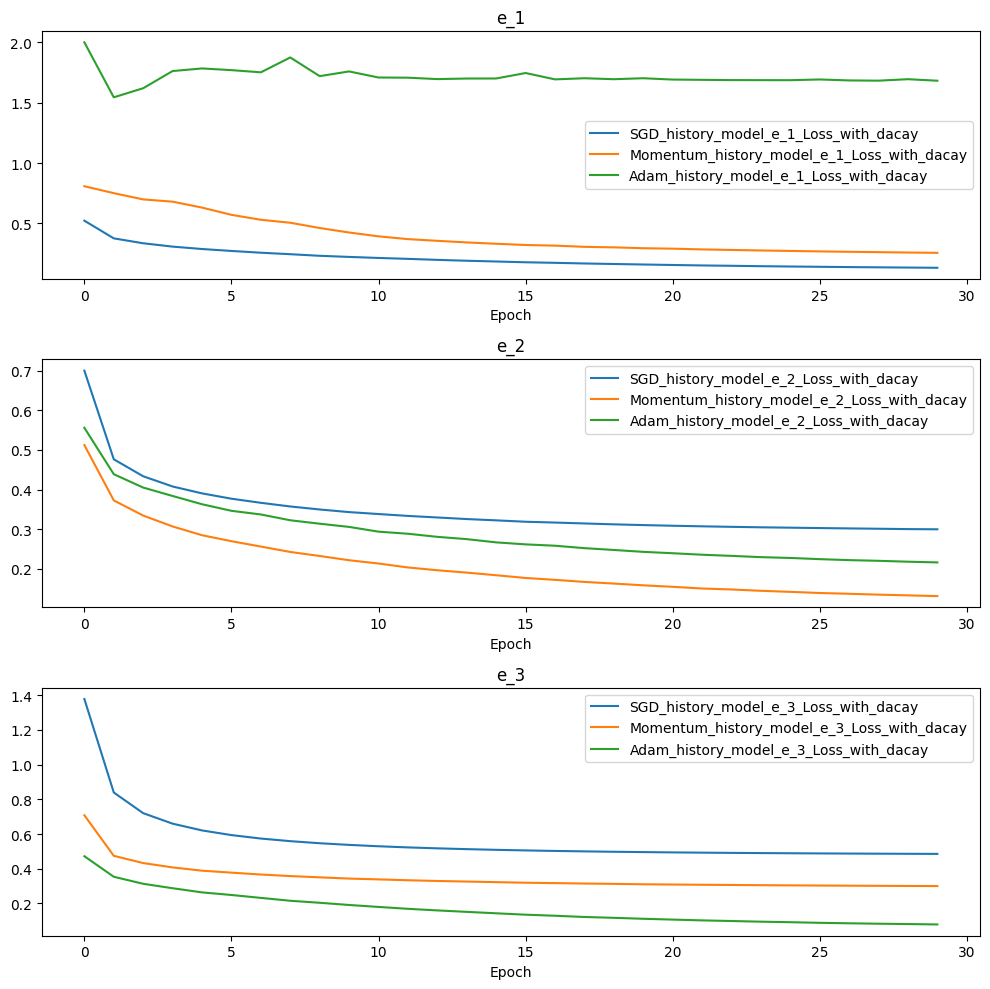

In [117]:
fig, axes = plt.subplots(3,1, figsize=(10,10))
for name, hist_list in hist_with.items():
  for index, history in enumerate(hist_list):
    axes[index].plot(history[0], label=f"{name}_history_model_e_{index+1}_Loss_with_dacay")

    axes[index].set_title(f"e_{index+1}")
    axes[index].set_xlabel("Epoch")
    axes[index].legend()

plt.tight_layout()
plt.show()

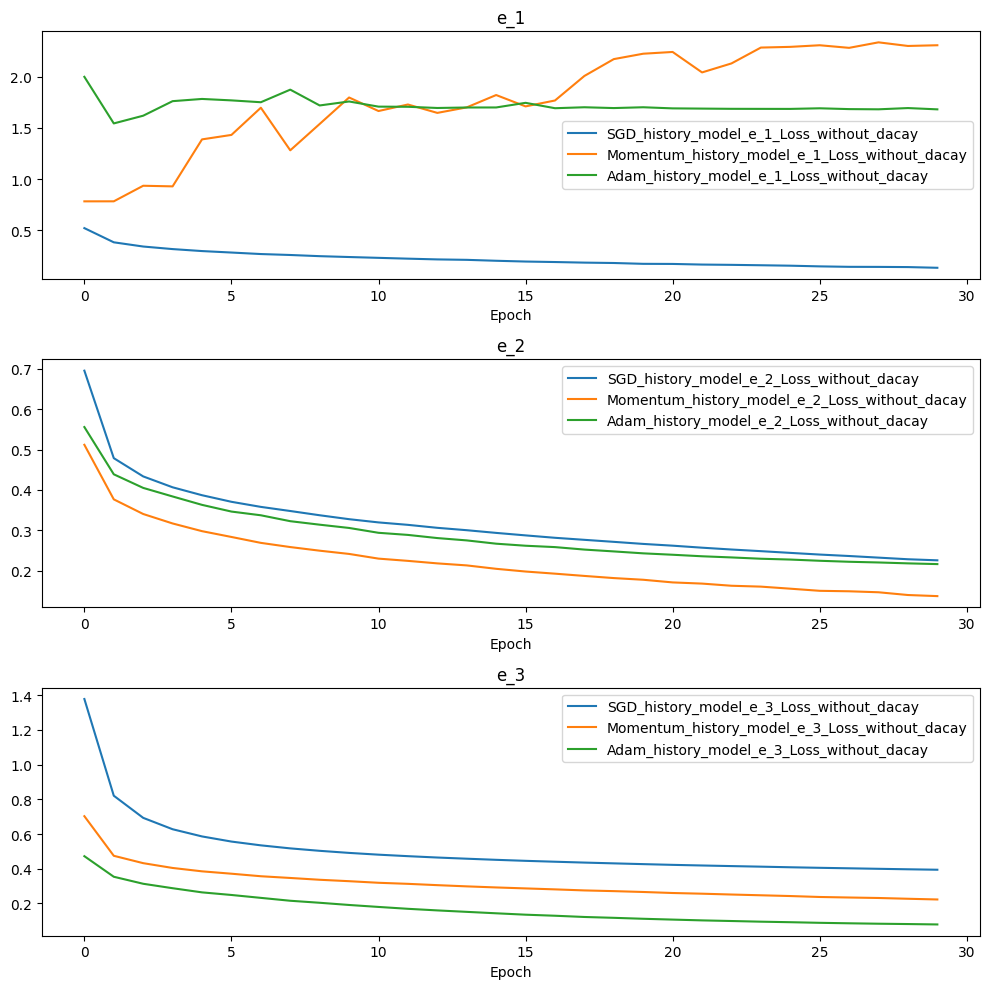

In [118]:
fig, axes = plt.subplots(3,1, figsize=(10,10))
for name, hist_list in hist_without.items():
  for index, history in enumerate(hist_list):
    axes[index].plot(history[0], label=f"{name}_history_model_e_{index+1}_Loss_without_dacay")

    axes[index].set_title(f"e_{index+1}")
    axes[index].set_xlabel("Epoch")
    axes[index].legend()

plt.tight_layout()
plt.show()

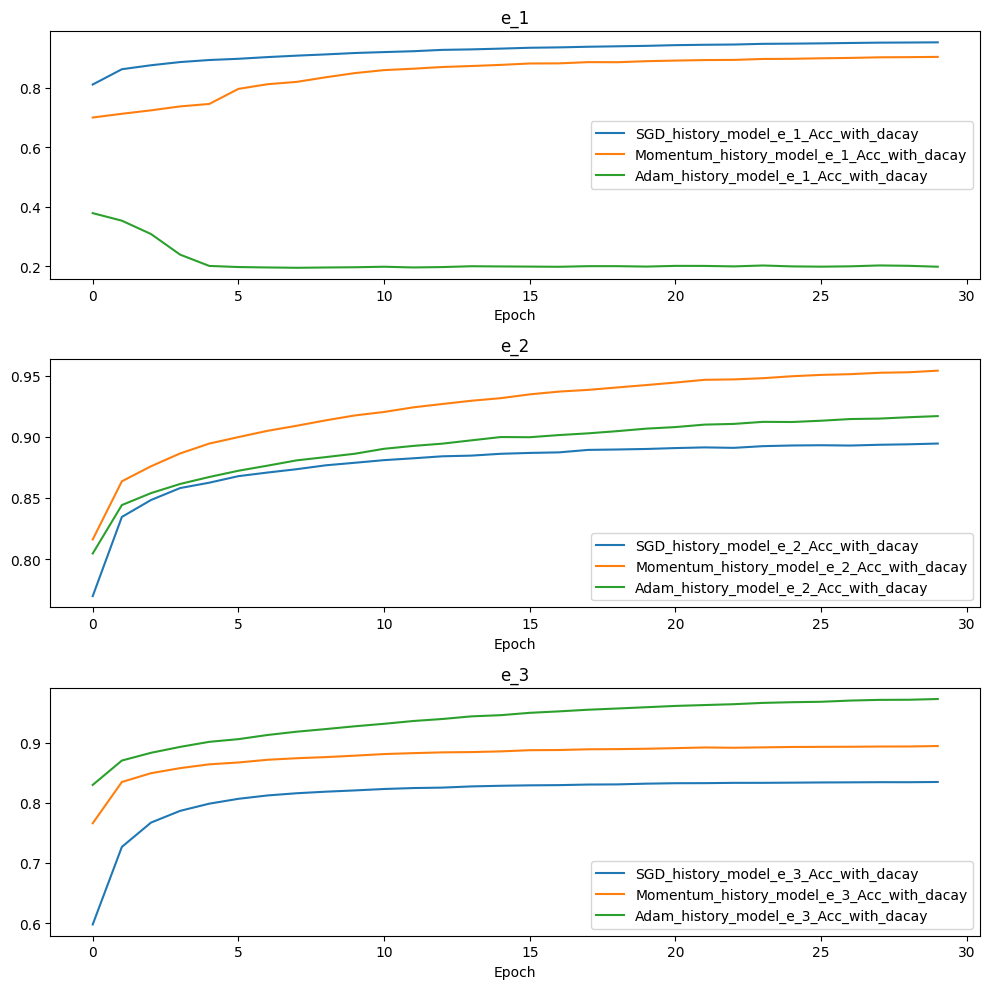

In [119]:
fig, axes = plt.subplots(3,1, figsize=(10,10))
for name, hist_list in hist_with.items():
  for index, history in enumerate(hist_list):
    axes[index].plot(history[1], label=f"{name}_history_model_e_{index+1}_Acc_with_dacay")

    axes[index].set_title(f"e_{index+1}")
    axes[index].set_xlabel("Epoch")
    axes[index].legend()

plt.tight_layout()
plt.show()

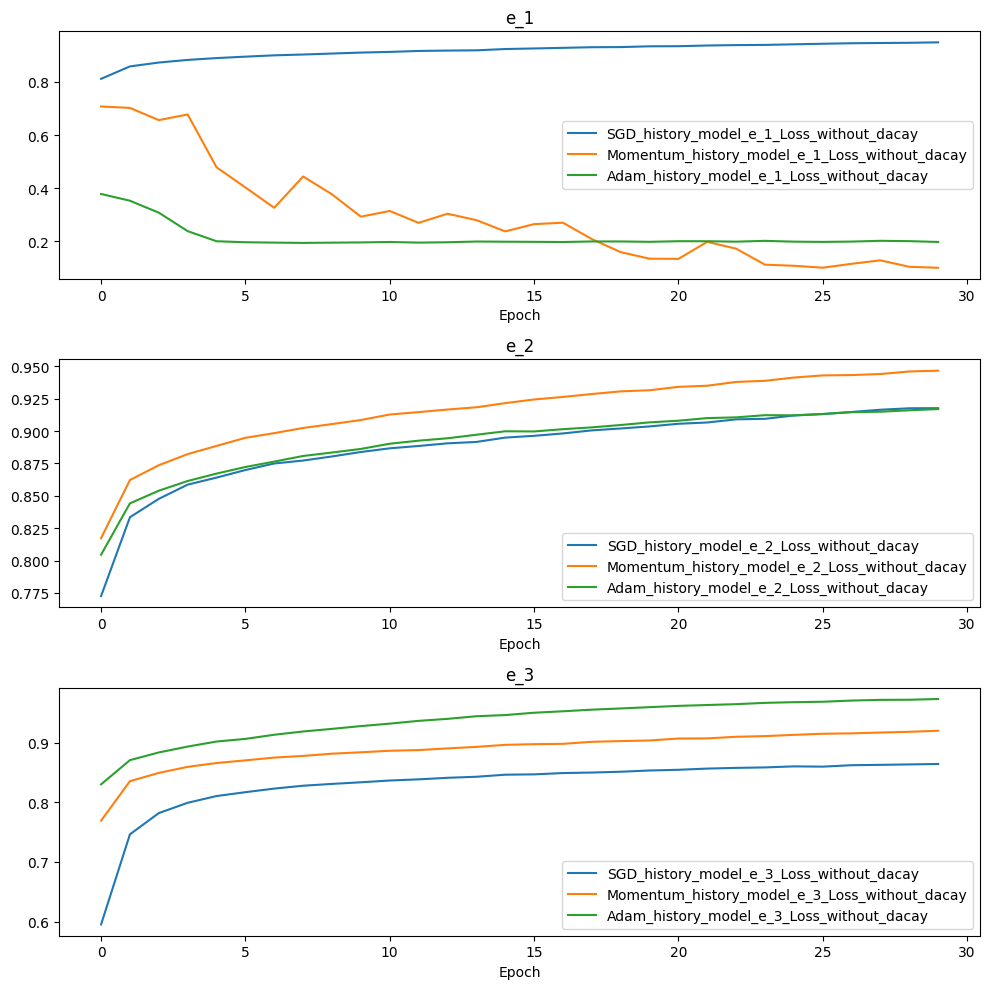

In [120]:
fig, axes = plt.subplots(3,1, figsize=(10,10))
for name, hist_list in hist_without.items():
  for index, history in enumerate(hist_list):
    axes[index].plot(history[1], label=f"{name}_history_model_e_{index+1}_Loss_without_dacay")

    axes[index].set_title(f"e_{index+1}")
    axes[index].set_xlabel("Epoch")
    axes[index].legend()

plt.tight_layout()
plt.show()

### Gradient 분석

#### 0.1 LR

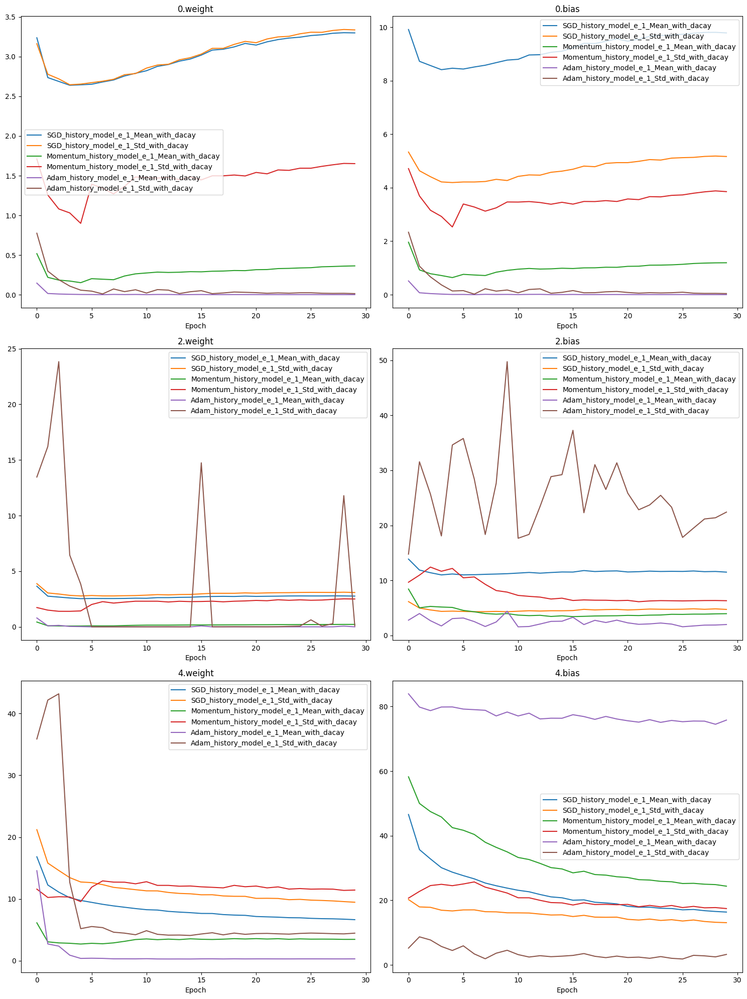

In [121]:
fig, axes = plt.subplots(3,2, figsize=(15,20))
for optim_name, hist_list in hist_with.items():
  for index, history in enumerate(hist_list):
    for j, name in enumerate(history[2][0]):
      if index != 0 :
        continue
      mean = []
      std = []
      for i in range(len(history[2])):
        flatten_tensor = history[2][i][name].detach().cpu().flatten()
        mean.append(flatten_tensor.mean())
        std.append(flatten_tensor.std())

      axes[j//2, j%2].plot(mean, label=f"{optim_name}_history_model_e_{index+1}_Mean_with_dacay")
      axes[j//2, j%2].plot(std, label=f"{optim_name}_history_model_e_{index+1}_Std_with_dacay")

      axes[j//2, j%2].set_title(name)
      axes[j//2, j%2].set_xlabel("Epoch")
      axes[j//2, j%2].legend()

plt.tight_layout()
plt.show()

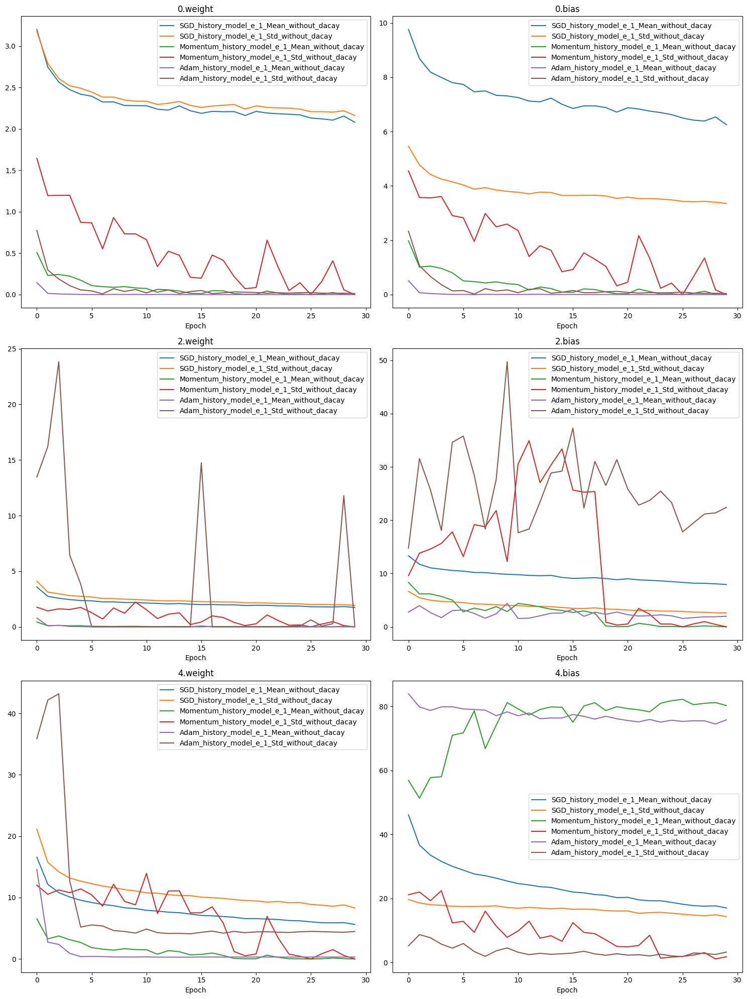

In [122]:
fig, axes = plt.subplots(3,2, figsize=(15,20))
for optim_name, hist_list in hist_without.items():
  for index, history in enumerate(hist_list):
    for j, name in enumerate(history[2][0]):
      if index != 0 :
        continue
      mean = []
      std = []
      for i in range(len(history[2])):
        flatten_tensor = history[2][i][name].detach().cpu().flatten()
        mean.append(flatten_tensor.mean())
        std.append(flatten_tensor.std())

      axes[j//2, j%2].plot(mean, label=f"{optim_name}_history_model_e_{index+1}_Mean_without_dacay")
      axes[j//2, j%2].plot(std, label=f"{optim_name}_history_model_e_{index+1}_Std_without_dacay")

      axes[j//2, j%2].set_title(name)
      axes[j//2, j%2].set_xlabel("Epoch")
      axes[j//2, j%2].legend()
plt.tight_layout()
plt.show()

#### 0.01 LR

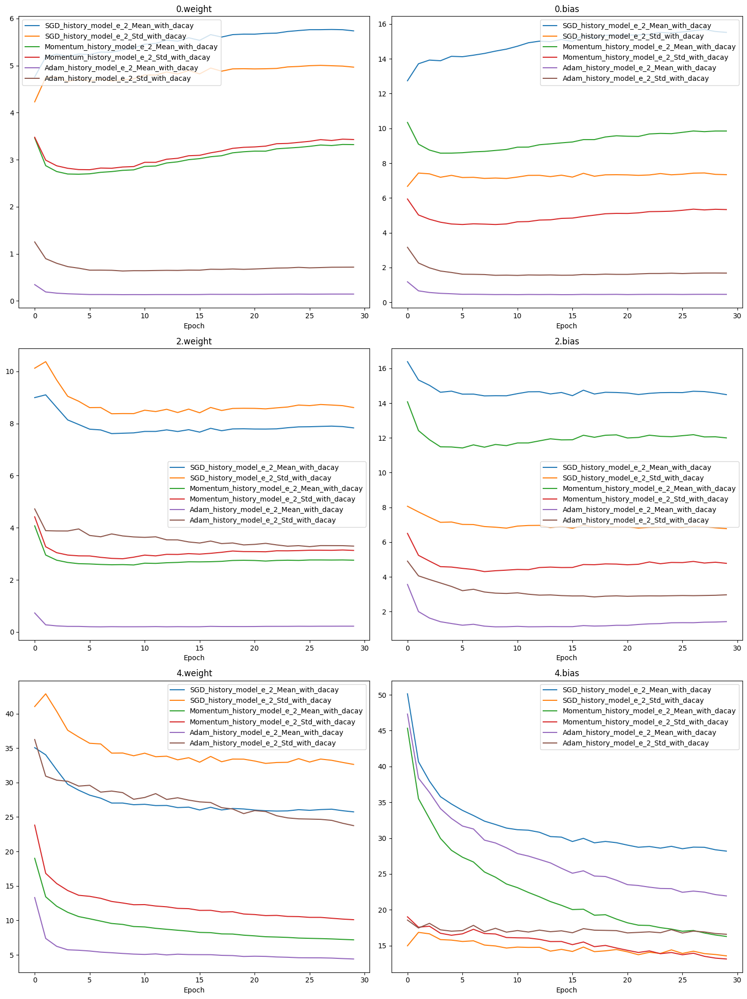

In [123]:
fig, axes = plt.subplots(3,2, figsize=(15,20))
for optim_name, hist_list in hist_with.items():
  for index, history in enumerate(hist_list):
    for j, name in enumerate(history[2][0]):
      if index != 1 :
        continue
      mean = []
      std = []
      for i in range(len(history[2])):
        flatten_tensor = history[2][i][name].detach().cpu().flatten()
        mean.append(flatten_tensor.mean())
        std.append(flatten_tensor.std())

      axes[j//2, j%2].plot(mean, label=f"{optim_name}_history_model_e_{index+1}_Mean_with_dacay")
      axes[j//2, j%2].plot(std, label=f"{optim_name}_history_model_e_{index+1}_Std_with_dacay")

      axes[j//2, j%2].set_title(name)
      axes[j//2, j%2].set_xlabel("Epoch")
      axes[j//2, j%2].legend()

plt.tight_layout()
plt.show()

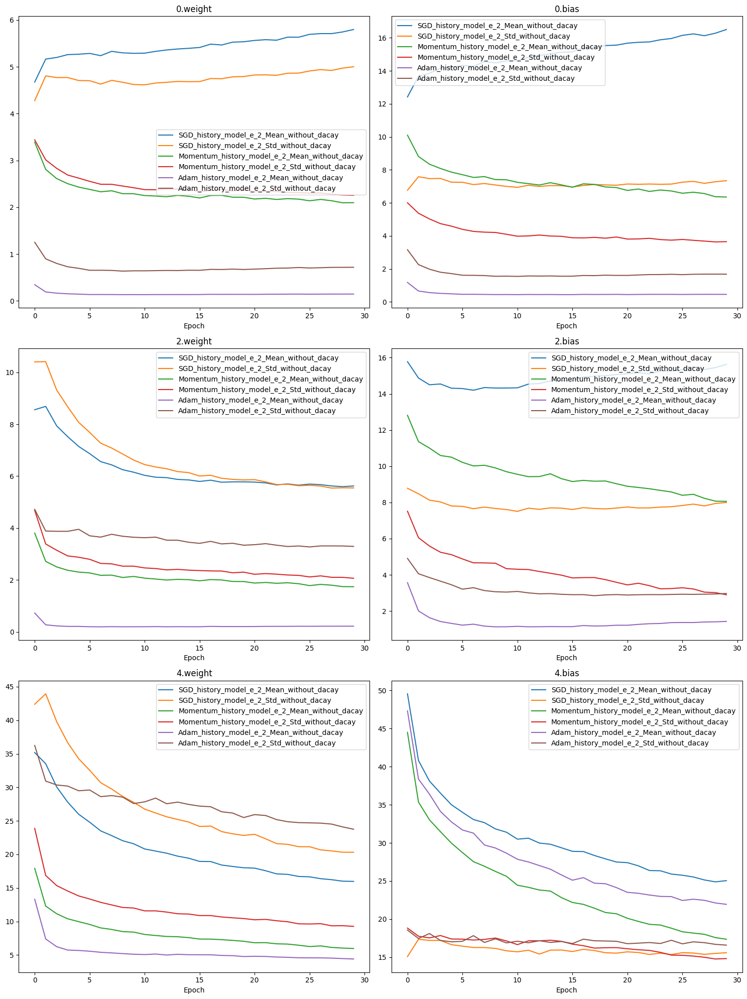

In [124]:
fig, axes = plt.subplots(3,2, figsize=(15,20))
for optim_name, hist_list in hist_without.items():
  for index, history in enumerate(hist_list):
    for j, name in enumerate(history[2][0]):
      if index != 1 :
        continue
      mean = []
      std = []
      for i in range(len(history[2])):
        flatten_tensor = history[2][i][name].detach().cpu().flatten()
        mean.append(flatten_tensor.mean())
        std.append(flatten_tensor.std())

      axes[j//2, j%2].plot(mean, label=f"{optim_name}_history_model_e_{index+1}_Mean_without_dacay")
      axes[j//2, j%2].plot(std, label=f"{optim_name}_history_model_e_{index+1}_Std_without_dacay")

      axes[j//2, j%2].set_title(name)
      axes[j//2, j%2].set_xlabel("Epoch")
      axes[j//2, j%2].legend()
plt.tight_layout()
plt.show()

#### 0.001 LR

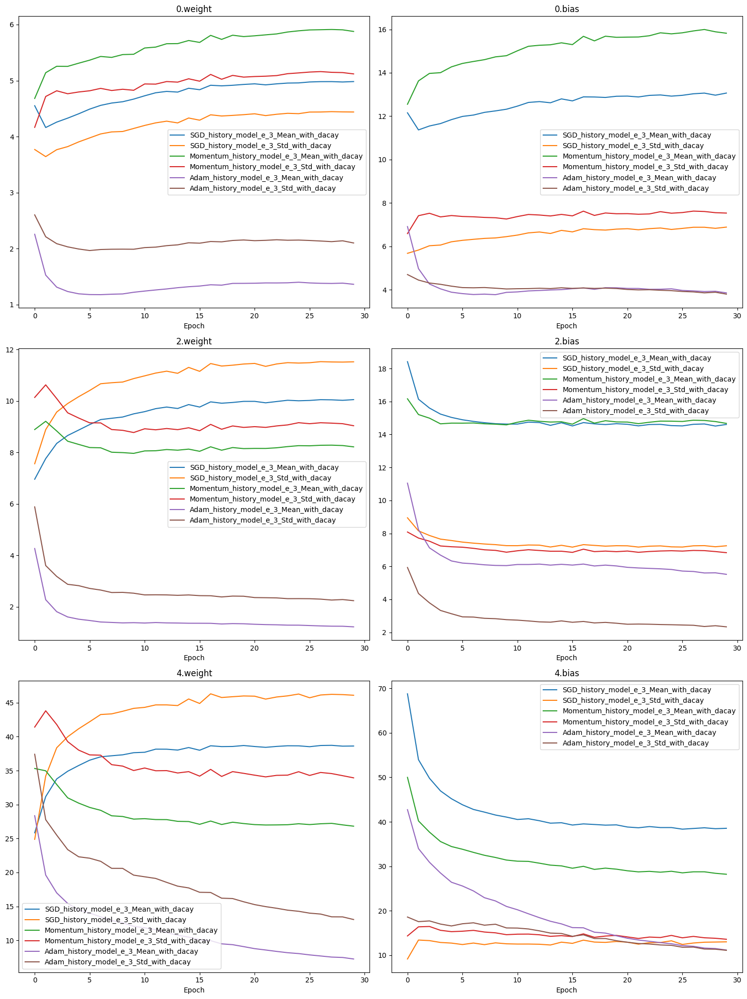

In [125]:
fig, axes = plt.subplots(3,2, figsize=(15,20))
for optim_name, hist_list in hist_with.items():
  for index, history in enumerate(hist_list):
    for j, name in enumerate(history[2][0]):
      if index != 2 :
        continue
      mean = []
      std = []
      for i in range(len(history[2])):
        flatten_tensor = history[2][i][name].detach().cpu().flatten()
        mean.append(flatten_tensor.mean())
        std.append(flatten_tensor.std())

      axes[j//2, j%2].plot(mean, label=f"{optim_name}_history_model_e_{index+1}_Mean_with_dacay")
      axes[j//2, j%2].plot(std, label=f"{optim_name}_history_model_e_{index+1}_Std_with_dacay")

      axes[j//2, j%2].set_title(name)
      axes[j//2, j%2].set_xlabel("Epoch")
      axes[j//2, j%2].legend()

plt.tight_layout()
plt.show()

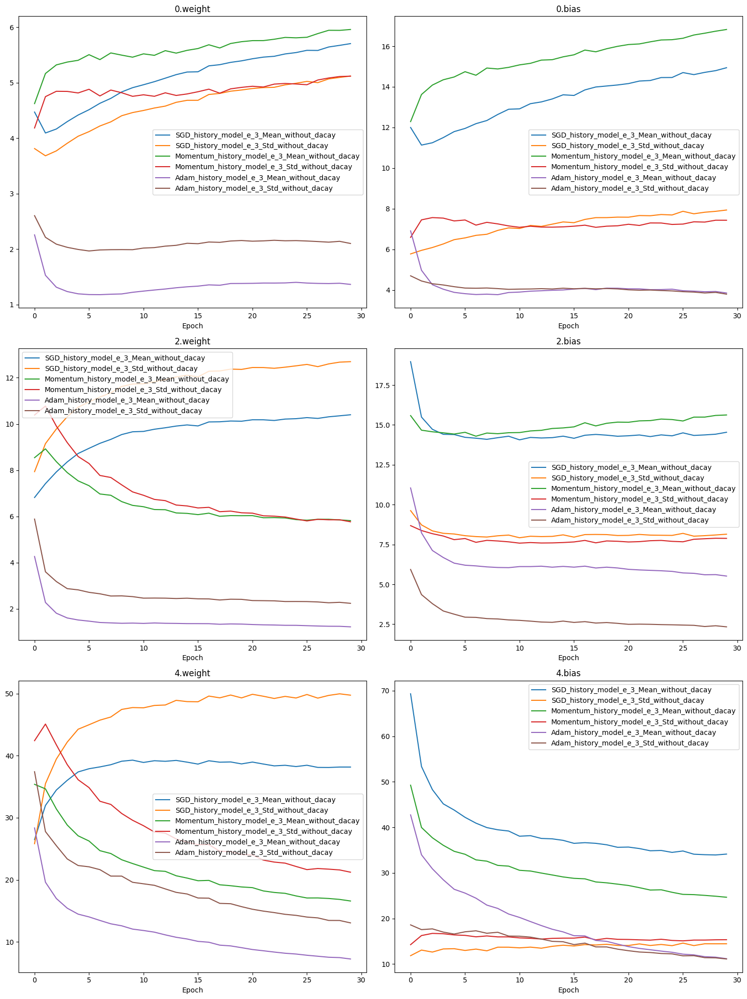

In [126]:
fig, axes = plt.subplots(3,2, figsize=(15,20))
for optim_name, hist_list in hist_without.items():
  for index, history in enumerate(hist_list):
    for j, name in enumerate(history[2][0]):
      if index != 2 :
        continue
      mean = []
      std = []
      for i in range(len(history[2])):
        flatten_tensor = history[2][i][name].detach().cpu().flatten()
        mean.append(flatten_tensor.mean())
        std.append(flatten_tensor.std())

      axes[j//2, j%2].plot(mean, label=f"{optim_name}_history_model_e_{index+1}_Mean_without_dacay")
      axes[j//2, j%2].plot(std, label=f"{optim_name}_history_model_e_{index+1}_Std_without_dacay")

      axes[j//2, j%2].set_title(name)
      axes[j//2, j%2].set_xlabel("Epoch")
      axes[j//2, j%2].legend()
plt.tight_layout()
plt.show()